# Import necessary libraries

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from scipy import stats
import os
import glob
import math
import itertools
import statsmodels.api as sm
sns.set()
pd.options.mode.chained_assignment = None  # default='warn'
import warnings
warnings.filterwarnings("ignore")

# Importing dataframes

## Defining cleaning functions

In [2]:
def item_header_clean(df):
    column_map = {
    "index" : "League",
    "League": "Date",
    "Date": "Id",
    "Id" : "Type"
    }
    df_indexreset = df.reset_index()
    df_renamed = df_indexreset.rename(columns = column_map)
    return df_renamed

def item_info_fix(df):
    cols_to_drop = ["Links", "Variant"]
    df_cols_dropped = df.drop(cols_to_drop, axis = 1)
    df_cols_dropped["BaseType"] = df_cols_dropped["BaseType"].fillna(df_cols_dropped["Type"])
    df_fixed = df_cols_dropped
    return df_fixed

def item_top_40_filter(df):
    median_series = df.groupby("Name")["Value"].agg("median")
    sorted_series = median_series.sort_values(ascending = False)
    top_40_list = list(sorted_series[:40].index)
    df_top_40 = df.loc[df["Name"].isin(top_40_list)]
    return df_top_40

def add_relative_date(df):
    df_copy = df
    df_copy["Date"] = df_copy["Date"].astype('datetime64[D]')
    startdate = df_copy["Date"].min()
    df_copy["RelativeDate"] = (df_copy["Date"] - startdate)
    df_edited = df_copy.drop("Date", axis = 1)
    df_edited["RelativeDate"] = pd.to_timedelta(df_edited["RelativeDate"], unit = "D")
    df_edited["RelativeDateInt"] = df_edited["RelativeDate"] / np.timedelta64(1, 'D')
    return df_edited

def league_lifespan(row):
    early_league = dt.timedelta(days = 14)
    mid_league = dt.timedelta(days = 60)
    if row["RelativeDate"] <= early_league:
        return "Early"
    elif row["RelativeDate"] <= mid_league:
        return "Mid"
    return "End"

def item_file_clean(df):
    df1 = item_header_clean(df)
    df2 = item_info_fix(df1)
    df3 = item_top_40_filter(df2)
    df4 = add_relative_date(df3)
    df4["League Lifespan"] = df4.apply(league_lifespan, axis = 1)
    return df4

def currency_info_fix(df):
    currency_to_drop = ["Portal Scroll", "Scroll of Wisdom", "Armourer's Scrap", "Perandus Coin", "Orb of Transmutation", "Blacksmith's Whetstone", "Orb of Augmentation", "Orb of Alteration", "Splinter of Tul", "Chromatic Orb", "Splinter of Esh", "Splinter of Xoph", "Orb of Chance", "Glassblower's Bauble", "Splinter of Uul-Netol", "Silver Coin"]
    df_currency_fixed = df.loc[~(df["Get"].isin(currency_to_drop) | df["Pay"].isin(currency_to_drop))]
    return df_currency_fixed

def currency_file_clean(df):
    df1 = currency_info_fix(df)
    df2 = add_relative_date(df1)
    df2["League Lifespan"] = df2.apply(league_lifespan, axis = 1)
    return df2

## File Import and Concatenation

In [3]:
# Import/Concatenate item files
item_df_list = []
for filename in glob.glob("[1-4]_items.csv"):
    df = pd.read_csv(filename, delimiter = ";", low_memory = False)
    df_edited = item_file_clean(df)
    item_df_list.append(df_edited)
item_df = pd.concat(item_df_list, axis = 0)
del item_df_list
item_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21009 entries, 11926 to 226813
Data columns (total 10 columns):
League             21009 non-null object
Id                 21009 non-null int64
Type               21009 non-null object
Name               21009 non-null object
BaseType           21009 non-null object
Value              21009 non-null float64
Confidence         21009 non-null object
RelativeDate       21009 non-null timedelta64[ns]
RelativeDateInt    21009 non-null float64
League Lifespan    21009 non-null object
dtypes: float64(2), int64(1), object(6), timedelta64[ns](1)
memory usage: 1.8+ MB


In [4]:
#Import/Concatenate currency files
currency_df_list = []
for filename in glob.glob("*_currency.csv"):
    df = pd.read_csv(filename, delimiter = ";", low_memory = False)
    df_edited = currency_file_clean(df)
    currency_df_list.append(df_edited)
currency_df = pd.concat(currency_df_list, axis = 0)
del currency_df_list
currency_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56661 entries, 356 to 11655
Data columns (total 8 columns):
League             56661 non-null object
Get                56661 non-null object
Pay                56661 non-null object
Value              56661 non-null float64
Confidence         56661 non-null object
RelativeDate       56661 non-null timedelta64[ns]
RelativeDateInt    56661 non-null float64
League Lifespan    56661 non-null object
dtypes: float64(2), object(5), timedelta64[ns](1)
memory usage: 3.9+ MB


## Paring down item table to only include items common across all leagues

In [5]:
def common_items(df):
    unique_items = []
    for league in df.League.unique():
        league_df = df[df.League == league]
        unique_items.append(league_df.Name.unique().tolist())
    return list(set(unique_items[0]).intersection(*unique_items))

In [6]:
list_of_items = common_items(item_df)

#Remove specific items that don't make sense to track due to variations or lack of accessibility
items_to_remove = ["Eyes of the Greatwolf", "Demigod's Dominance"]
for item in items_to_remove:
    list_of_items.remove(item)

item_df_pared = item_df.loc[item_df["Name"].isin(list_of_items)]

#Set up specific item lists that group items with possible dependencies on each other
hh_items = ["The Fiend", "The Doctor", "Headhunter"]
chayula_items = ["United in Dream", "The Blue Nightmare", "The Green Nightmare", "The Red Nightmare"]
misc_items = ["Starforge", "The Retch", "Atziri's Disfavour", "Emperor's Mastery", "Skyforth", "Atziri's Acuity"]
misc_pd = ["House of Mirrors", "Trash to Treasure", "Fated Connections"]
list_of_groups = [hh_items, chayula_items, misc_items, misc_pd]
item_group_names = ["Headhunter Related Items", "Chayula Related Items", "Miscellaneous Items", "Miscellaneous Prophecies/Divination Cards"]

## Pare down both item and currency table to only include the last 90 days and not the first day

In [7]:
item_df_pared = item_df_pared[(item_df_pared["RelativeDateInt"] <= 90) & (item_df_pared["RelativeDateInt"] > 1)]
currency_df_pared = currency_df[(currency_df["RelativeDateInt"] <= 90) & (currency_df["RelativeDateInt"] > 1)]

# Exploratory Data Analysis (Visualization and Inferential Statistics)

## Visualization - Item Trends

### By League

In [8]:
league_indexed_items = item_df_pared.set_index("League")
league_indexed_items = league_indexed_items.sort_index()
league_name_list = list(league_indexed_items.index.unique())
league_name_list

['Abyss', 'Breach', 'Harbinger', 'Legacy']

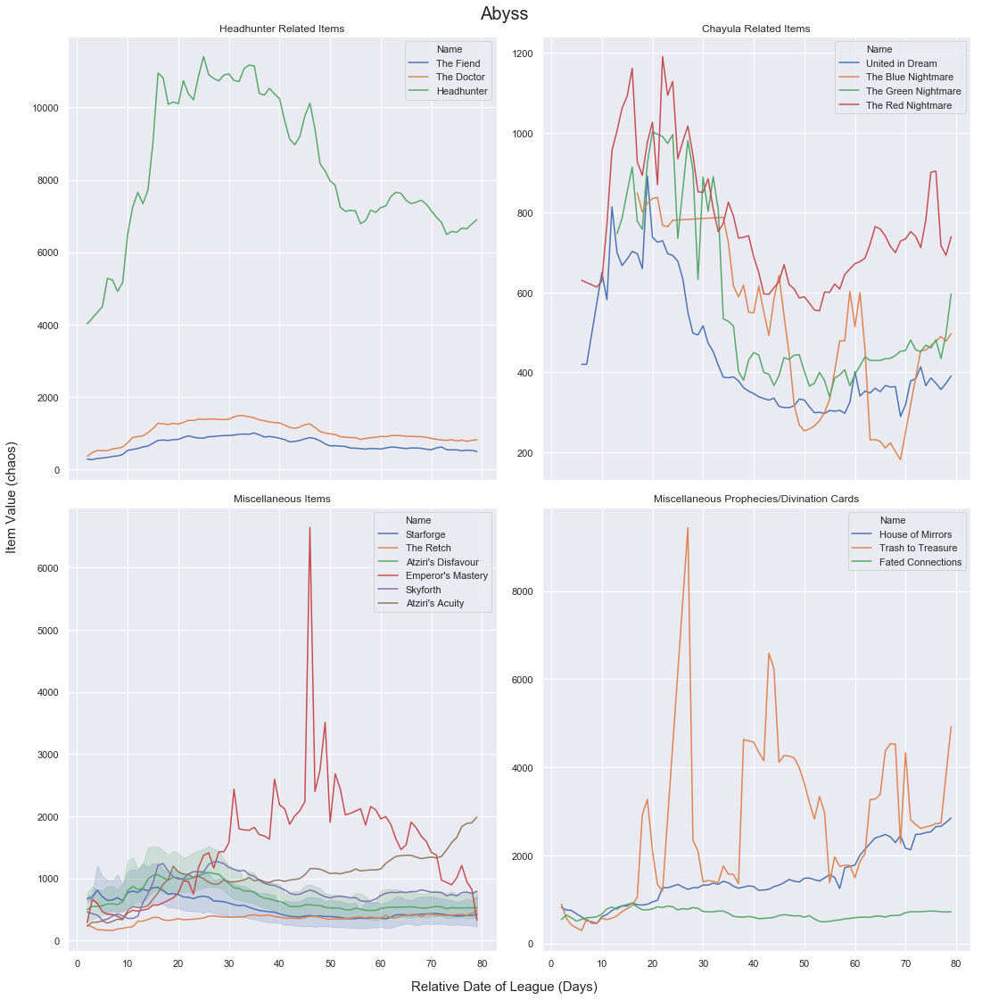

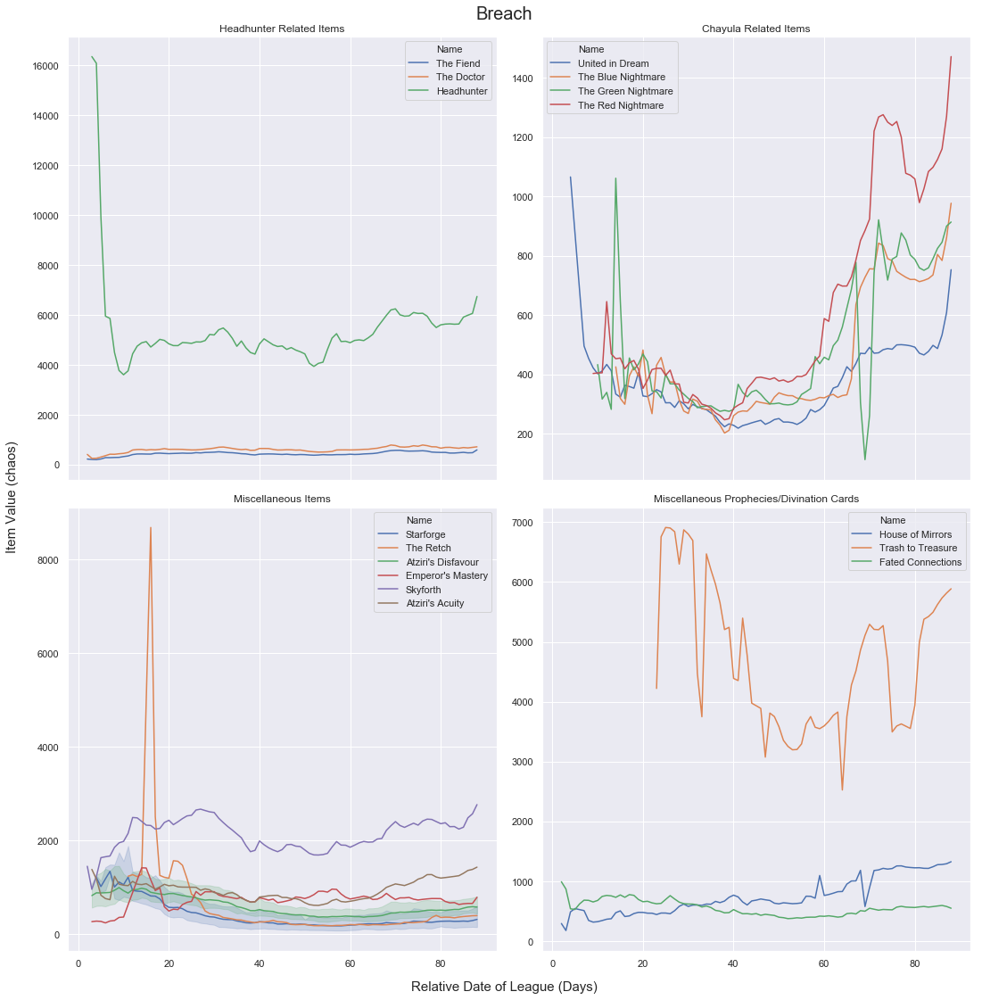

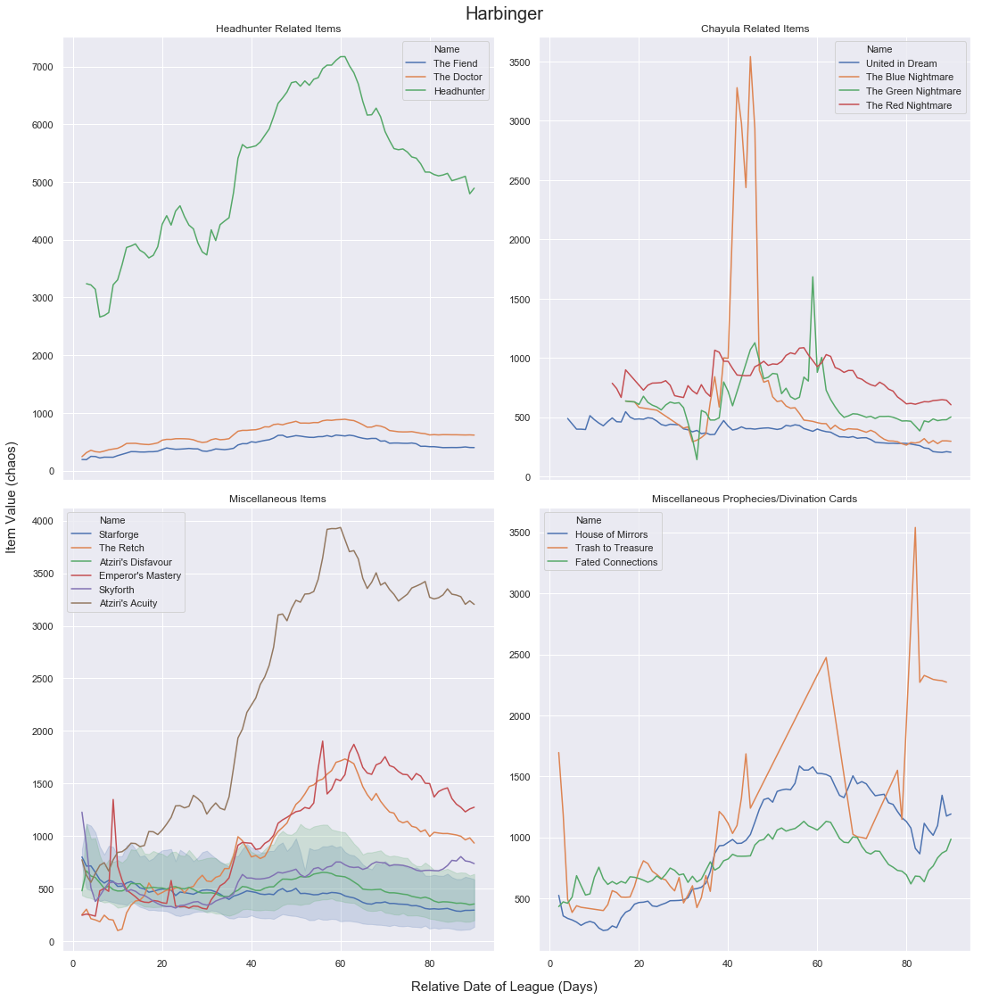

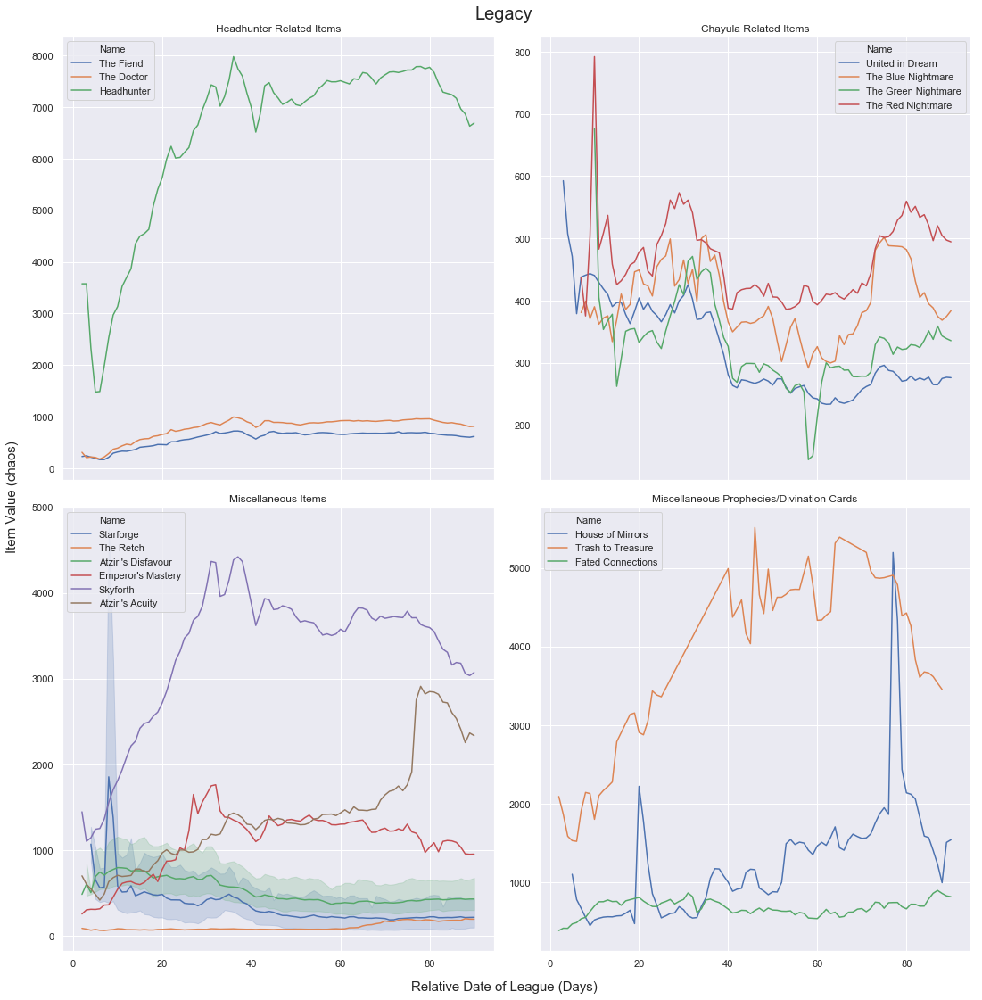

In [9]:
for league in league_name_list:
    league_items = league_indexed_items.loc[league]
    fig, axes = plt.subplots(2, 2, figsize = (15, 15), sharex = True)
    fig.text(0.5, -.01, 'Relative Date of League (Days)', ha='center', va='center', fontsize = 15)
    fig.text(-.01, 0.5, 'Item Value (chaos)', ha='center', va='center', fontsize = 15, rotation = "vertical")
    fig.text(0.5, 1, league, ha='center', va='center', fontsize = 20)
    for ax, i in zip(axes.flat, range(4)):
        df_items = league_items.loc[league_items["Name"].isin(list_of_groups[i])]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "Name", data = df_items, ax = ax, hue_order = list_of_groups[i])
        ax.set(xlabel = "", ylabel = "", title = item_group_names[i])
    fig.tight_layout()

### By Group

In [10]:
item_indexed_items = item_df_pared.set_index("Name")
item_indexed_items = item_indexed_items.sort_index()
item_name_list = list(item_indexed_items.index.unique())
print(item_name_list)

["Atziri's Acuity", "Atziri's Disfavour", "Emperor's Mastery", 'Fated Connections', 'Headhunter', 'House of Mirrors', 'Skyforth', 'Starforge', 'The Blue Nightmare', 'The Doctor', 'The Fiend', 'The Green Nightmare', 'The Red Nightmare', 'The Retch', 'Trash to Treasure', 'United in Dream']


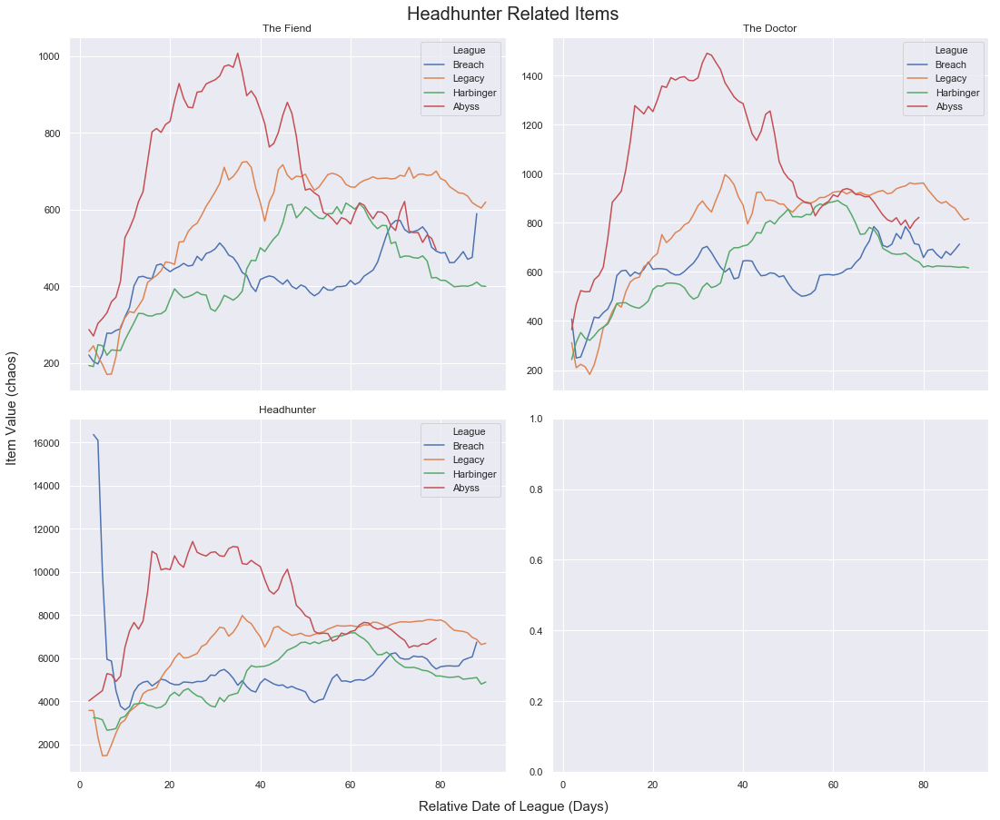

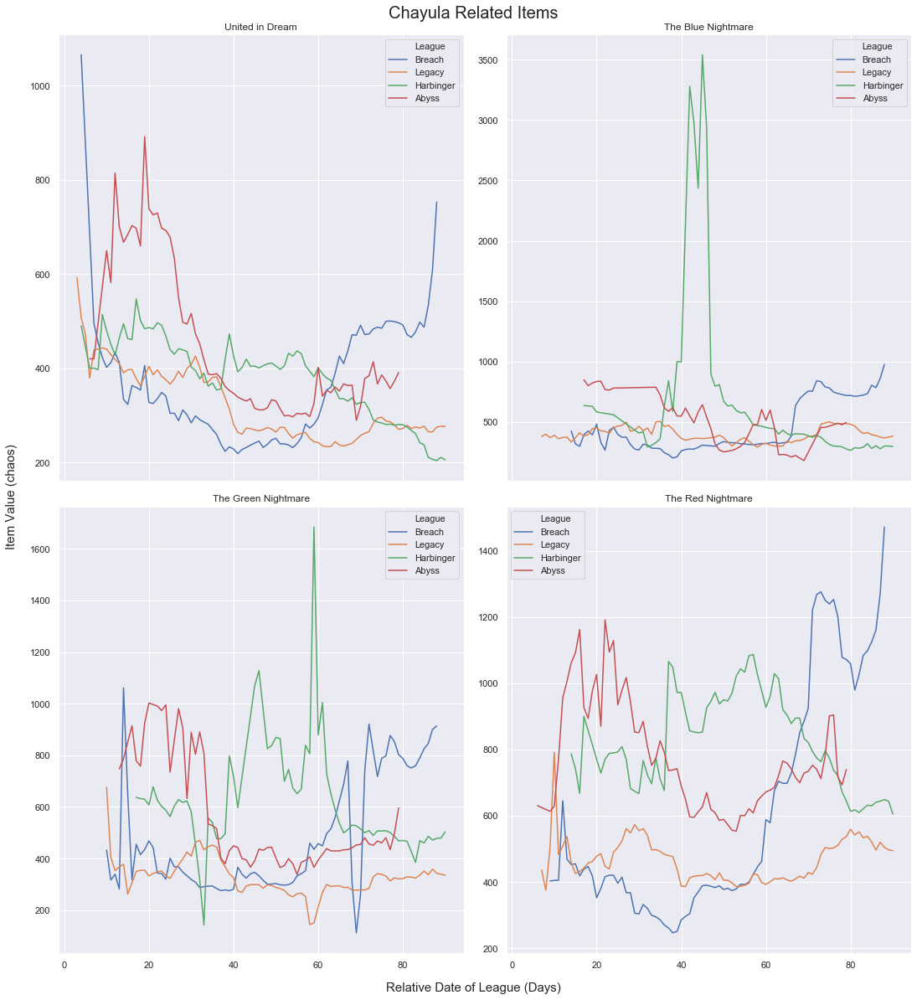

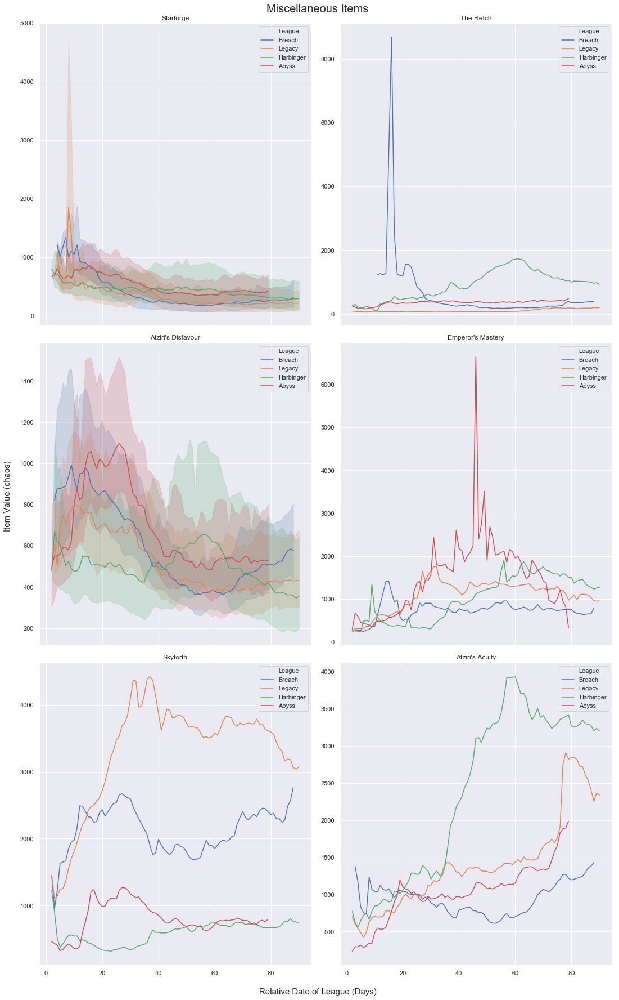

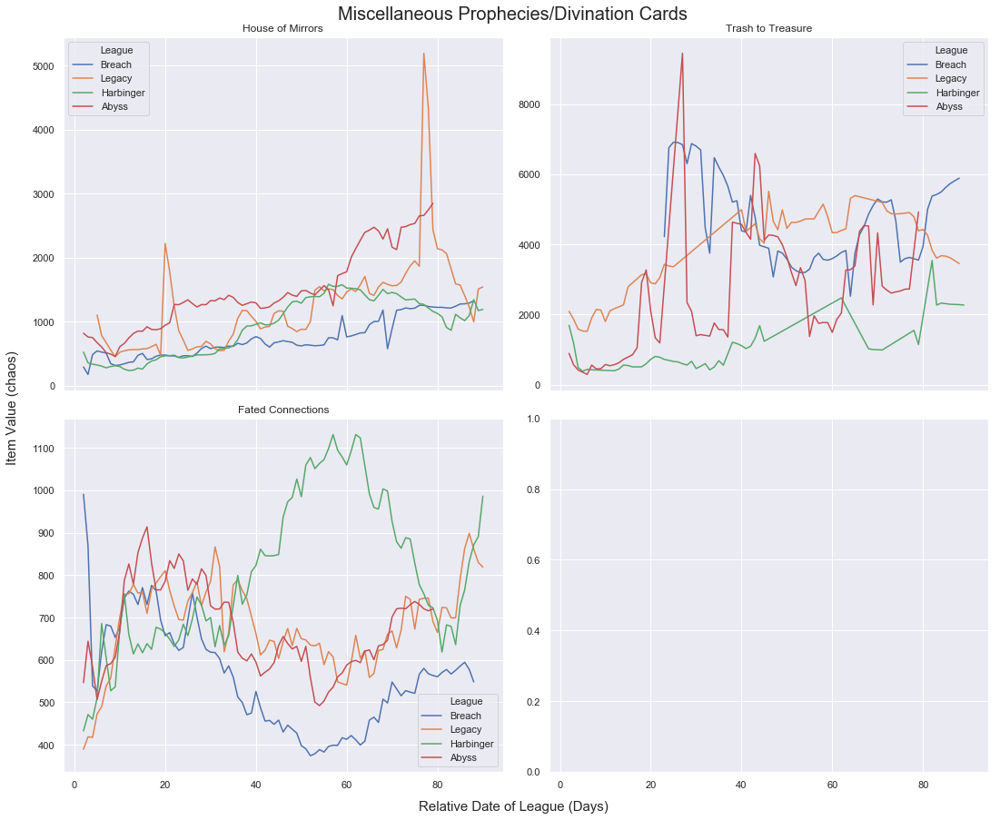

In [11]:
for group, i in zip(list_of_groups, range(len(list_of_groups))):
    fig, axes = plt.subplots(math.ceil(len(group)/2), 2, figsize = (15, len(group)*4), sharex = True)
    fig.text(0.5, -.01, 'Relative Date of League (Days)', ha='center', va='center', fontsize = 15)
    fig.text(-.01, 0.5, 'Item Value (chaos)', ha='center', va='center', fontsize = 15, rotation = "vertical")
    fig.text(0.5, 1, item_group_names[i], ha='center', va='center', fontsize = 20)
    for ax, item in zip(axes.flat, group):
        item_values = item_indexed_items.loc[item]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", 
                     data = item_values, hue_order = ["Breach", "Legacy", "Harbinger", "Abyss"], ax = ax)
        ax.set(xlabel = "", ylabel = "", title = item)
    fig.tight_layout()

### Box/Lineplot of unique items

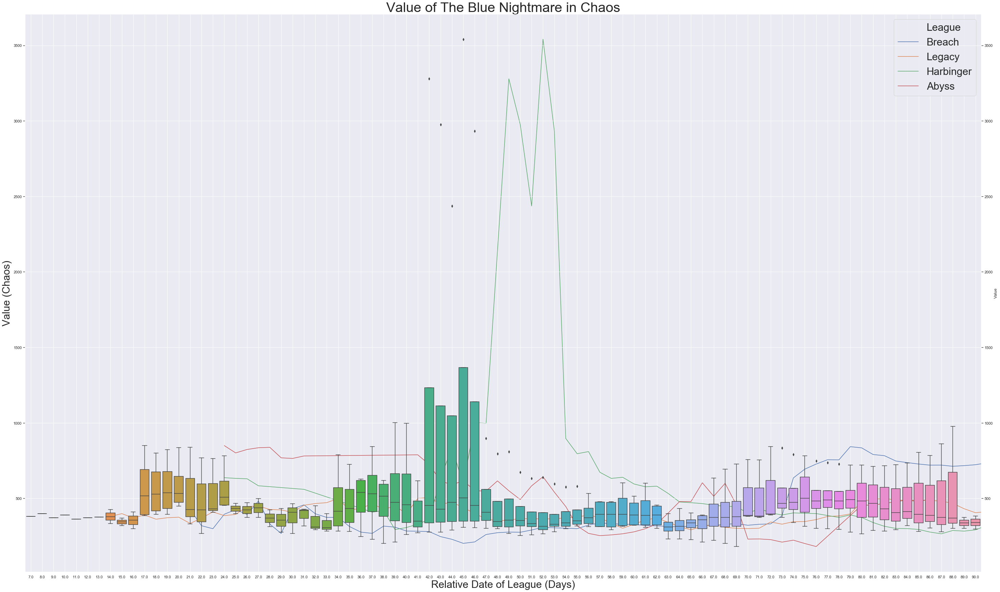

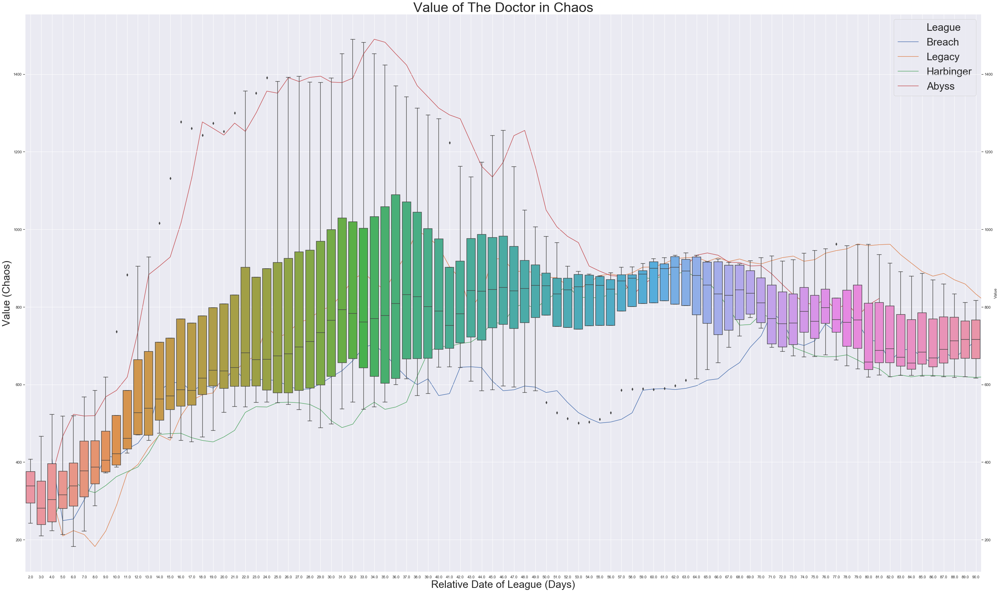

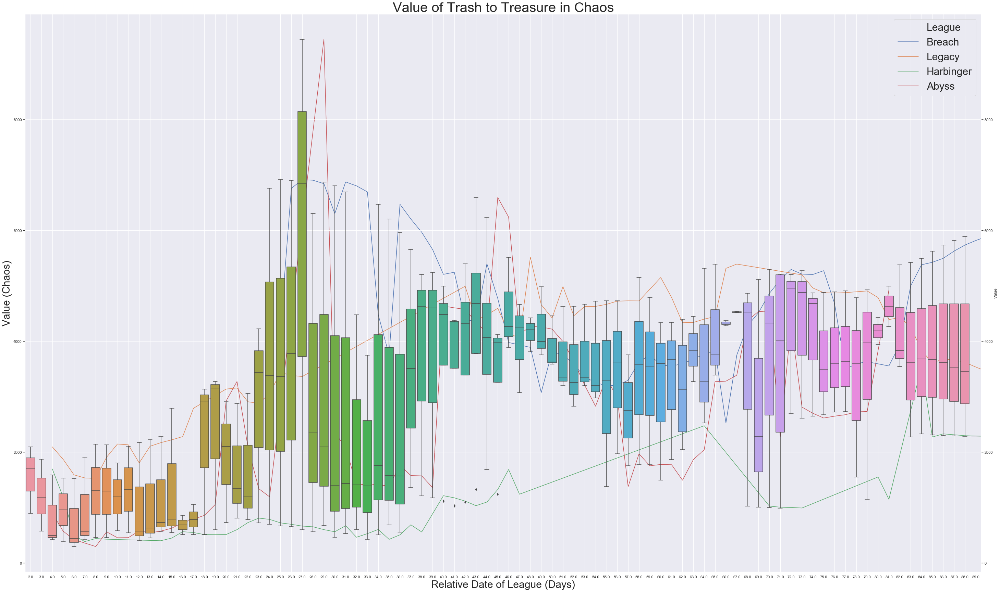

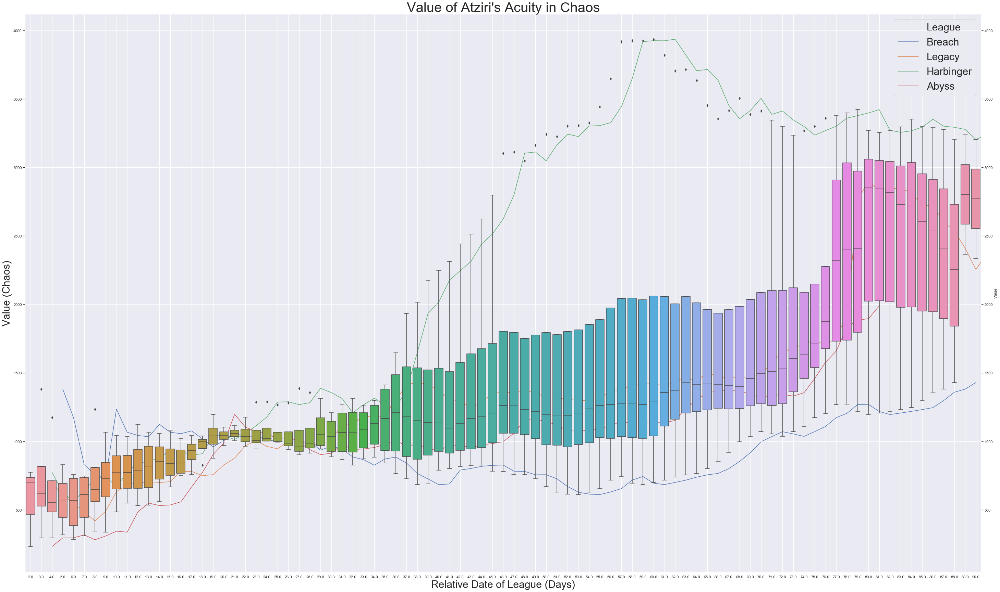

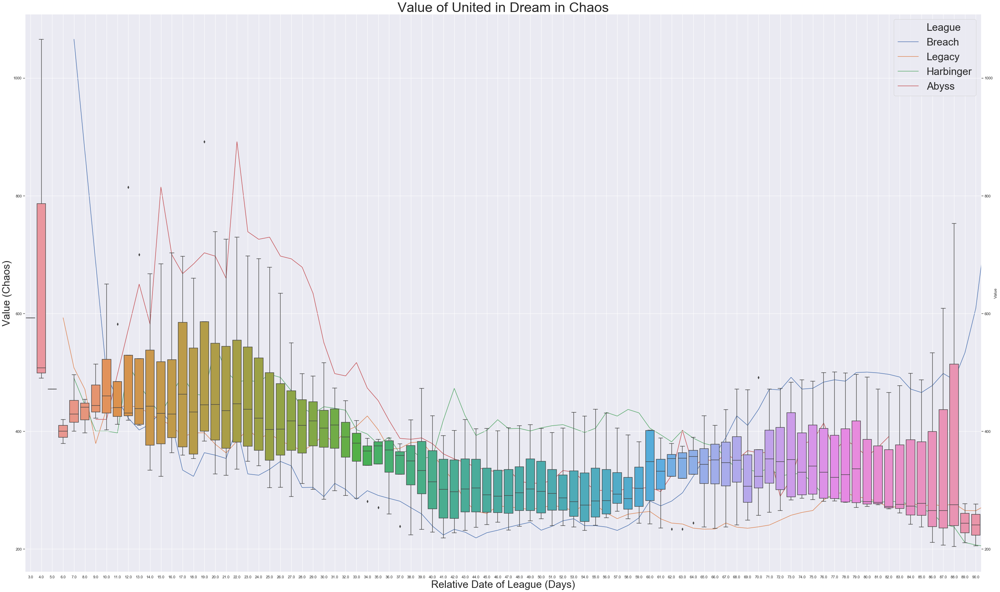

...

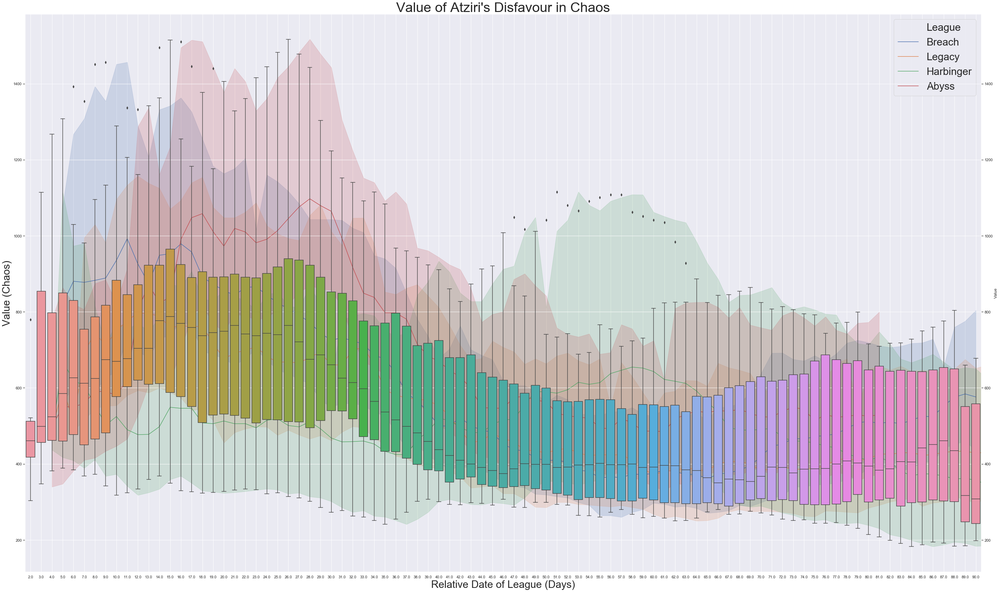

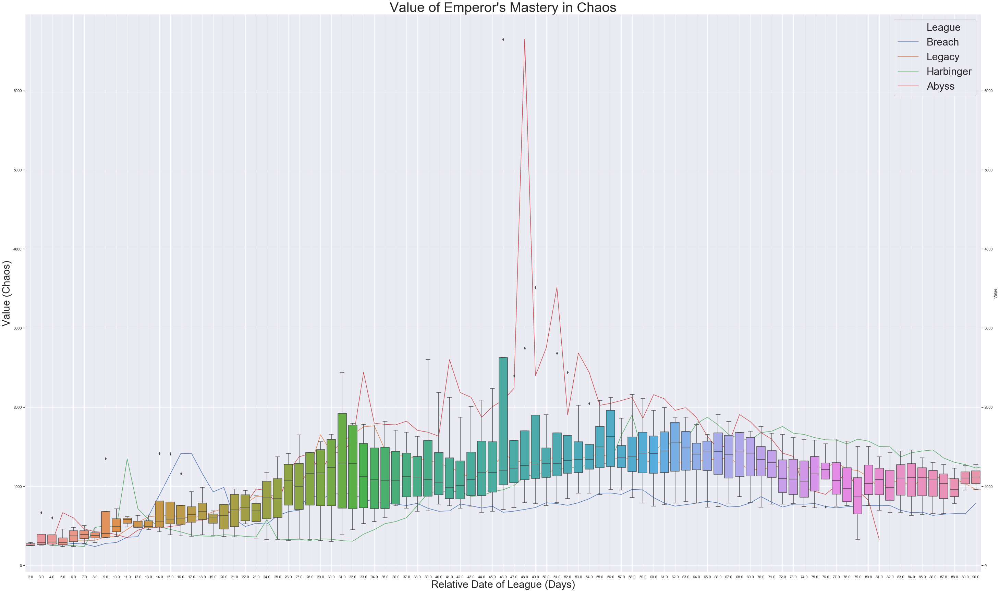

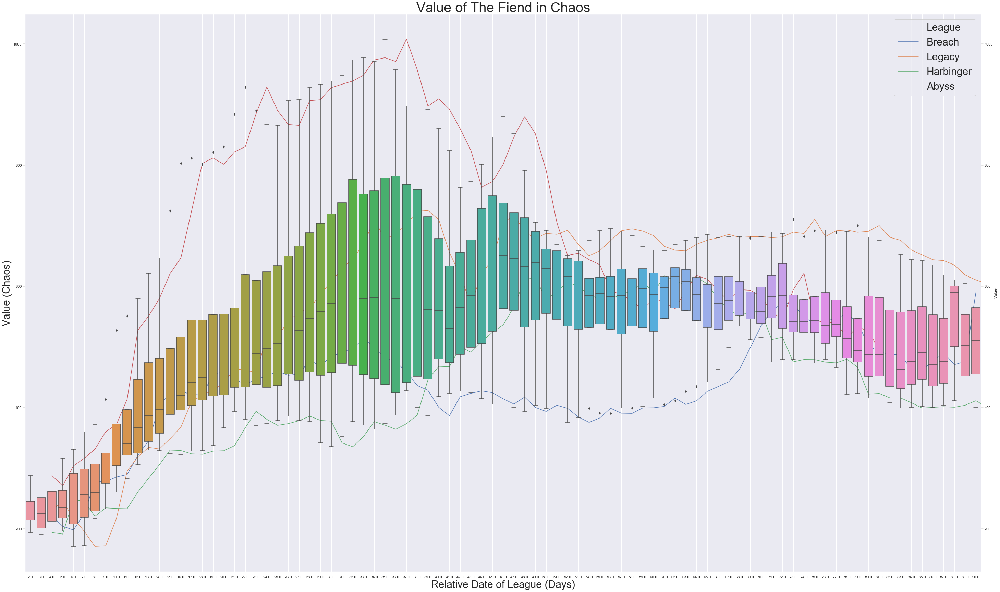

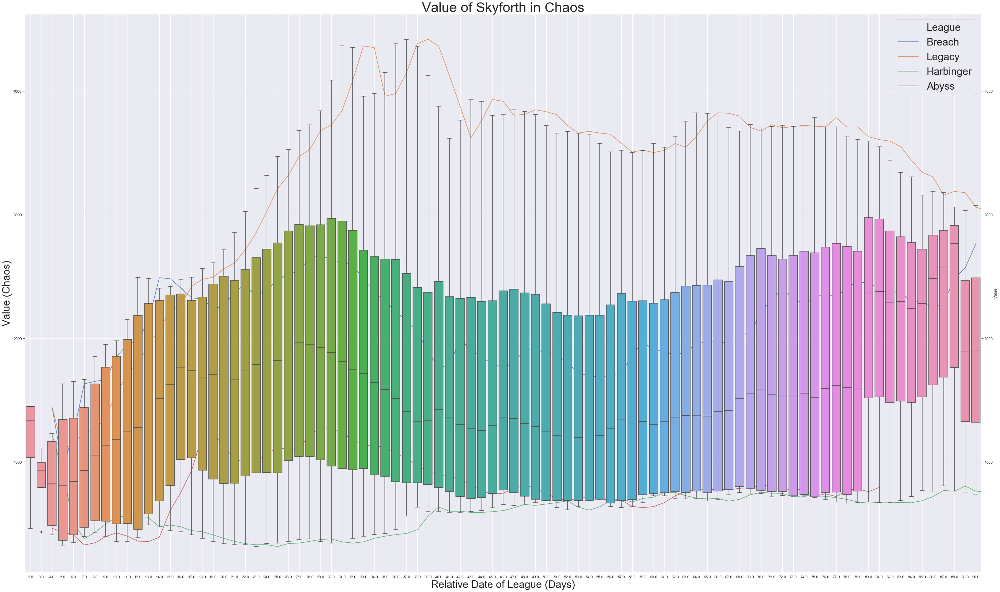

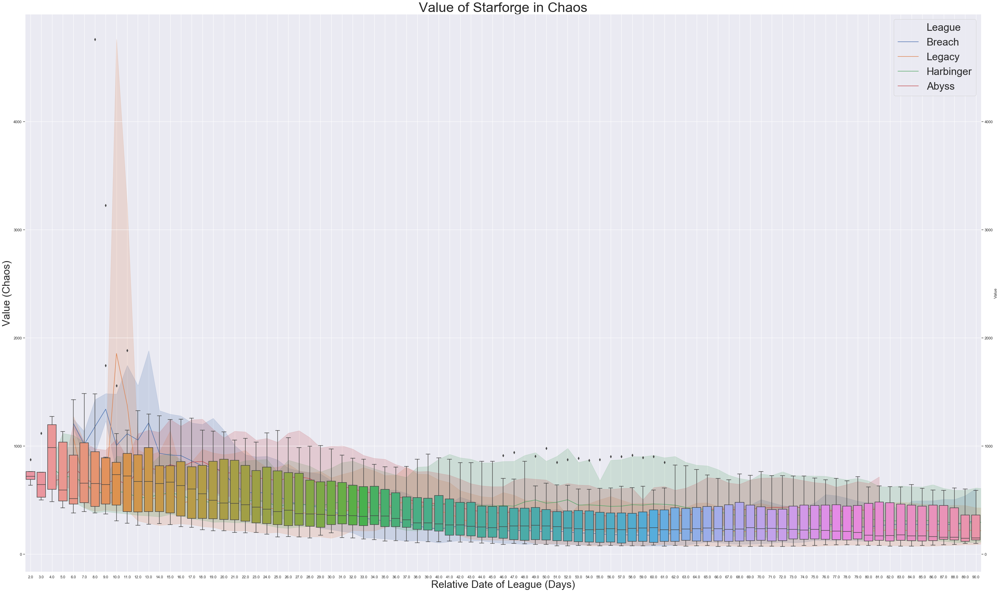

In [12]:
for item in list_of_items:
    df_items = item_df_pared.loc[item_df_pared["Name"] == item]
    plt.figure(figsize = (50, 30))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = df_items, 
                      hue = "League", hue_order = ["Breach", "Legacy", "Harbinger", "Abyss"])
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 30)
    ax.set_ylabel("Value (Chaos)", fontsize = 30)
    ax.set_title("Value of " + item + " in Chaos", fontsize = 40)
    ax.legend(fontsize = 30)
    ax2 = ax.twinx()
    ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = df_items)
    fig.tight_layout()

## Visualization - Currency Trends

### Additional Data Wrangling

In [13]:
# Pull out list of currency orbs that are found in across all leagues
def common_currency(df):
    unique_currencies = []
    for league in df.League.unique():
        league_df = df[df.League == league]
        unique_currencies.append(league_df.Get.unique().tolist())
        unique_currencies.append(league_df.Pay.unique().tolist())
    return list(set(unique_currencies[0]).intersection(*unique_currencies))

In [14]:
list_of_currencies = common_currency(currency_df_pared)
print(np.sort(list_of_currencies))
print(len(list_of_currencies))

["Apprentice Cartographer's Sextant" 'Blessed Orb' 'Blessing of Chayula'
 'Blessing of Esh' 'Blessing of Tul' 'Blessing of Uul-Netol'
 'Blessing of Xoph' "Cartographer's Chisel" 'Chaos Orb'
 "Chayula's Breachstone" 'Divine Orb' "Eber's Key" "Esh's Breachstone"
 'Exalted Orb' 'Fragment of the Chimera' 'Fragment of the Hydra'
 'Fragment of the Minotaur' 'Fragment of the Phoenix' "Gemcutter's Prism"
 "Inya's Key" "Jeweller's Orb" "Journeyman Cartographer's Sextant"
 "Master Cartographer's Sextant" 'Mortal Grief' 'Mortal Hope'
 'Mortal Ignorance' 'Mortal Rage' 'Offering to the Goddess'
 'Orb of Alchemy' 'Orb of Fusing' 'Orb of Regret' 'Orb of Scouring'
 'Regal Orb' 'Sacrifice at Dawn' 'Sacrifice at Dusk'
 'Sacrifice at Midnight' 'Sacrifice at Noon' 'Splinter of Chayula'
 "Tul's Breachstone" "Uul-Netol's Breachstone" 'Vaal Orb' "Volkuur's Key"
 "Xoph's Breachstone" "Yriel's Key"]
44


In [15]:
#pull out trades where only commonly traded currency orbs are used to initiate the trade (listed below)

currency_to_pay = ["Apprentice Cartographer's Sextant", "Blessed Orb", "Cartographer's Chisel",
                   "Chaos Orb", "Exalted Orb", "Journeyman Cartographer's Sextant", "Master Cartographer's Sextant", 
                   "Orb of Alchemy", "Orb of Fusing", "Regal Orb"]
currency_df_pared = currency_df_pared.loc[currency_df_pared["Get"].isin(list_of_currencies) & currency_df_pared["Pay"].isin(currency_to_pay)]
currency_df_pared.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26833 entries, 358 to 10516
Data columns (total 8 columns):
League             26833 non-null object
Get                26833 non-null object
Pay                26833 non-null object
Value              26833 non-null float64
Confidence         26833 non-null object
RelativeDate       26833 non-null timedelta64[ns]
RelativeDateInt    26833 non-null float64
League Lifespan    26833 non-null object
dtypes: float64(2), object(5), timedelta64[ns](1)
memory usage: 1.8+ MB


In [16]:
# Setting up different filter groups for the currencies based off of relatedness

exalts_divines = ["Exalted Orb", "Divine Orb"]
major_orbs = ["Orb of Regret", "Gemcutter's Prism", "Regal Orb", "Vaal Orb"]
minor_orbs = ["Blessed Orb", "Cartographer's Chisel", "Orb of Scouring", "Jeweller's Orb", "Orb of Alchemy", "Orb of Fusing"]
sextants = ["Apprentice Cartographer's Sextant", "Journeyman Cartographer's Sextant", "Master Cartographer's Sextant"]
atziri = ['Sacrifice at Dawn', 'Sacrifice at Dusk', 'Sacrifice at Midnight', 'Sacrifice at Noon']
uber_atziri = ['Mortal Grief', 'Mortal Hope', 'Mortal Ignorance', 'Mortal Rage']
shaper_frags = ['Fragment of the Chimera', 'Fragment of the Hydra', 'Fragment of the Minotaur', 'Fragment of the Phoenix']
breach_blessings = ['Blessing of Chayula', 'Blessing of Esh', 'Blessing of Tul', 'Blessing of Uul-Netol', 'Blessing of Xoph']
breach_items = ["Chayula's Breachstone", "Esh's Breachstone", "Tul's Breachstone",
                "Uul-Netol's Breachstone", "Splinter of Chayula"]
council_keys = ["Eber's Key", "Inya's Key", "Volkuur's Key", "Yriel's Key"]
offering = ["Offering to the Goddess"]

In [17]:
non_orb_groups = [sextants, atziri, uber_atziri, shaper_frags, breach_blessings, breach_items, council_keys, offering]
non_orb_groups_names = ["Sextants", "Atziri Fragments", "Uber Atziri Fragments", "Shaper Fragments", 
                        "Breach Blessings", "Breachstone Items", "Council Keys", "Offering to the Goddess"]

In [18]:
all_currency_groups = [exalts_divines, major_orbs, minor_orbs, sextants, atziri, uber_atziri, 
                       shaper_frags, breach_blessings, breach_items, council_keys, offering]
all_currency_groups_names = ["Exalts and Divines", "Major Trading Orbs", "Minor Trading Orbs", "Sextants", "Atziri Fragments", 
                             "Uber Atziri Fragments", "Shaper Fragments", "Breach Blessings", "Breachstone Items", 
                             "Council Keys", "Offering to the Goddess"]

### By League

In [19]:
league_indexed_currency = currency_df_pared.set_index("League")
league_indexed_currency = league_indexed_currency.sort_index()
league_indexed_currency.head()

,Get,Pay,Value,Confidence,RelativeDate,RelativeDateInt,League Lifespan
League,,,,,,,
Abyss,Esh's Breachstone,Chaos Orb,18.52948,High,9 days,9.0,Early
Abyss,Inya's Key,Chaos Orb,26.62255,High,42 days,42.0,Mid
Abyss,Inya's Key,Chaos Orb,25.84357,High,43 days,43.0,Mid
Abyss,Inya's Key,Chaos Orb,25.14665,High,44 days,44.0,Mid
Abyss,Inya's Key,Chaos Orb,23.55314,High,45 days,45.0,Mid


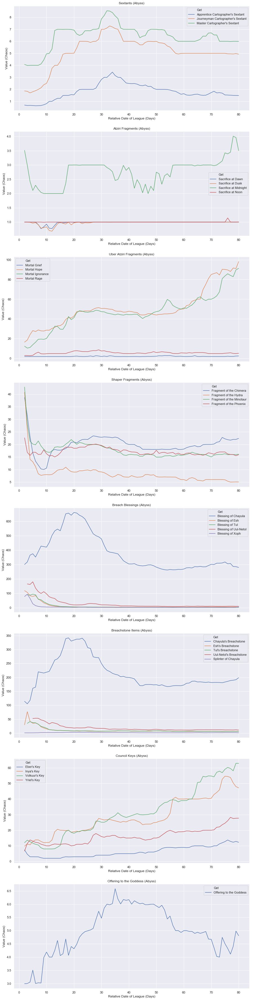

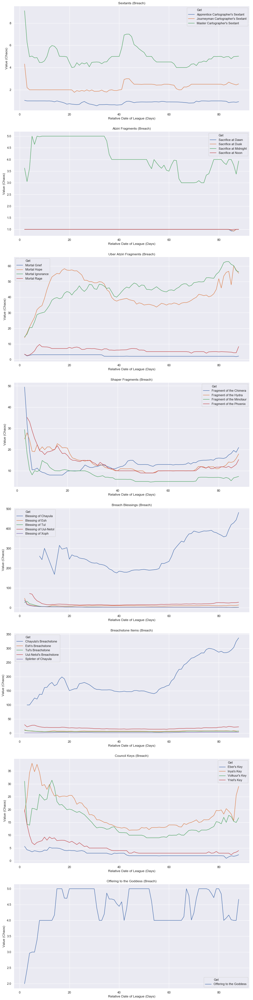

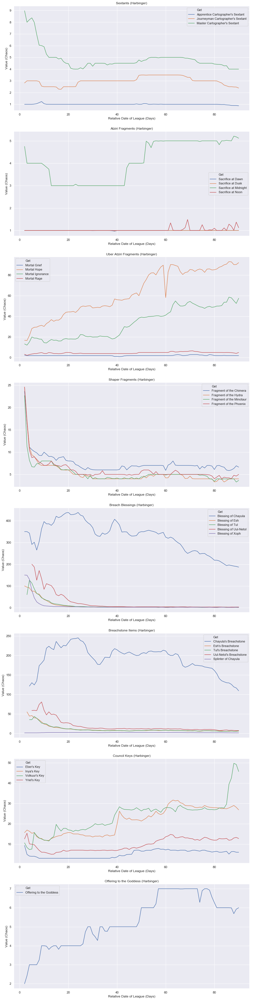

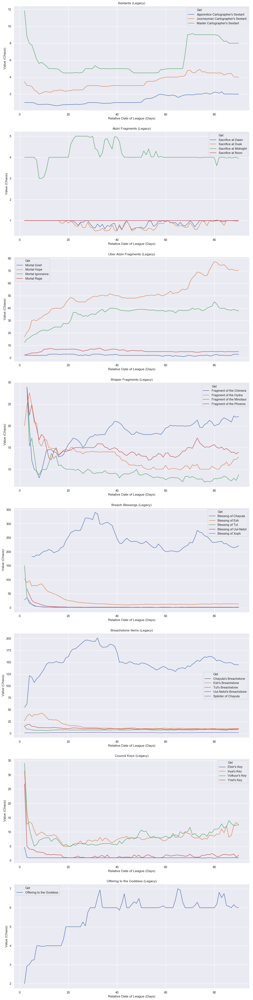

In [20]:
for league in league_name_list:
    league_currency = league_indexed_currency.loc[league]
    league_chaos = league_currency[league_currency.Pay == "Chaos Orb"]
    fig, axes = plt.subplots(len(non_orb_groups), 1, figsize = (15, len(non_orb_groups)*8))
    for ax, group, group_name in zip(axes.flat, non_orb_groups, non_orb_groups_names):
        df_currency = league_chaos.loc[league_chaos["Get"].isin(group)]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "Get", data = df_currency, ax = ax, hue_order = group)
        ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Value (Chaos)", title = group_name + " (" + league + ")")

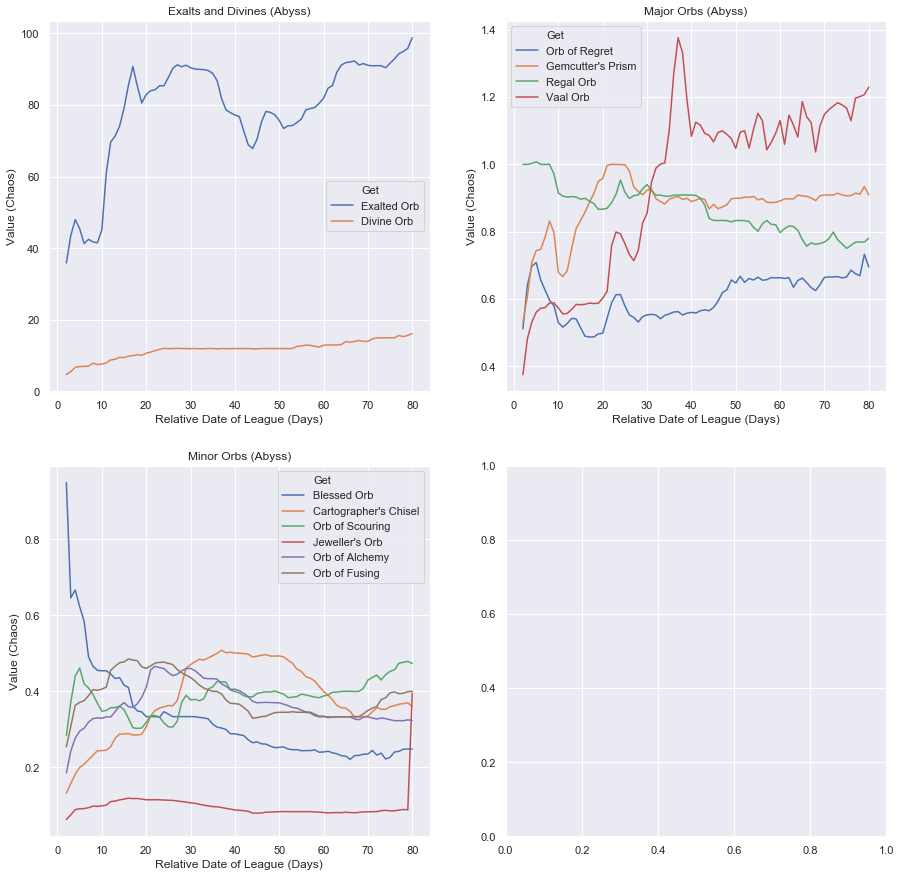

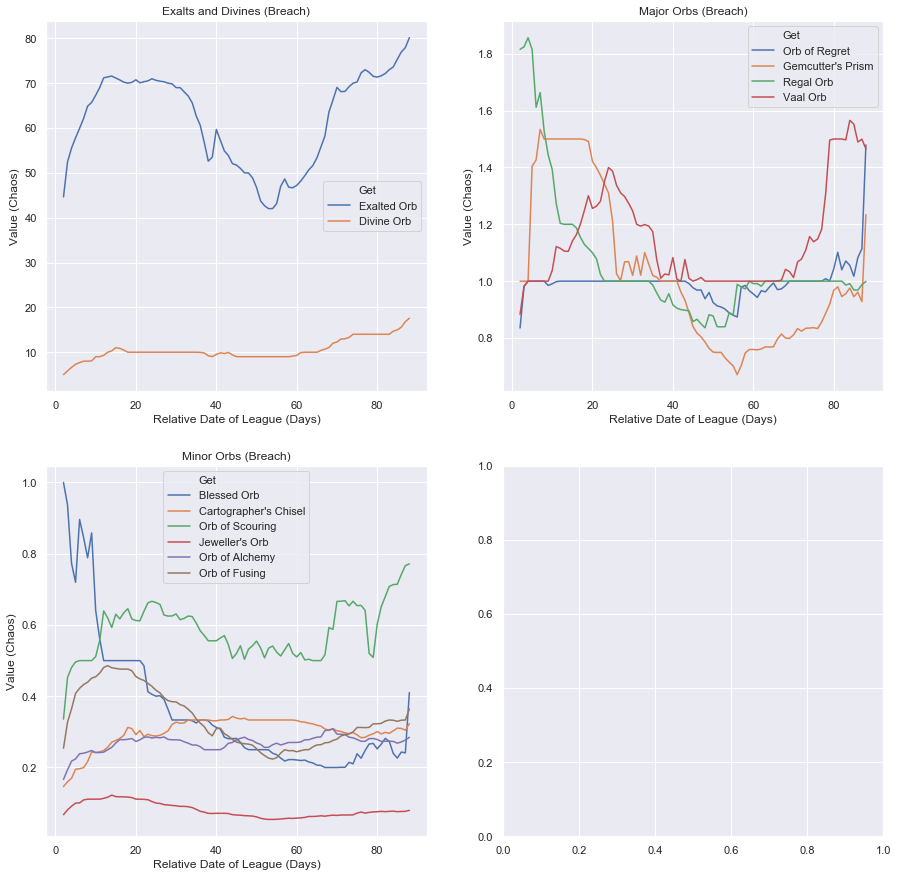

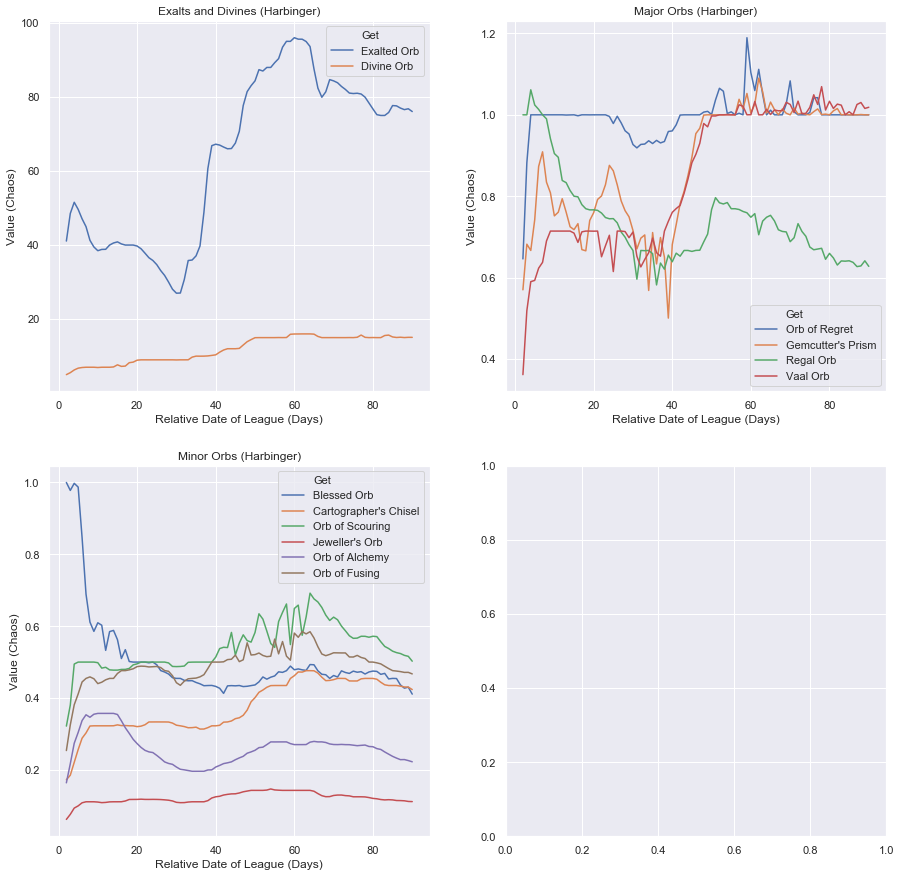

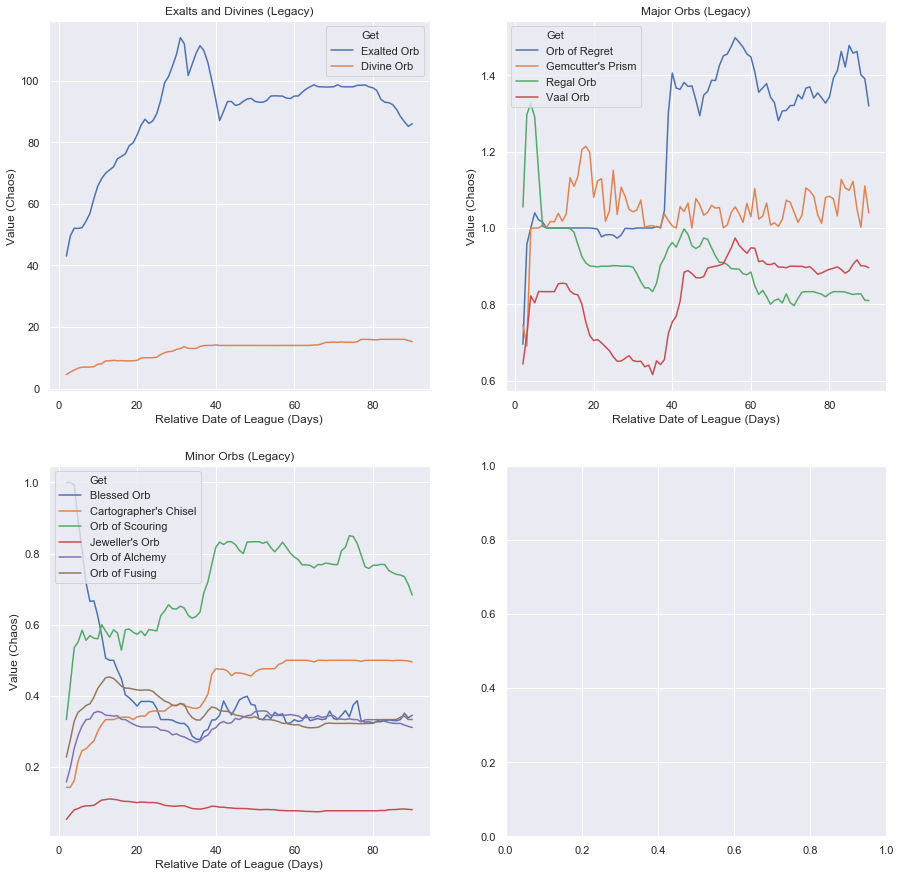

In [21]:
for league in league_name_list:
    league_currency = league_indexed_currency.loc[league]
    league_chaos = league_currency[league_currency.Pay == "Chaos Orb"]
    fig, axes = plt.subplots(2, 2, figsize = (15, 15))
    for ax, group, group_name in zip(axes.flat, [exalts_divines, major_orbs, minor_orbs], ["Exalts and Divines", "Major Orbs", "Minor Orbs"]):
        df_currency = league_chaos.loc[league_chaos["Get"].isin(group)]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "Get", data = df_currency, ax = ax, hue_order = group)
        ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Value (Chaos)", title = group_name + " (" + league + ")")

#### Box/Lineplots

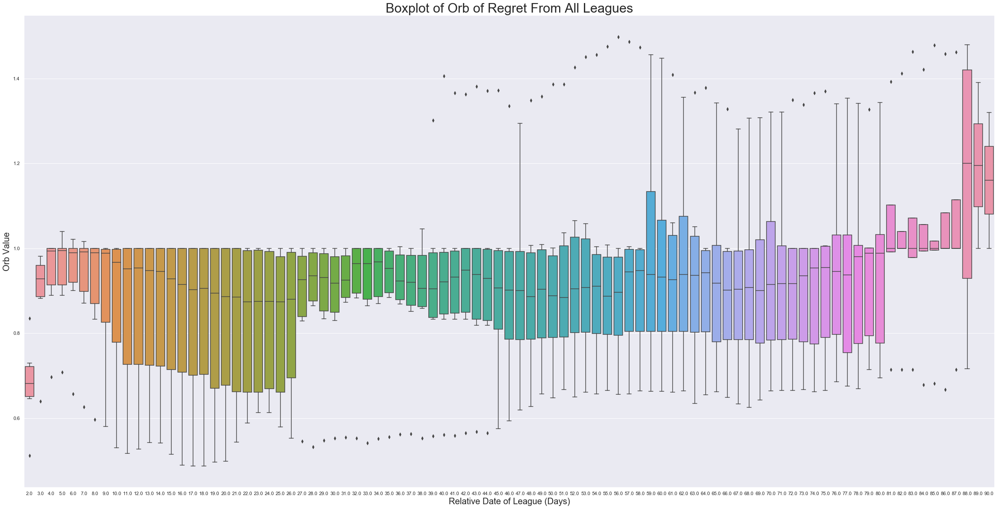

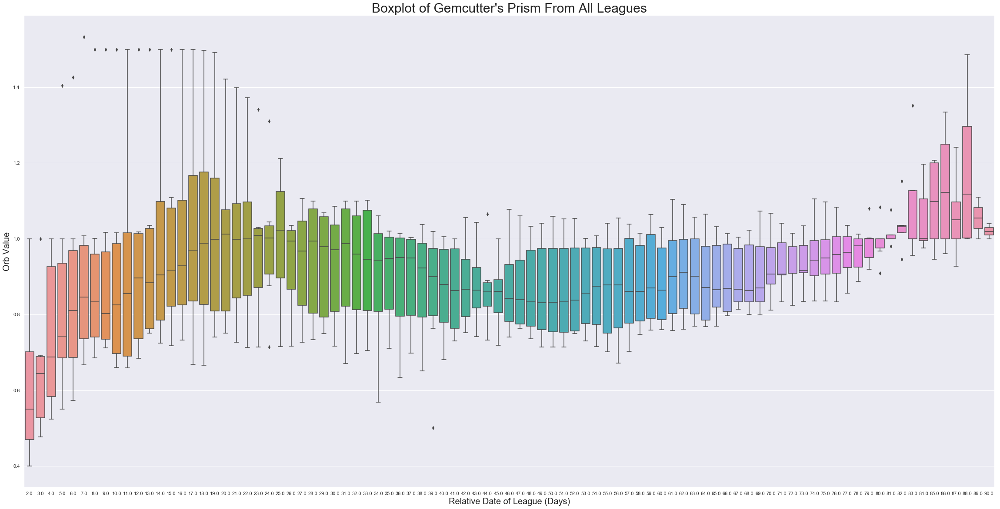

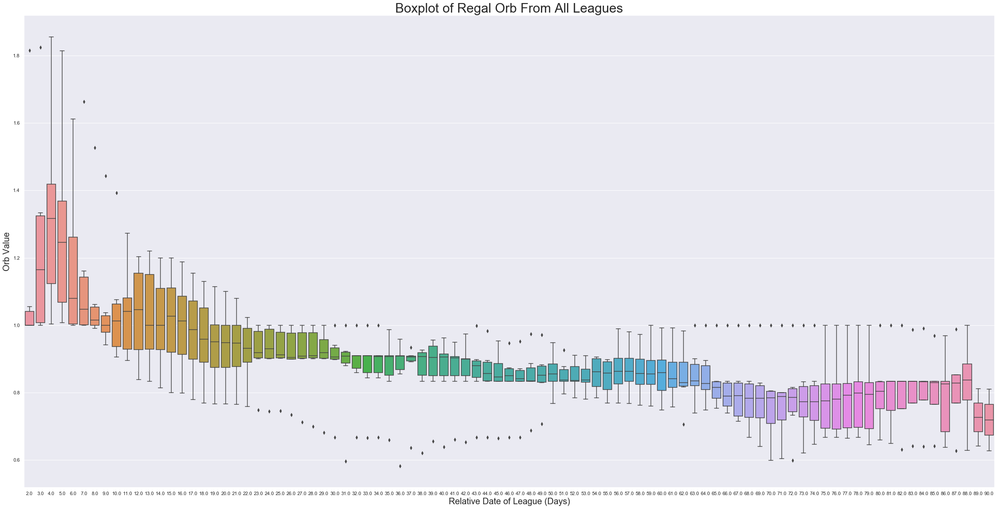

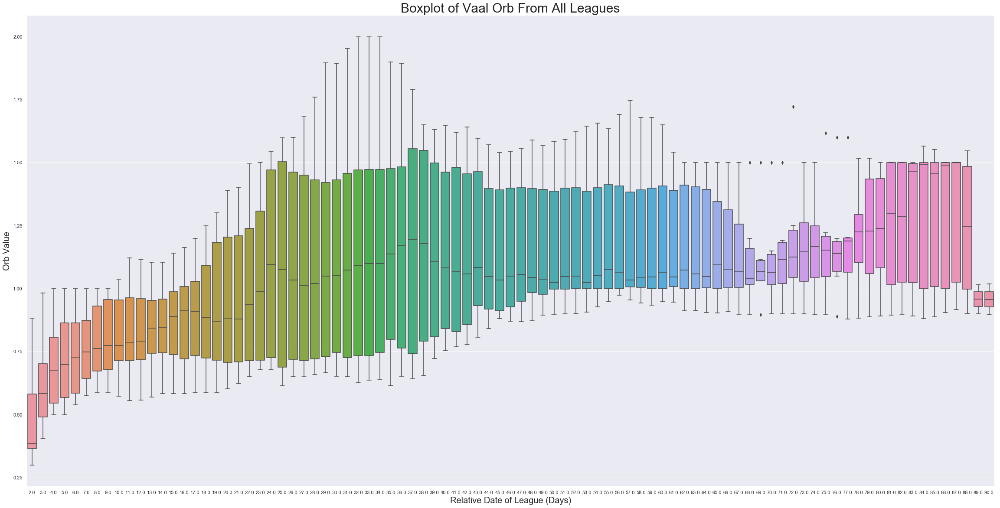

In [22]:
for orb in major_orbs:
    chaos_orb_df = currency_df_pared[(currency_df_pared["Get"] == orb) & (currency_df_pared["Pay"] == "Chaos Orb")]
    plt.figure(figsize = (40, 20))
    ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = chaos_orb_df)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
    ax.set_ylabel("Orb Value", fontsize = 20)
    ax.set_title("Boxplot of " + orb +" From All Leagues", fontsize = 30)

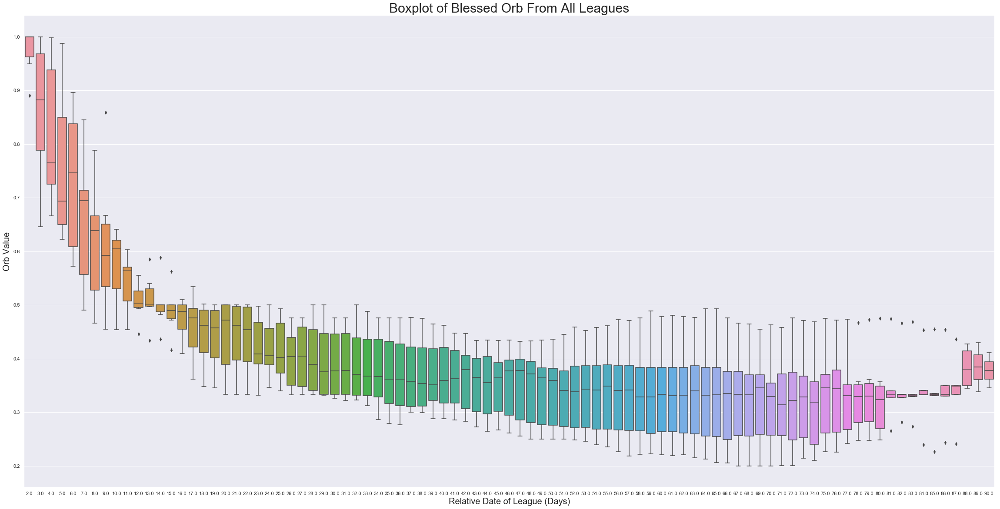

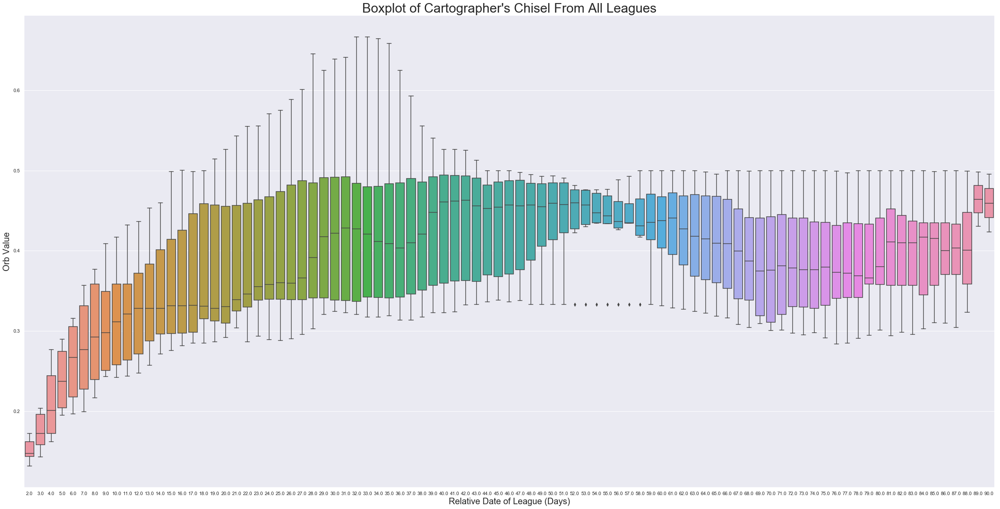

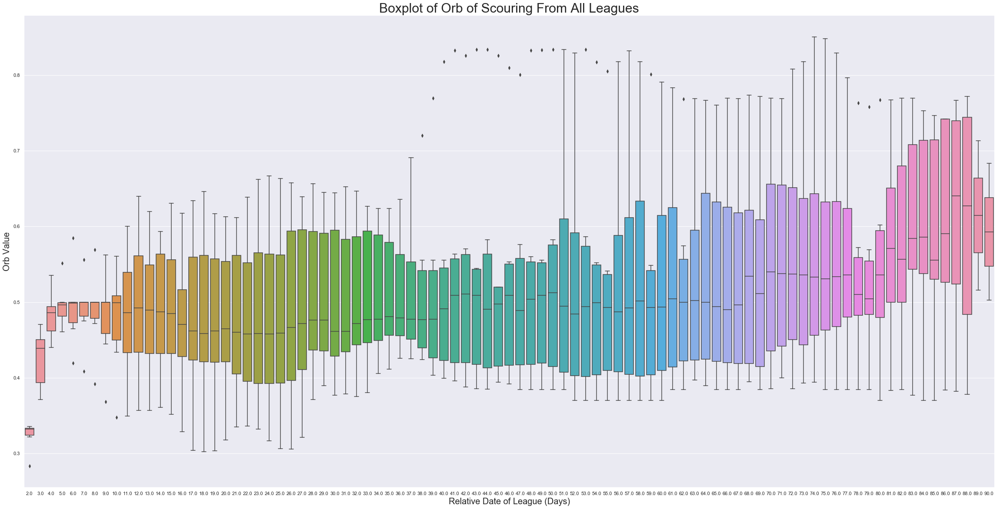

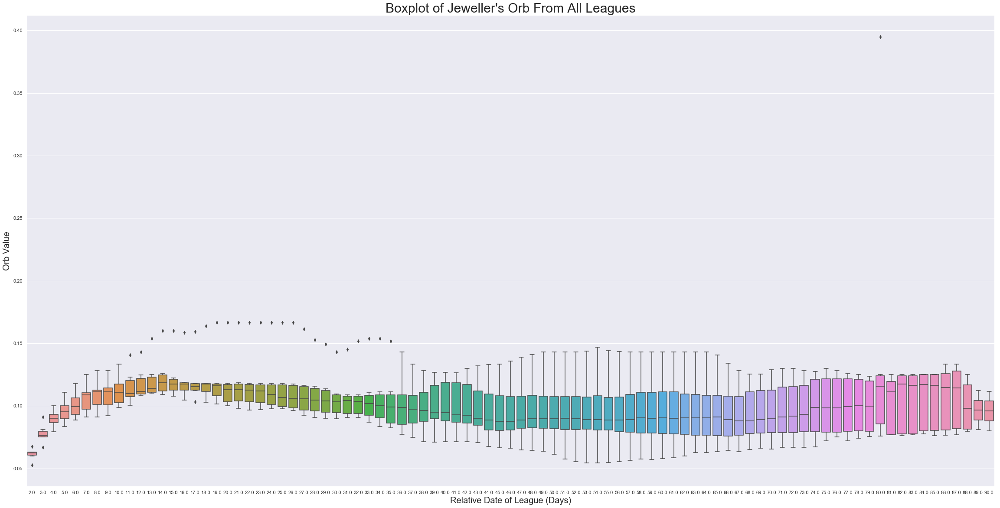

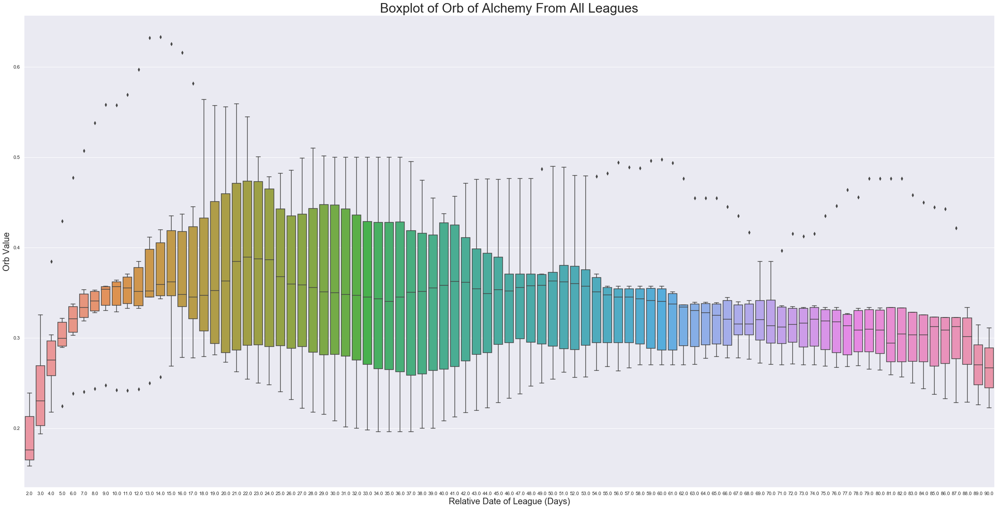

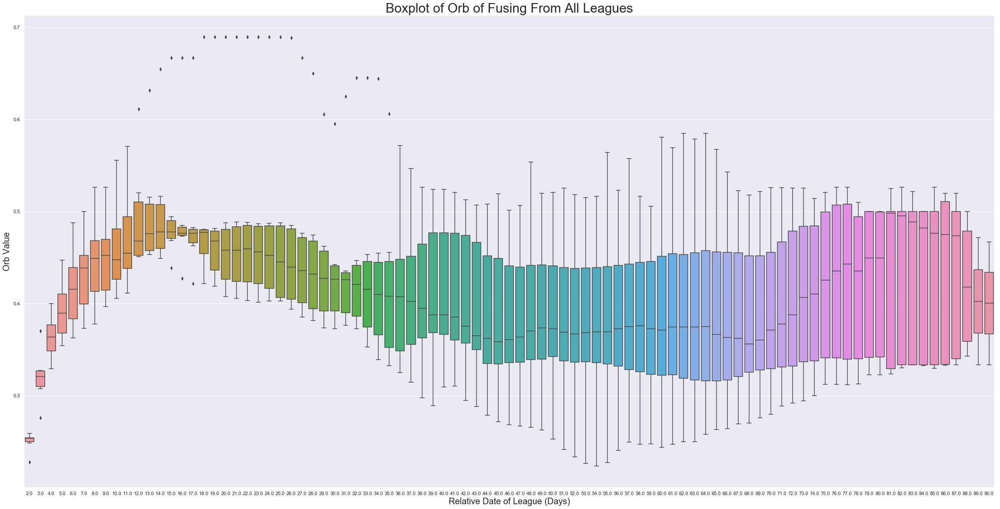

In [23]:
for orb in minor_orbs:
    chaos_orb_df = currency_df_pared[(currency_df_pared["Get"] == orb) & (currency_df_pared["Pay"] == "Chaos Orb")]
    plt.figure(figsize = (40, 20))
    ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = chaos_orb_df)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
    ax.set_ylabel("Orb Value", fontsize = 20)
    ax.set_title("Boxplot of " + orb +" From All Leagues", fontsize = 30)

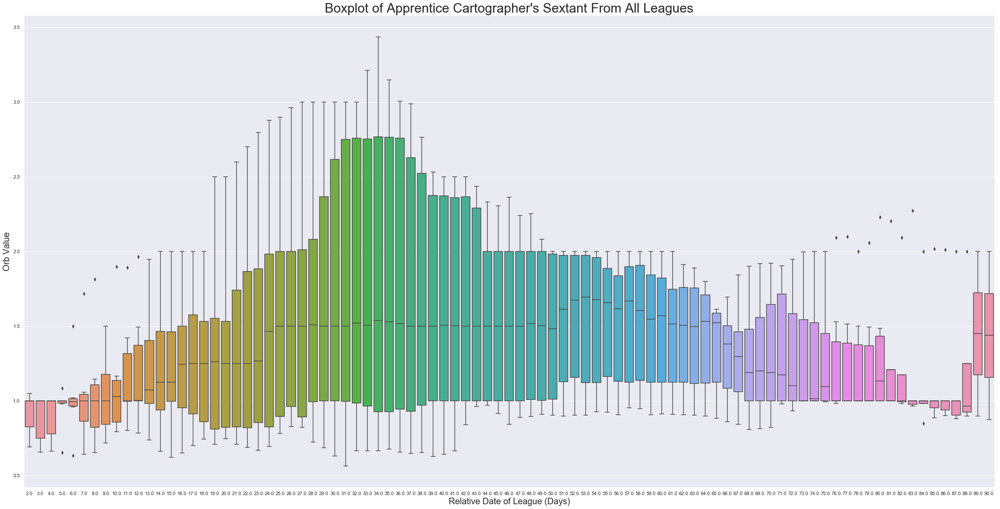

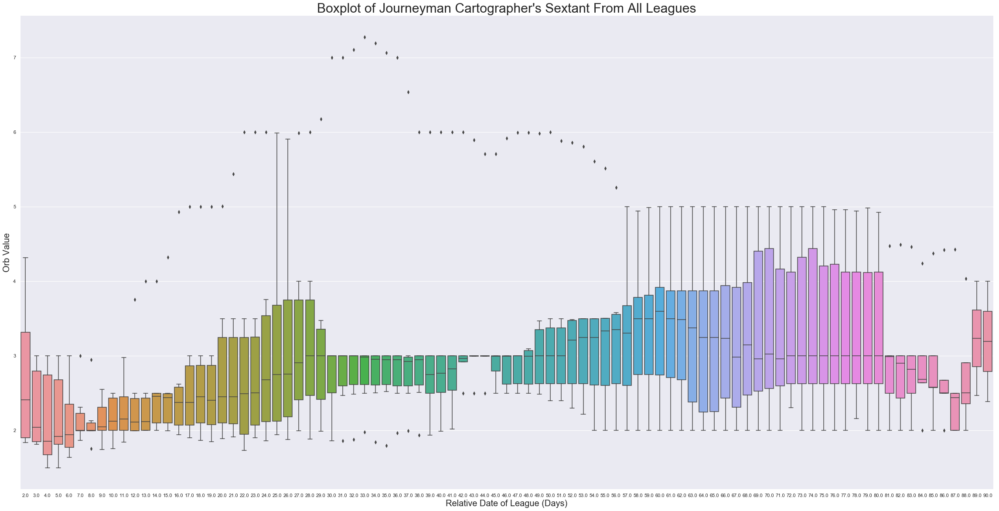

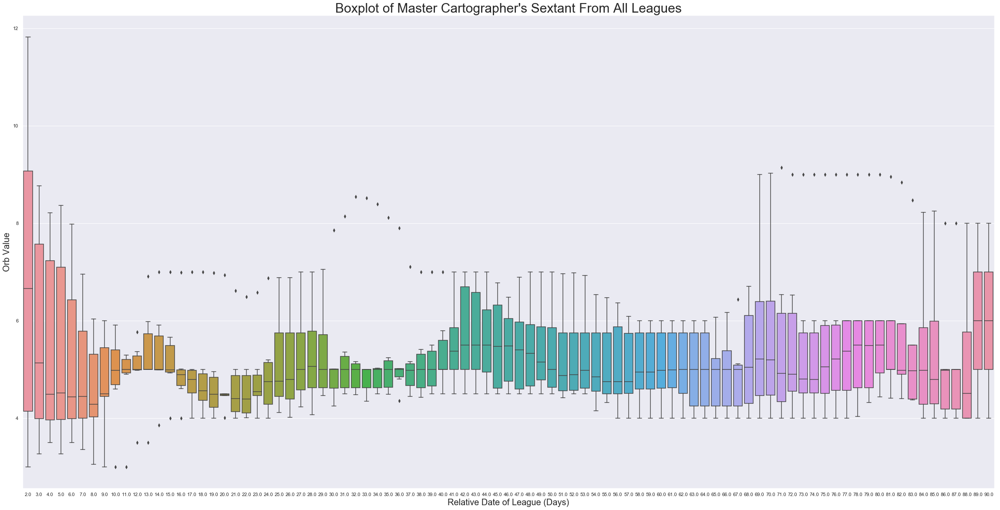

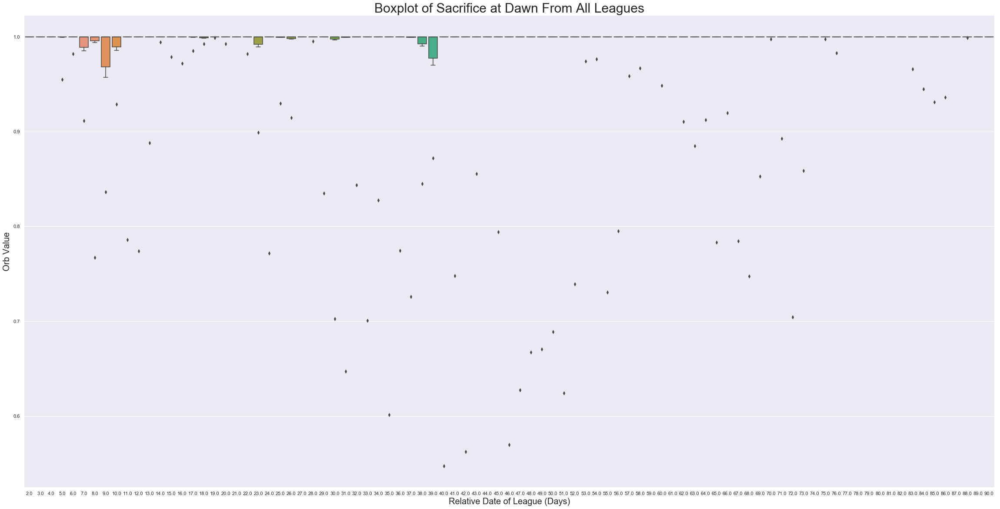

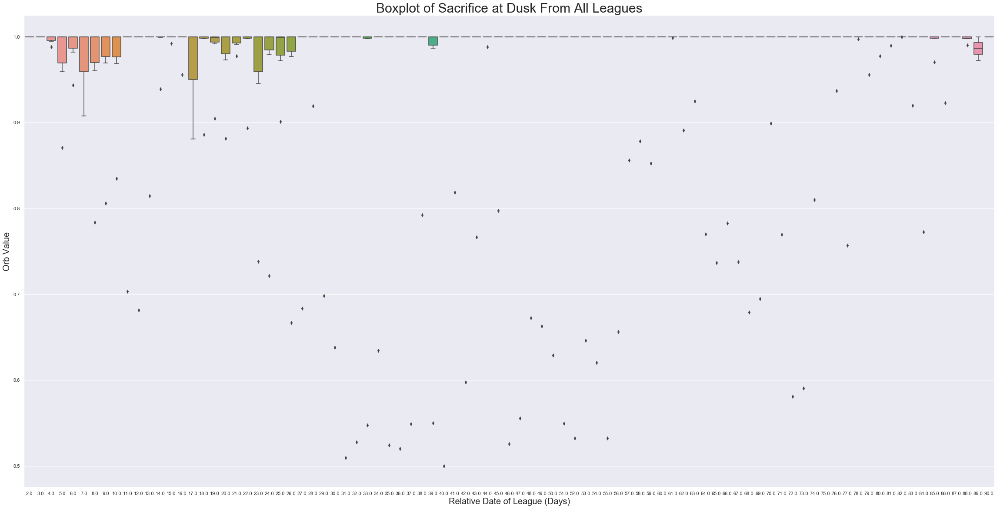

...

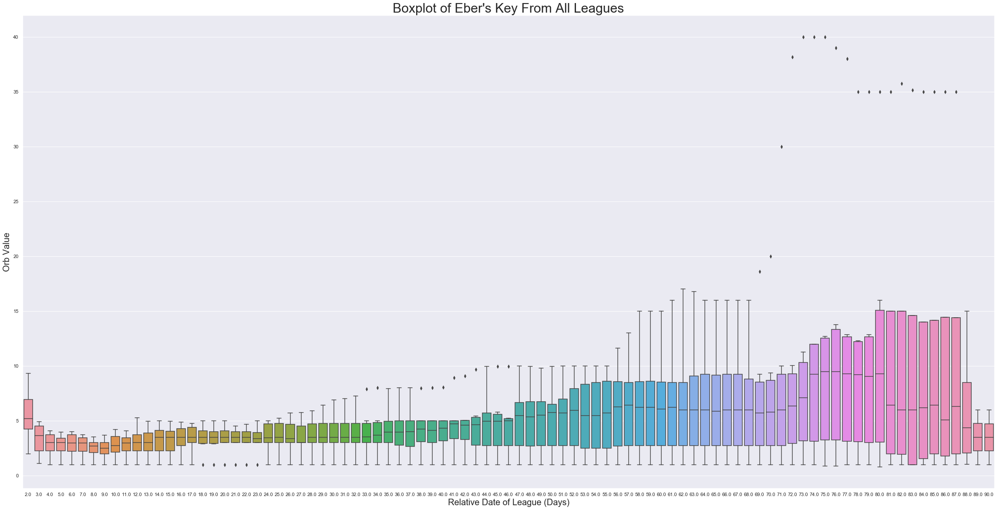

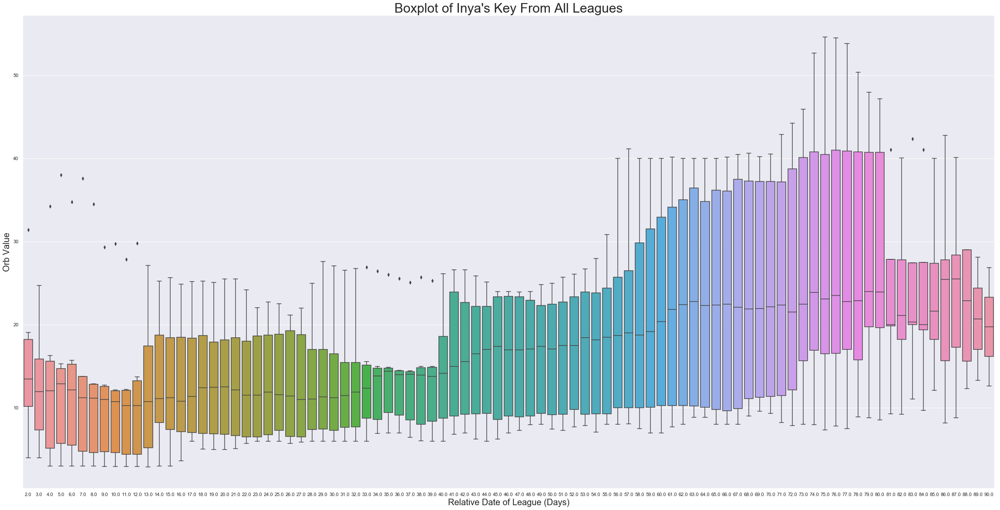

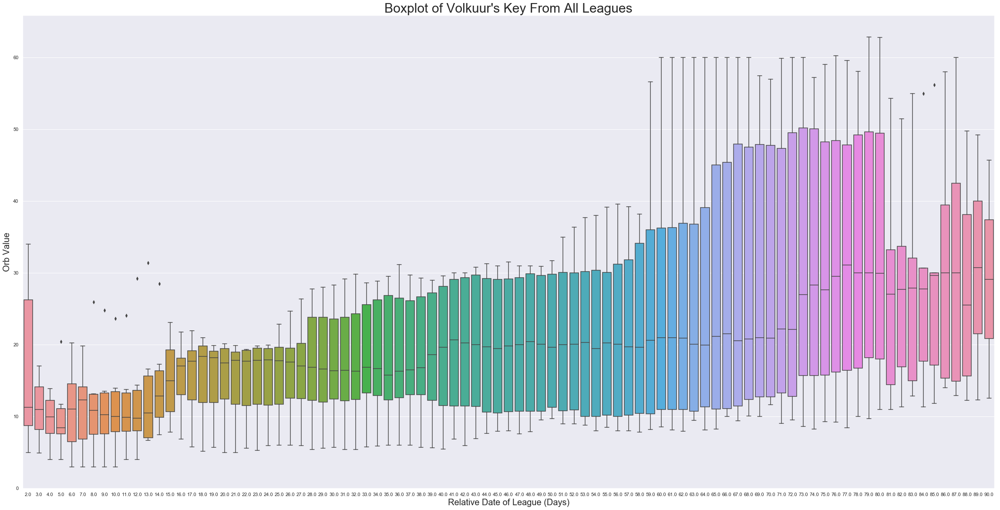

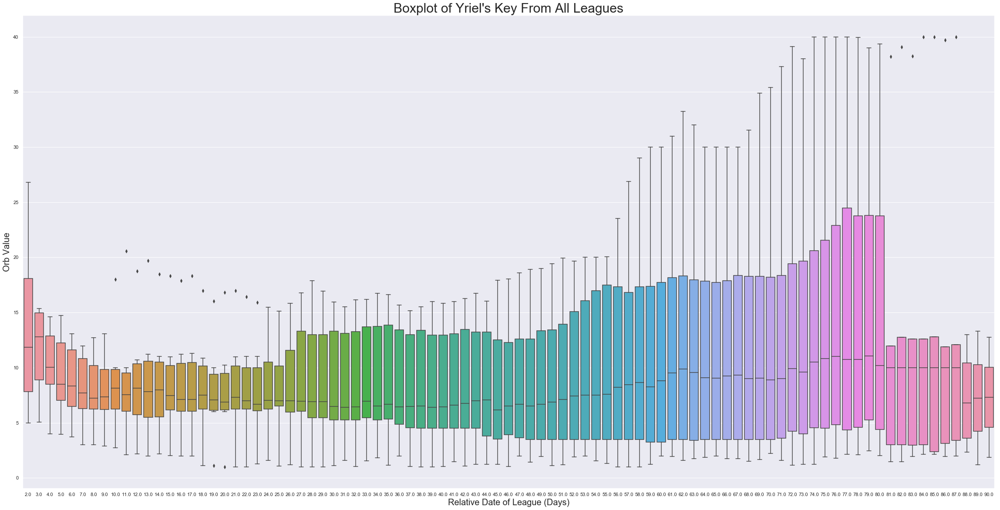

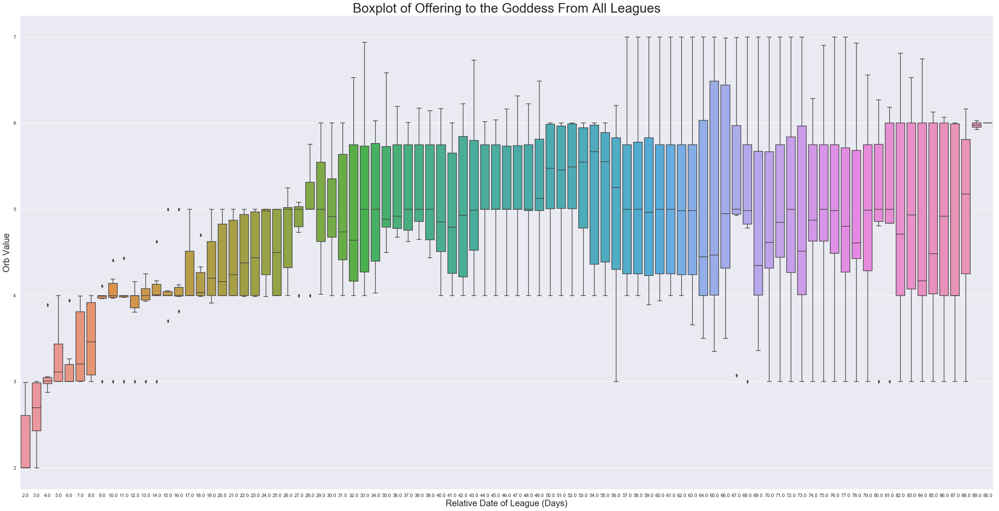

In [24]:
for orb_group in non_orb_groups:
    for orb in orb_group:
        chaos_orb_df = currency_df_pared[(currency_df_pared["Get"] == orb) & (currency_df_pared["Pay"] == "Chaos Orb")]
        plt.figure(figsize = (40, 20))
        ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = chaos_orb_df)
        ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
        ax.set_ylabel("Orb Value", fontsize = 20)
        ax.set_title("Boxplot of " + orb +" From All Leagues", fontsize = 30)

### By Group

In [25]:
currency_indexed_currency = currency_df_pared.set_index("Get")
currrncy_indexed_currency = currency_indexed_currency.sort_index()
currency_name_list = list(currrncy_indexed_currency.index.unique())
print(currency_name_list)

["Apprentice Cartographer's Sextant", 'Blessed Orb', 'Blessing of Chayula', 'Blessing of Esh', 'Blessing of Tul', 'Blessing of Uul-Netol', 'Blessing of Xoph', "Cartographer's Chisel", 'Chaos Orb', "Chayula's Breachstone", 'Divine Orb', "Eber's Key", "Esh's Breachstone", 'Exalted Orb', 'Fragment of the Chimera', 'Fragment of the Hydra', 'Fragment of the Minotaur', 'Fragment of the Phoenix', "Gemcutter's Prism", "Inya's Key", "Jeweller's Orb", "Journeyman Cartographer's Sextant", "Master Cartographer's Sextant", 'Mortal Grief', 'Mortal Hope', 'Mortal Ignorance', 'Mortal Rage', 'Offering to the Goddess', 'Orb of Alchemy', 'Orb of Fusing', 'Orb of Regret', 'Orb of Scouring', 'Regal Orb', 'Sacrifice at Dawn', 'Sacrifice at Dusk', 'Sacrifice at Midnight', 'Sacrifice at Noon', 'Splinter of Chayula', "Tul's Breachstone", "Uul-Netol's Breachstone", 'Vaal Orb', "Volkuur's Key", "Xoph's Breachstone", "Yriel's Key"]


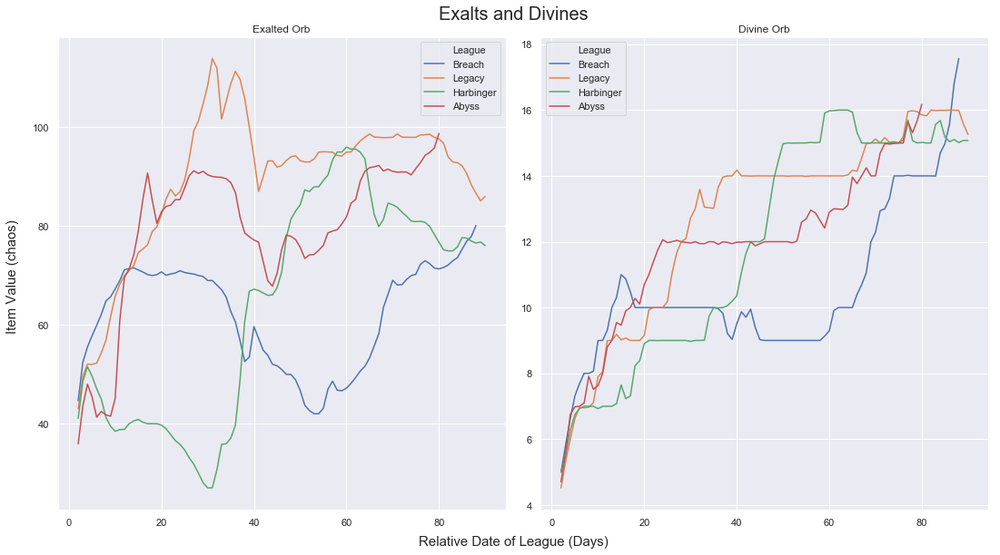

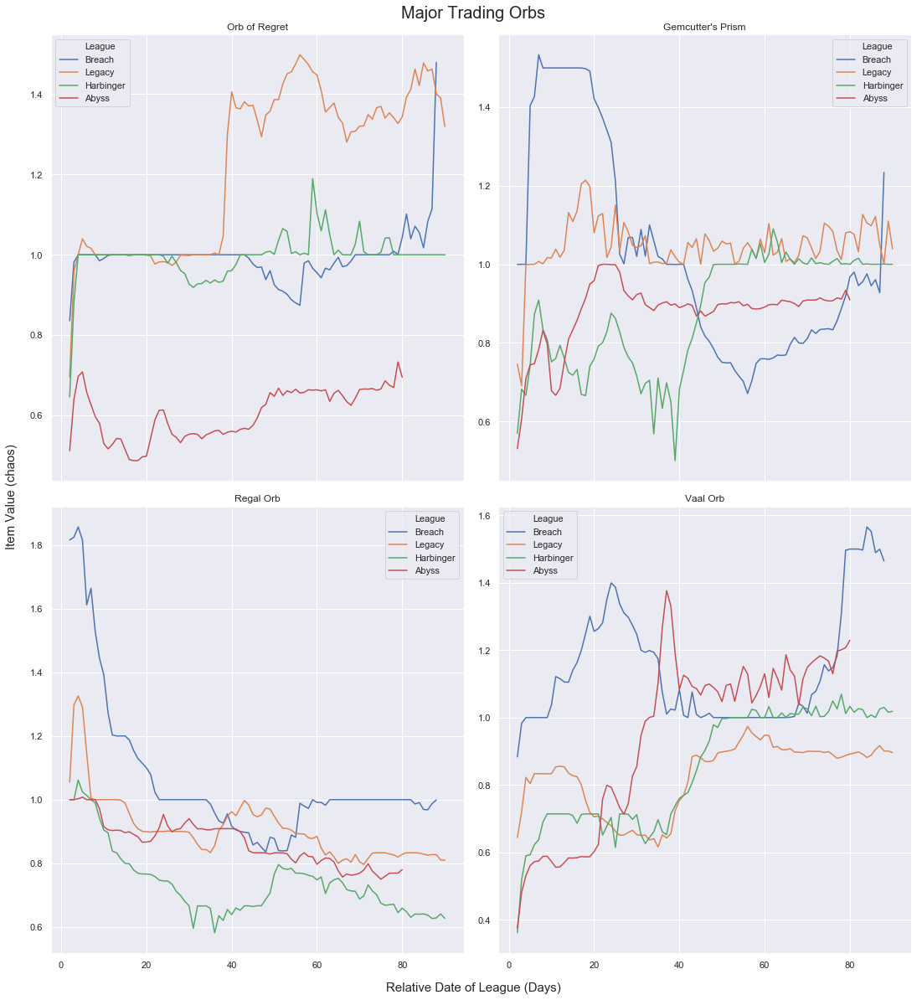

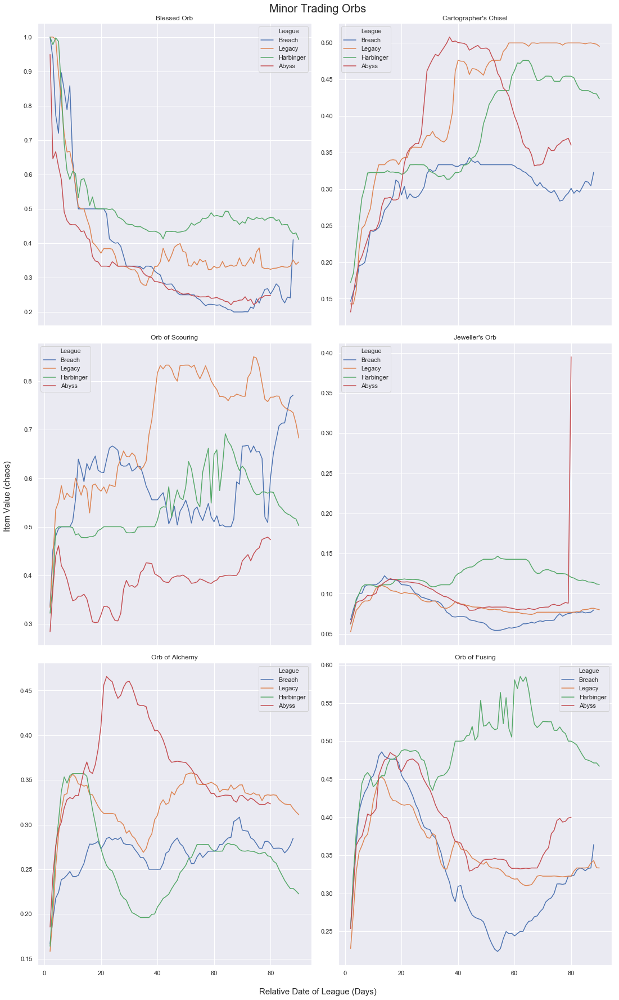

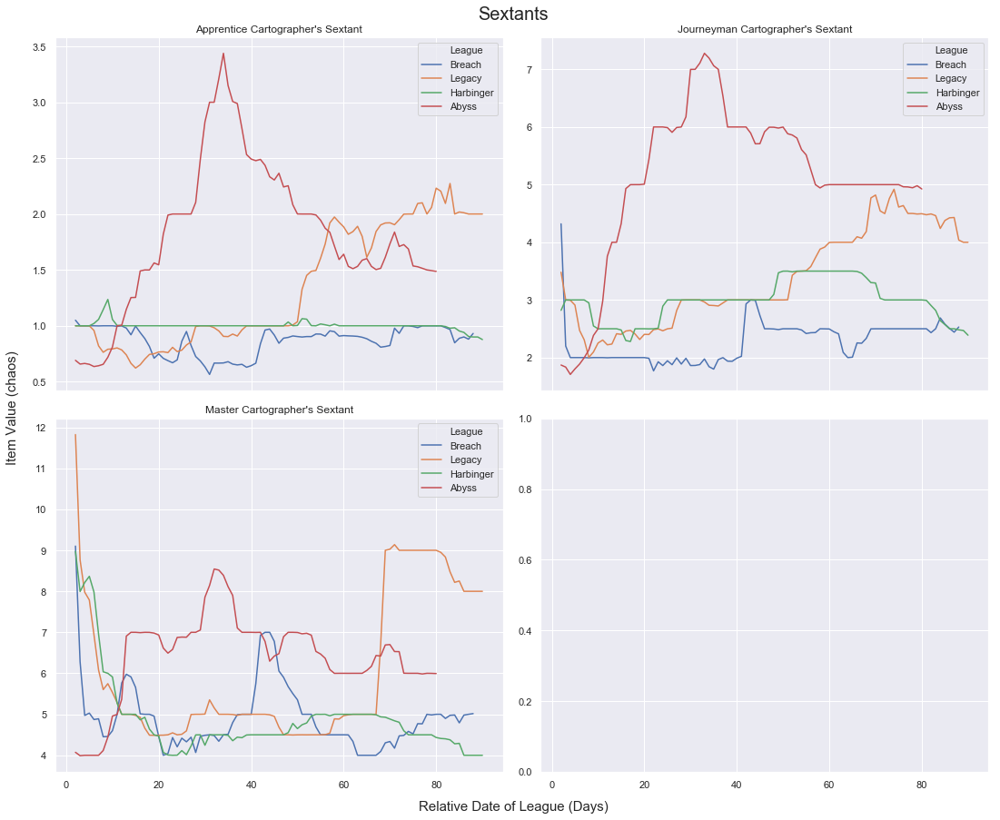

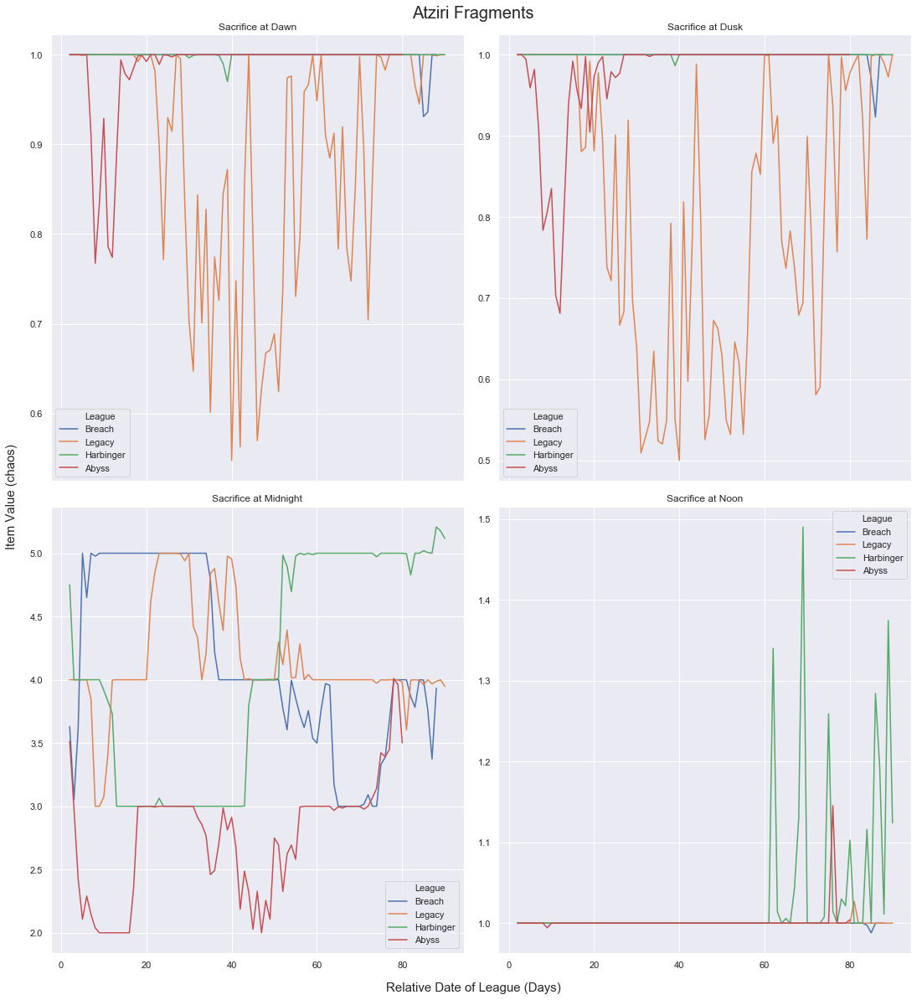

...

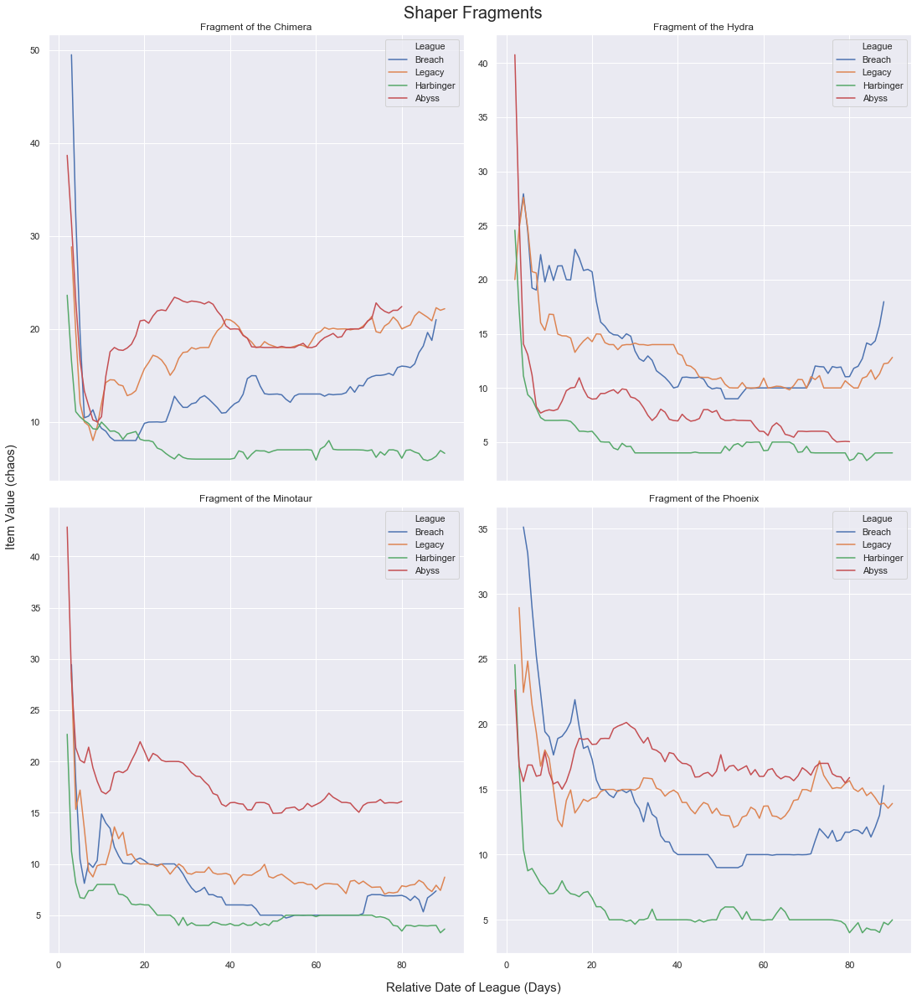

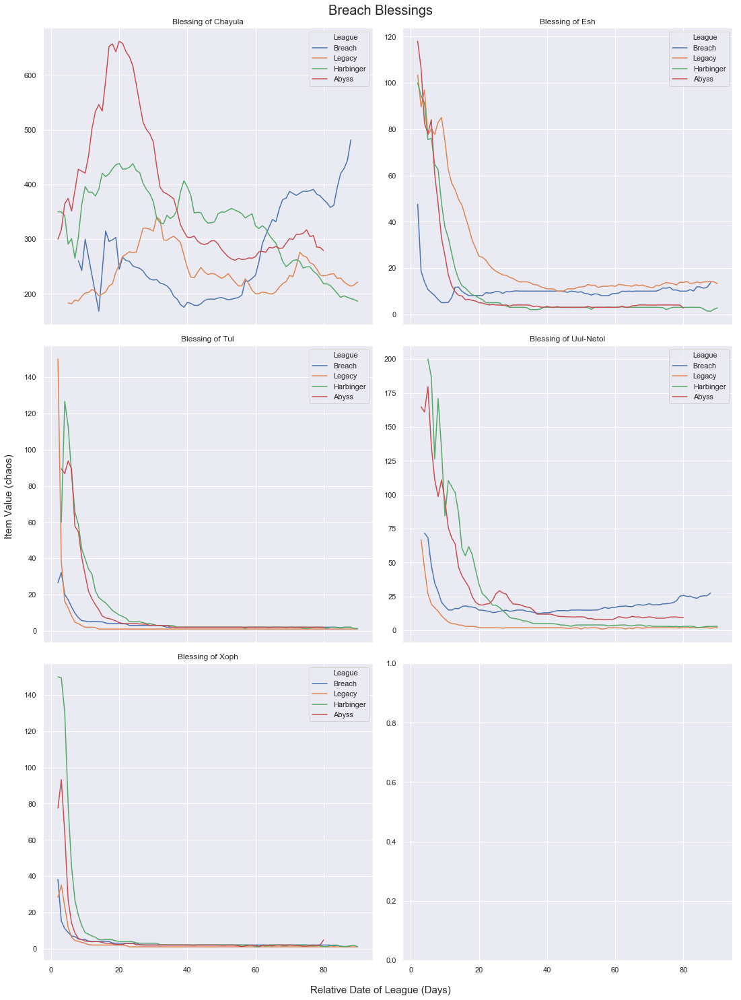

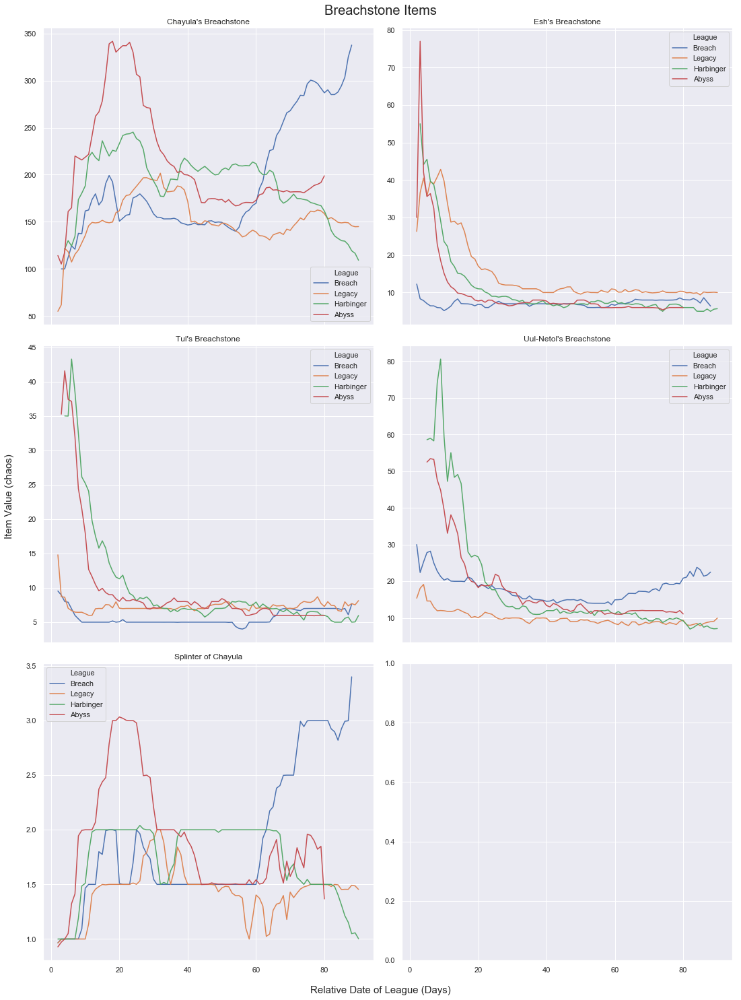

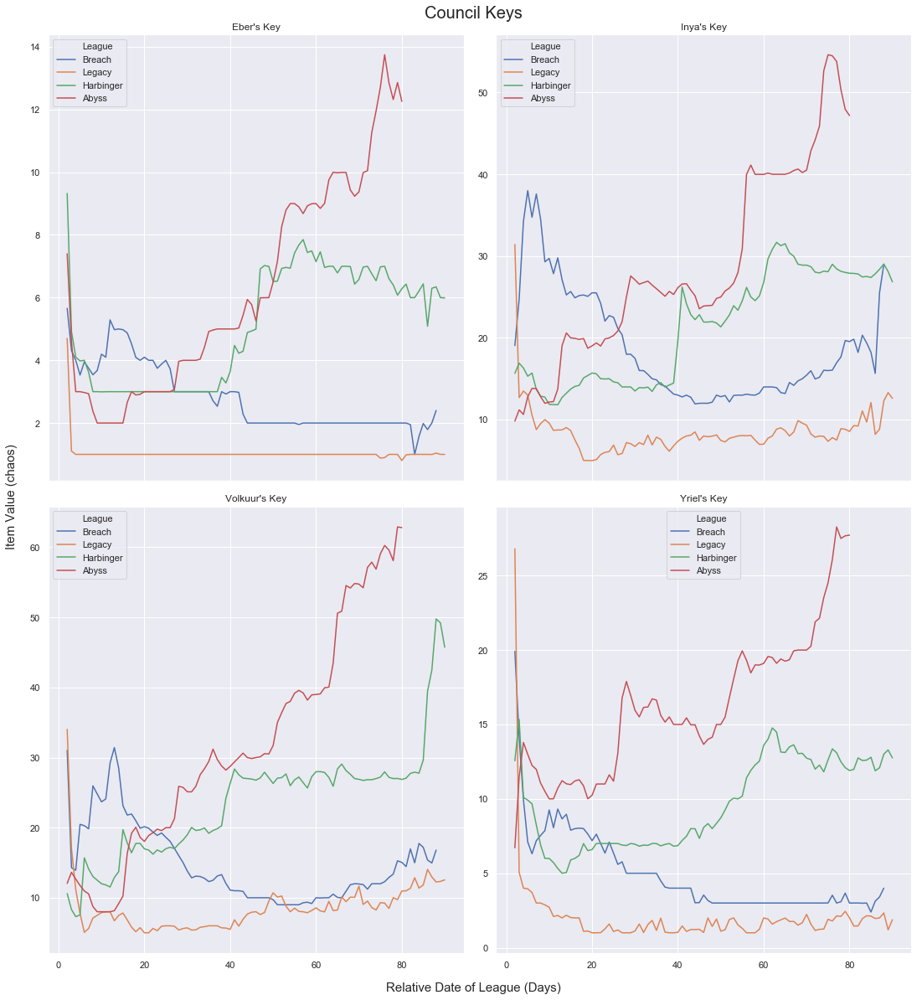

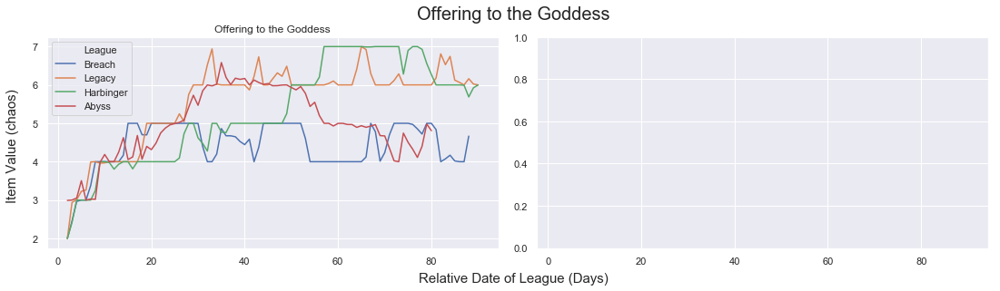

In [26]:
for group, i in zip(all_currency_groups, range(len(all_currency_groups))):
    fig, axes = plt.subplots(math.ceil(len(group)/2), 2, figsize = (15, len(group)*4), sharex = True)
    fig.text(0.5, -.01, 'Relative Date of League (Days)', ha='center', va='center', fontsize = 15)
    fig.text(-.01, 0.5, 'Item Value (chaos)', ha='center', va='center', fontsize = 15, rotation = "vertical")
    fig.text(0.5, 1, all_currency_groups_names[i], ha='center', va='center', fontsize = 20)
    for ax, item in zip(axes.flat, group):
        currency_values = currency_indexed_currency.loc[item]
        currency_chaos_values = currency_values[currency_values["Pay"] == "Chaos Orb"]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", 
                     data = currency_chaos_values, hue_order = ["Breach", "Legacy", "Harbinger", "Abyss"], ax = ax)
        ax.set(xlabel = "", ylabel = "", title = item)
    fig.tight_layout()

### Examining exalt to chaos ratios

In [27]:
chaos_exalt_df = currency_df_pared[(currency_df_pared["Get"] == "Exalted Orb") & (currency_df_pared["Pay"] == "Chaos Orb")]

Text(0.5,1,'Value of Exalts in Chaos')

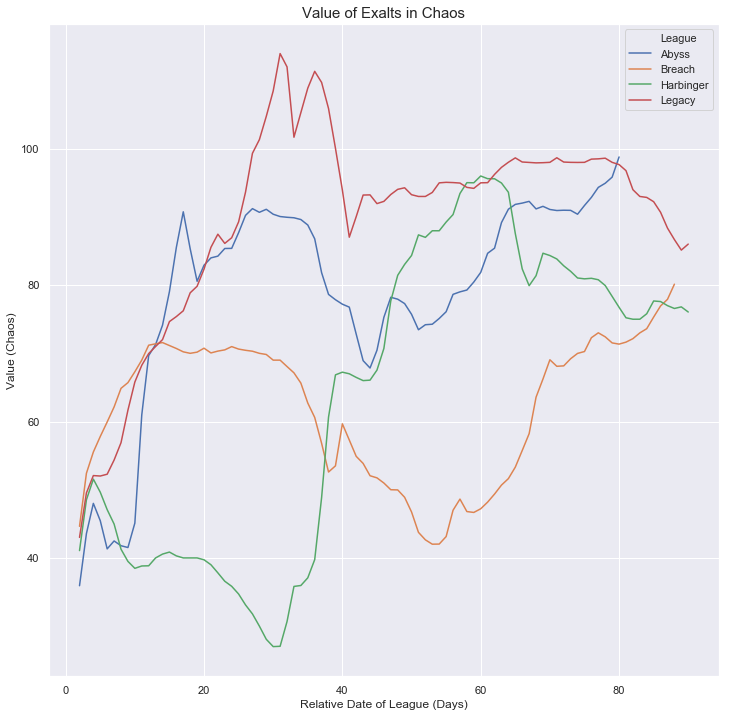

In [28]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", data = chaos_exalt_df, hue_order = league_name_list)
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value (Chaos)", fontsize = 12)
ax.set_title("Value of Exalts in Chaos", fontsize = 15)

Text(0.5,1,'Value of Chaos in Exalts')

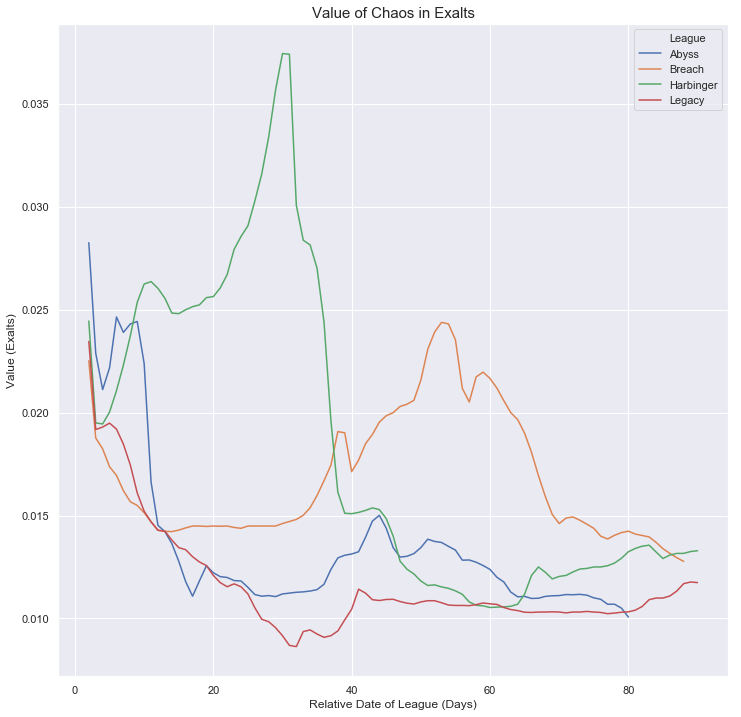

In [29]:
exalt_chaos_df = currency_df_pared[(currency_df_pared["Get"] == "Chaos Orb") & (currency_df_pared["Pay"] == "Exalted Orb")]
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", data = exalt_chaos_df, hue_order = league_name_list)
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value (Exalts)", fontsize = 12)
ax.set_title("Value of Chaos in Exalts", fontsize = 15)

In [30]:
c_e_abyss_df = chaos_exalt_df[chaos_exalt_df["League"] == "Abyss"].reset_index(drop = True)
e_c_abyss_df = exalt_chaos_df[exalt_chaos_df["League"] == "Abyss"].reset_index(drop = True)

Text(0,0.5,'Value (Exalts)')

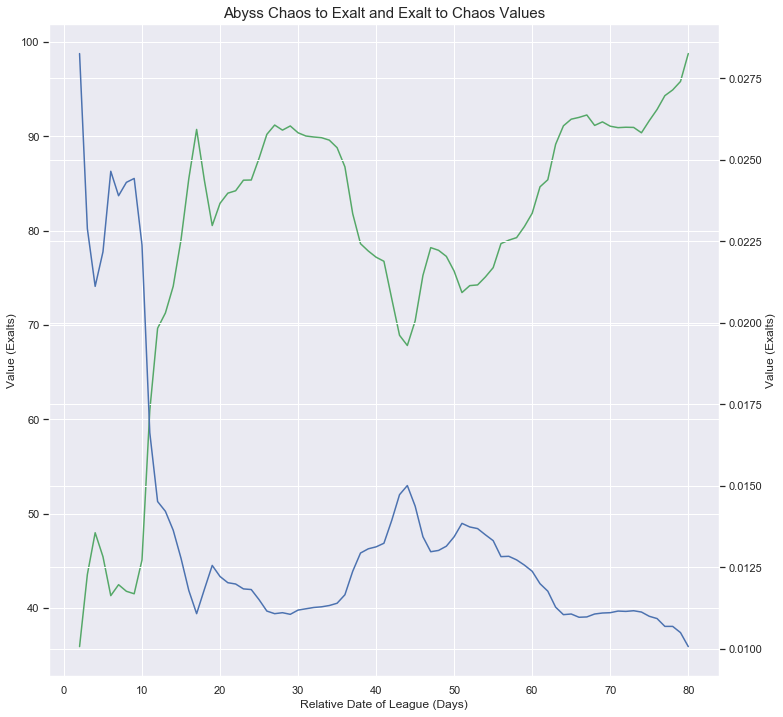

In [31]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = c_e_abyss_df, color = "g")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value (Exalts)", fontsize = 12)
ax.set_title("Abyss Chaos to Exalt and Exalt to Chaos Values", fontsize = 15)
ax2 = ax.twinx()
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_abyss_df, color = "b")
ax2.set_ylabel("Value (Exalts)", fontsize = 12)

In [32]:
e_c_conversion = pd.DataFrame()
e_c_conversion["Value"] = e_c_abyss_df.Value.multiply(c_e_abyss_df.Value)
e_c_conversion["RelativeDateInt"] = e_c_abyss_df["RelativeDateInt"]
e_c_conversion.head()

,Value,RelativeDateInt
0,1.015256,2.0
1,0.997407,3.0
2,1.013696,4.0
3,1.008268,5.0
4,1.018739,6.0


Text(0.5,1,'Abyss Ratio of exalt value to chaos value')

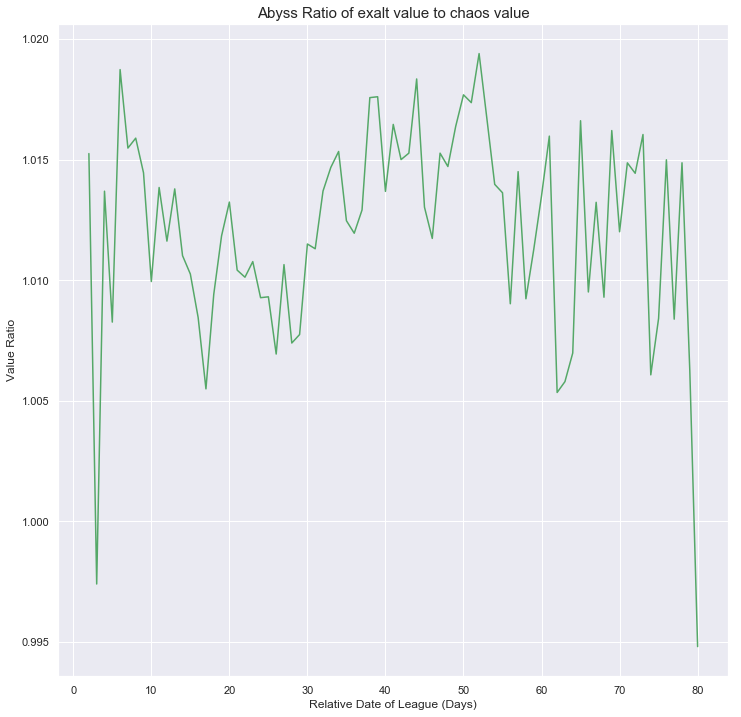

In [33]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_conversion, color = "g")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value Ratio", fontsize = 12)
ax.set_title("Abyss Ratio of exalt value to chaos value", fontsize = 15)

In [34]:
e_c_conversion["Rolling Mean Value"] = e_c_conversion.Value.rolling(4, min_periods=1).mean()

Text(0.5,1,'Abyss Rolling Mean Value Ratio of Exalt Value to Chaos Value')

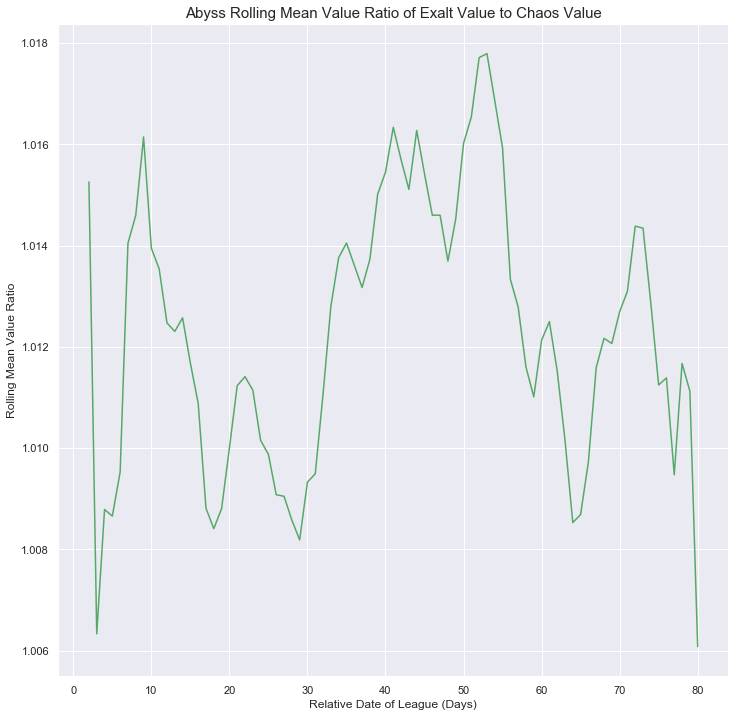

In [35]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Rolling Mean Value", data = e_c_conversion, color = "g")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Rolling Mean Value Ratio", fontsize = 12)
ax.set_title("Abyss Rolling Mean Value Ratio of Exalt Value to Chaos Value", fontsize = 15)

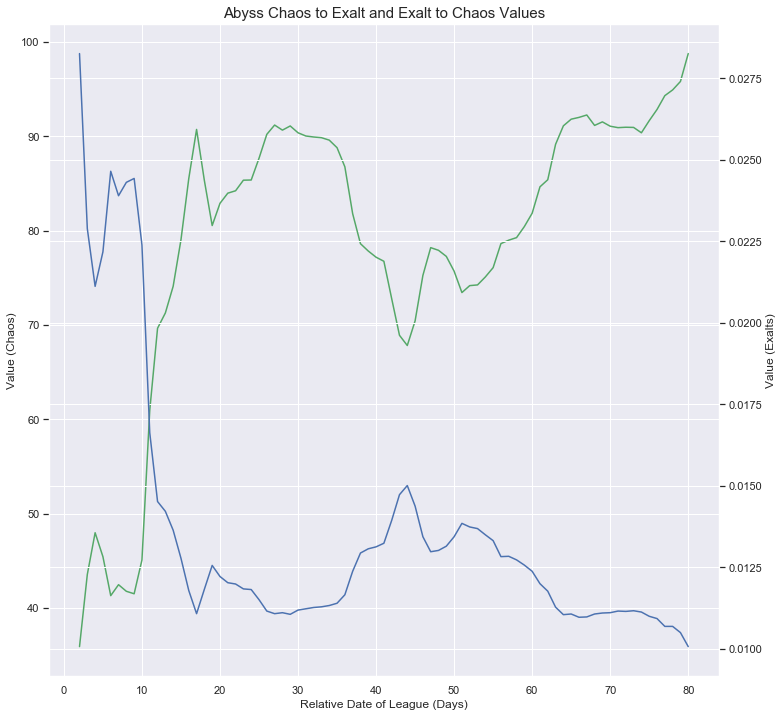

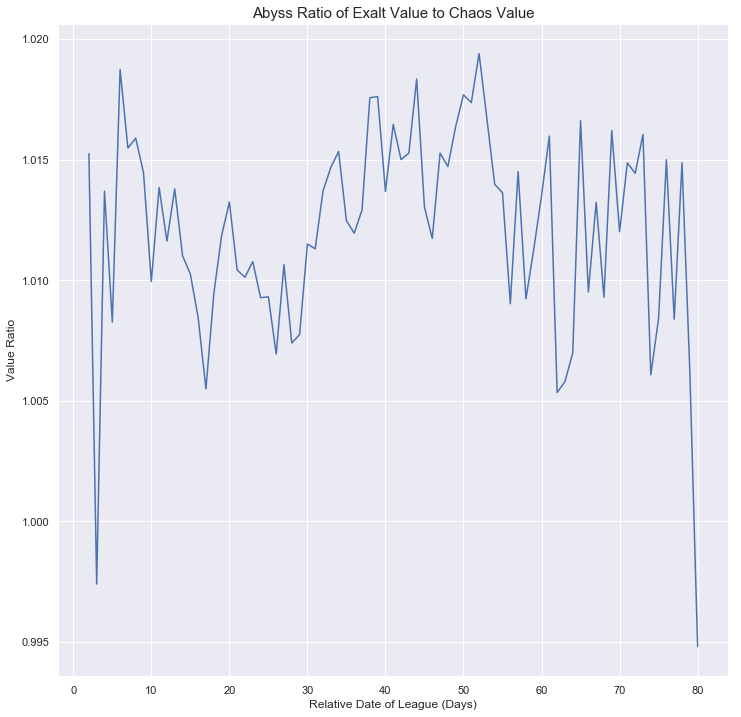

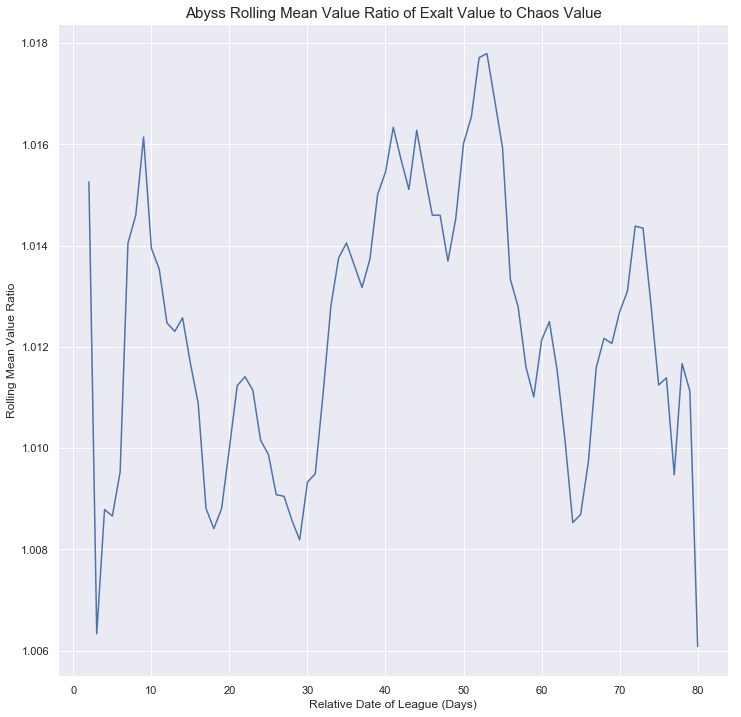

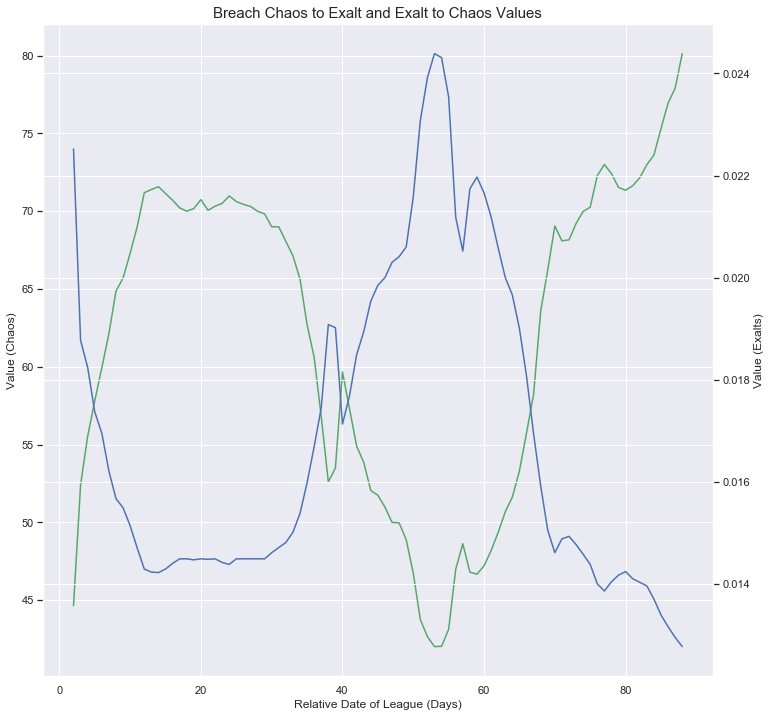

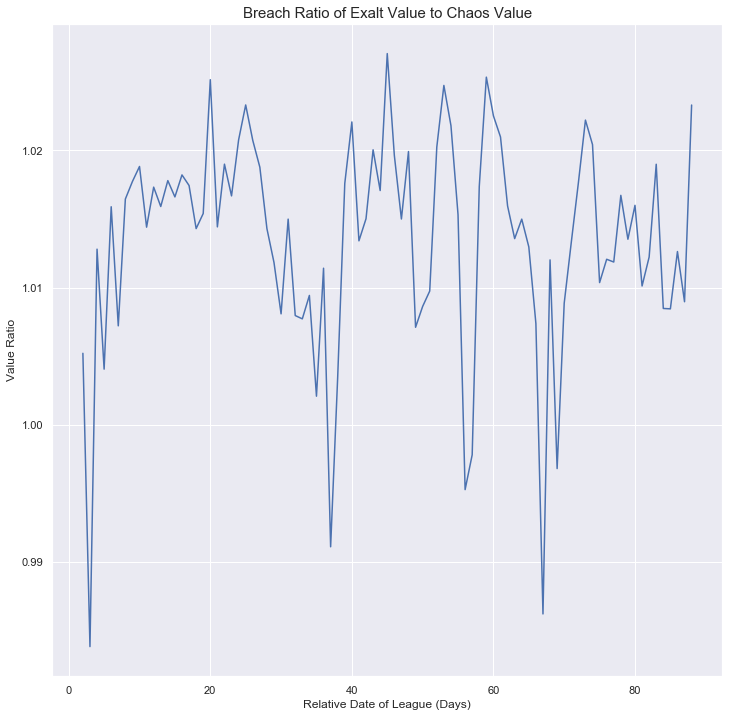

...

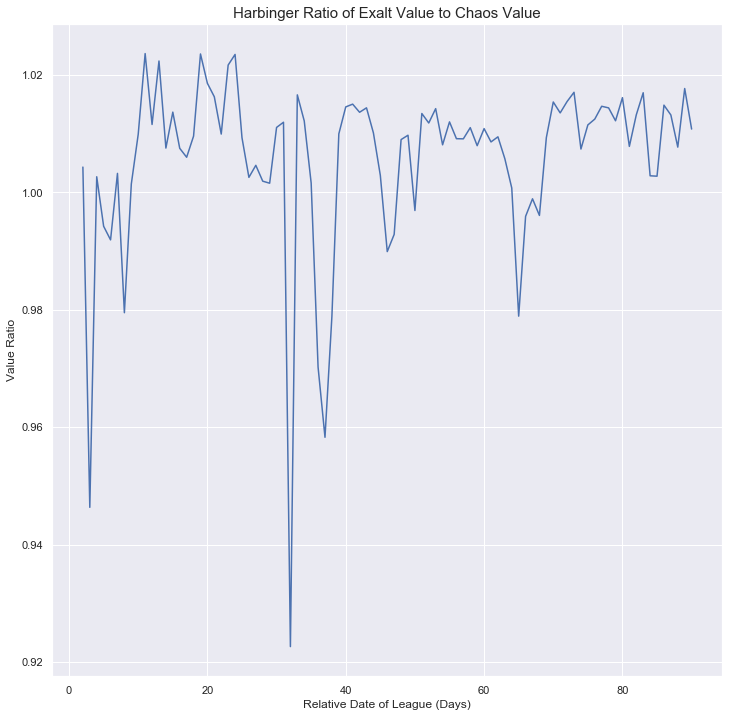

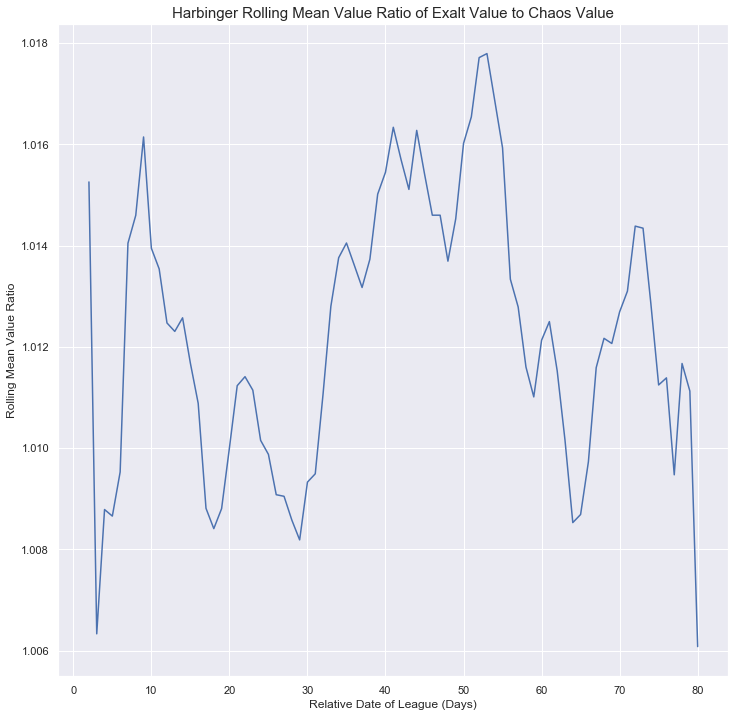

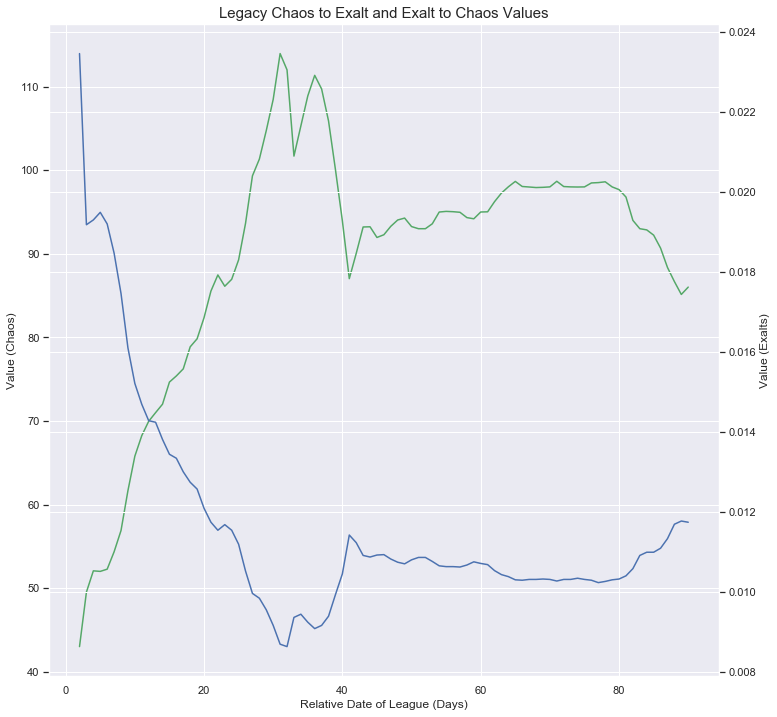

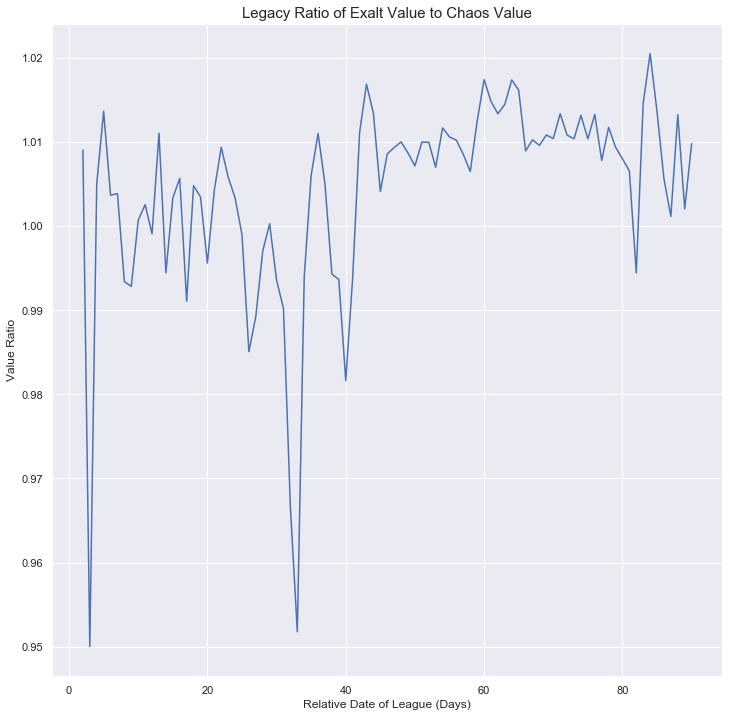

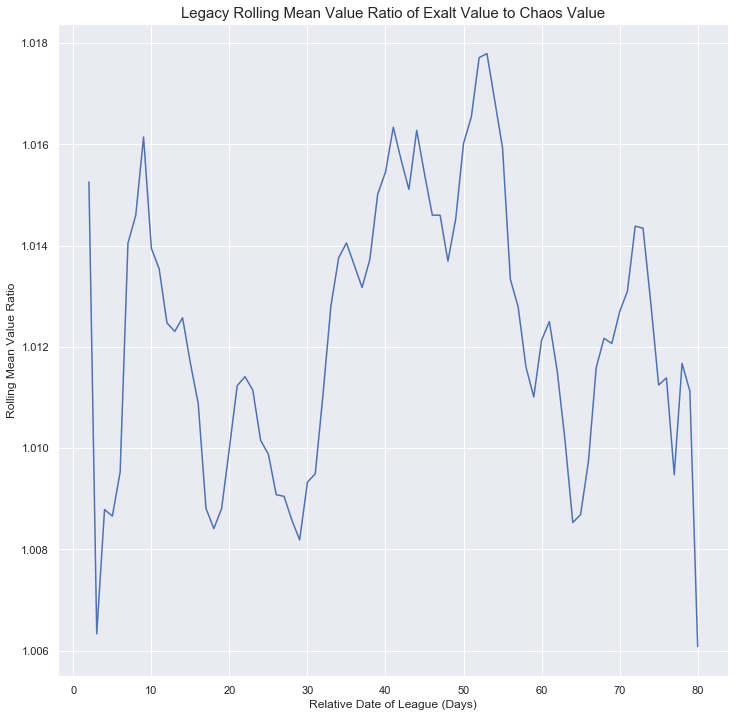

In [36]:
e_c_rolling_means = []
for league in league_name_list:
    c_e_league_df = chaos_exalt_df[chaos_exalt_df["League"] == league].reset_index(drop = True)
    e_c_league_df = exalt_chaos_df[exalt_chaos_df["League"] == league].reset_index(drop = True)
    plt.figure(figsize = (12, 12))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = c_e_league_df, color = "g")
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
    ax.set_ylabel("Value (Chaos)", fontsize = 12)
    ax.set_title(league + " Chaos to Exalt and Exalt to Chaos Values", fontsize = 15)
    ax2 = ax.twinx()
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_league_df, color = "b")
    ax2.set_ylabel("Value (Exalts)", fontsize = 12)
    fig.tight_layout()
    
    e_c_league_conversion = pd.DataFrame()
    e_c_league_conversion["Value"] = e_c_league_df.Value.multiply(c_e_league_df.Value)
    e_c_league_conversion["RelativeDateInt"] = e_c_league_df["RelativeDateInt"]
    plt.figure(figsize = (12, 12))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_league_conversion)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
    ax.set_ylabel("Value Ratio", fontsize = 12)
    ax.set_title(league + " Ratio of Exalt Value to Chaos Value", fontsize = 15)
    
    e_c_league_conversion["Rolling Mean Value"] = e_c_league_conversion.Value.rolling(4, min_periods = 1).mean()
    e_c_rolling_means.append(e_c_league_conversion)
    plt.figure(figsize = (12, 12))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Rolling Mean Value", data = e_c_conversion)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
    ax.set_ylabel("Rolling Mean Value Ratio", fontsize = 12)
    ax.set_title(league + " Rolling Mean Value Ratio of Exalt Value to Chaos Value", fontsize = 15)

In [37]:
e_c_rolling_means_concat = pd.concat(e_c_rolling_means, axis = 0)

Text(0.5,1,'Boxplot of Rolling Mean Value Exalt/Chaos Ratio From All Leagues')

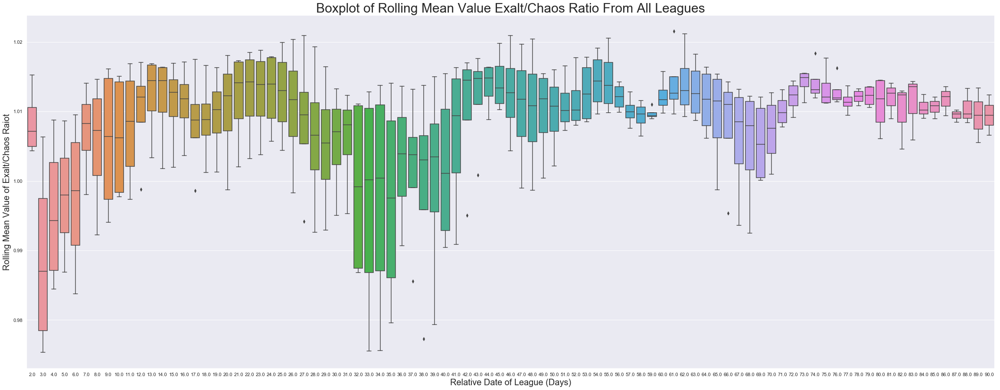

In [38]:
plt.figure(figsize = (40,15))
ax = sns.boxplot(x = "RelativeDateInt", y = "Rolling Mean Value", data = e_c_rolling_means_concat)
ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Rolling Mean Value of Exalt/Chaos Ratio", title = "Boxplot of Rolling Mean Value Exalt/Chaos Ratio from All Leagues")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
ax.set_ylabel("Rolling Mean Value of Exalt/Chaos Raiot", fontsize = 20)
ax.set_title("Boxplot of Rolling Mean Value Exalt/Chaos Ratio From All Leagues", fontsize = 30)

## Inferential Statistics

### Finding Correlation Betwen Items

In [39]:
currency_chaos_norm = currency_df_pared[currency_df_pared.Pay == "Chaos Orb"].reset_index(drop = True)
currency_chaos_norm_mapped = currency_chaos_norm.rename(columns = {"Get" : "Name"})
currency_chaos_edited = currency_chaos_norm_mapped[["League", "Name", "Value", "RelativeDateInt"]]

In [40]:
currency_chaos_edited.reset_index(drop = True)
currency_chaos_edited.head()

,League,Name,Value,RelativeDateInt
0,Breach,Orb of Alchemy,0.16667,2.0
1,Breach,Orb of Alchemy,0.19363,3.0
2,Breach,Orb of Alchemy,0.21778,4.0
3,Breach,Orb of Alchemy,0.22417,5.0
4,Breach,Orb of Alchemy,0.23853,6.0


In [41]:
item_name_df = item_df_pared[["League", "Name", "Value", "RelativeDateInt"]].reset_index(drop = True)
item_name_df.head()

,League,Name,Value,RelativeDateInt
0,Breach,The Fiend,220.91509,2.0
1,Breach,The Fiend,204.06750,3.0
2,Breach,The Fiend,197.80446,4.0
3,Breach,The Fiend,224.65947,5.0
4,Breach,The Fiend,278.00750,6.0


In [42]:
currency_item_df = pd.concat([currency_chaos_edited, item_name_df], axis = 0)
currency_item_df.shape

(28748, 4)

### Filter out only specific items that may have a strong correlation between them:

In [43]:
correlated_items_list = ["The Fiend", "The Doctor", "Headhunter", "United in Dream", "The Blue Nightmare", "The Green Nightmare", "The Red Nightmare", "Emperor's Mastery", "Skyforth", "Atziri's Acuity", "Atziri's Disfavour", "The Retch", "House of Mirrors", "Trash to Treasure", "Fated Connections", "Mortal Ignorance", "Mortal Hope", "Blessing of Chayula", "Chayula's Breachstone", "Splinter of Chayula", "Exalted Orb", "Orb of Fusing"]

In [44]:
currency_item_df_pared = currency_item_df.loc[currency_item_df["Name"].isin(correlated_items_list)]
currency_item_df_pared.reset_index(drop = True, inplace = True)
currency_item_df_pared.shape

(9154, 4)

In [45]:
currency_item_df_pared.head()

,League,Name,Value,RelativeDateInt
0,Breach,Orb of Fusing,0.25408,2.0
1,Breach,Orb of Fusing,0.32707,3.0
2,Breach,Orb of Fusing,0.36445,4.0
3,Breach,Orb of Fusing,0.40789,5.0
4,Breach,Orb of Fusing,0.42236,6.0


In [46]:
pared_grouped = currency_item_df_pared.groupby(["Name", "RelativeDateInt"])["Value"].agg("median")
df = pared_grouped.to_frame().reset_index()

In [47]:
df_pivot = df.pivot(index = "RelativeDateInt", columns = "Name", values = "Value")

In [48]:
df_pivot

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
RelativeDateInt,,,,,,,,,,,,,,,,,,,,,
2.0,701.576430,461.178735,315.000000,107.781550,257.096840,42.044080,489.499510,3798.192720,524.491610,16.294030,...,1337.233340,0.945800,NaN,338.236165,225.775350,NaN,NaN,246.795000,1695.108210,NaN
3.0,616.026995,498.692780,315.950735,105.153840,284.817100,49.995605,557.718290,3576.044040,356.176860,18.060800,...,933.105110,0.997840,NaN,280.868325,224.591730,NaN,NaN,219.158790,1187.215880,592.617300
4.0,553.601515,524.279120,340.962000,121.525875,293.743490,51.812155,499.511835,3218.551090,487.253570,22.156840,...,827.176530,1.000000,NaN,303.296480,232.650030,NaN,NaN,174.549660,492.494690,507.524710
5.0,565.882070,585.467560,290.926000,160.986690,289.947230,51.238095,508.379930,3817.995380,607.782190,26.097395,...,811.156935,1.016030,NaN,315.761790,235.089335,NaN,NaN,171.099140,958.342190,471.171520
6.0,570.088675,626.317145,351.164260,144.711265,371.385120,54.001840,584.541090,3971.124605,564.591205,27.169585,...,842.025210,1.161700,NaN,338.933515,249.164925,NaN,630.600000,164.840180,439.379600,400.000000
7.0,611.931910,611.684700,389.139920,172.343135,388.952455,58.243195,595.650560,3960.427860,512.582715,29.219940,...,929.970580,1.206425,380.798540,377.514580,256.018620,NaN,437.122160,161.840860,559.981250,428.963335
8.0,650.073820,624.858755,364.865595,191.844000,375.923710,60.880975,574.235925,3616.346210,418.295470,29.325370,...,1054.948905,1.525185,399.075520,387.245965,259.273100,NaN,375.421820,187.350350,1299.046335,440.894660
9.0,727.399965,674.417480,393.624060,198.059250,404.361490,63.684895,618.867980,3497.003520,383.856105,29.863905,...,1133.966070,1.740010,370.810880,404.386720,292.100700,NaN,503.020000,197.142460,1292.834470,443.362810
10.0,775.775535,669.412355,408.351815,203.345075,495.237080,66.542875,675.754855,3454.266835,423.365305,29.937970,...,1178.430415,1.754665,390.162410,421.093610,319.656195,554.610950,628.864330,101.029390,1190.719820,460.051490


In [49]:
df_pivot.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 89 entries, 2.0 to 90.0
Data columns (total 22 columns):
Atziri's Acuity          89 non-null float64
Atziri's Disfavour       89 non-null float64
Blessing of Chayula      89 non-null float64
Chayula's Breachstone    89 non-null float64
Emperor's Mastery        89 non-null float64
Exalted Orb              89 non-null float64
Fated Connections        89 non-null float64
Headhunter               89 non-null float64
House of Mirrors         89 non-null float64
Mortal Hope              89 non-null float64
Mortal Ignorance         89 non-null float64
Orb of Fusing            89 non-null float64
Skyforth                 89 non-null float64
Splinter of Chayula      89 non-null float64
The Blue Nightmare       84 non-null float64
The Doctor               89 non-null float64
The Fiend                89 non-null float64
The Green Nightmare      81 non-null float64
The Red Nightmare        85 non-null float64
The Retch                89 non-null

In [50]:
df_pivot[pd.isnull(df_pivot).any(axis = 1)].head(15)

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
RelativeDateInt,,,,,,,,,,,,,,,,,,,,,
2.0,701.576430,461.178735,315.000000,107.781550,257.096840,42.044080,489.499510,3798.192720,524.491610,16.294030,...,1337.233340,0.945800,NaN,338.236165,225.775350,NaN,NaN,246.79500,1695.108210,NaN
3.0,616.026995,498.692780,315.950735,105.153840,284.817100,49.995605,557.718290,3576.044040,356.176860,18.060800,...,933.105110,0.997840,NaN,280.868325,224.591730,NaN,NaN,219.15879,1187.215880,592.617300
4.0,553.601515,524.279120,340.962000,121.525875,293.743490,51.812155,499.511835,3218.551090,487.253570,22.156840,...,827.176530,1.000000,NaN,303.296480,232.650030,NaN,NaN,174.54966,492.494690,507.524710
5.0,565.882070,585.467560,290.926000,160.986690,289.947230,51.238095,508.379930,3817.995380,607.782190,26.097395,...,811.156935,1.016030,NaN,315.761790,235.089335,NaN,NaN,171.09914,958.342190,471.171520
6.0,570.088675,626.317145,351.164260,144.711265,371.385120,54.001840,584.541090,3971.124605,564.591205,27.169585,...,842.025210,1.161700,NaN,338.933515,249.164925,NaN,630.60000,164.84018,439.379600,400.000000
7.0,611.931910,611.684700,389.139920,172.343135,388.952455,58.243195,595.650560,3960.427860,512.582715,29.219940,...,929.970580,1.206425,380.79854,377.514580,256.018620,NaN,437.12216,161.84086,559.981250,428.963335
8.0,650.073820,624.858755,364.865595,191.844000,375.923710,60.880975,574.235925,3616.346210,418.295470,29.325370,...,1054.948905,1.525185,399.07552,387.245965,259.273100,NaN,375.42182,187.35035,1299.046335,440.894660
9.0,727.399965,674.417480,393.624060,198.059250,404.361490,63.684895,618.867980,3497.003520,383.856105,29.863905,...,1133.966070,1.740010,370.81088,404.386720,292.100700,NaN,503.02000,197.14246,1292.834470,443.362810
90.0,2769.712075,308.090175,204.200185,127.073035,1114.216850,81.035975,902.414540,5791.092555,1367.338185,81.150930,...,1905.056060,1.228395,340.90461,716.442020,509.974865,419.570425,549.91433,564.28638,NaN,240.831865


In [51]:
df_pivot_full = df_pivot.bfill(axis = 0).ffill(axis = 0)

In [52]:
df_pivot_full.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 89 entries, 2.0 to 90.0
Data columns (total 22 columns):
Atziri's Acuity          89 non-null float64
Atziri's Disfavour       89 non-null float64
Blessing of Chayula      89 non-null float64
Chayula's Breachstone    89 non-null float64
Emperor's Mastery        89 non-null float64
Exalted Orb              89 non-null float64
Fated Connections        89 non-null float64
Headhunter               89 non-null float64
House of Mirrors         89 non-null float64
Mortal Hope              89 non-null float64
Mortal Ignorance         89 non-null float64
Orb of Fusing            89 non-null float64
Skyforth                 89 non-null float64
Splinter of Chayula      89 non-null float64
The Blue Nightmare       89 non-null float64
The Doctor               89 non-null float64
The Fiend                89 non-null float64
The Green Nightmare      89 non-null float64
The Red Nightmare        89 non-null float64
The Retch                89 non-null

In [53]:
df_pivot_full.head()

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
RelativeDateInt,,,,,,,,,,,,,,,,,,,,,
2.0,701.576430,461.178735,315.000000,107.781550,257.09684,42.044080,489.499510,3798.192720,524.491610,16.294030,...,1337.233340,0.94580,380.79854,338.236165,225.775350,554.61095,630.6,246.79500,1695.10821,592.61730
3.0,616.026995,498.692780,315.950735,105.153840,284.81710,49.995605,557.718290,3576.044040,356.176860,18.060800,...,933.105110,0.99784,380.79854,280.868325,224.591730,554.61095,630.6,219.15879,1187.21588,592.61730
4.0,553.601515,524.279120,340.962000,121.525875,293.74349,51.812155,499.511835,3218.551090,487.253570,22.156840,...,827.176530,1.00000,380.79854,303.296480,232.650030,554.61095,630.6,174.54966,492.49469,507.52471
5.0,565.882070,585.467560,290.926000,160.986690,289.94723,51.238095,508.379930,3817.995380,607.782190,26.097395,...,811.156935,1.01603,380.79854,315.761790,235.089335,554.61095,630.6,171.09914,958.34219,471.17152
6.0,570.088675,626.317145,351.164260,144.711265,371.38512,54.001840,584.541090,3971.124605,564.591205,27.169585,...,842.025210,1.16170,380.79854,338.933515,249.164925,554.61095,630.6,164.84018,439.37960,400.00000


In [54]:
# Define a heatmap function
def halfHeatMap(df, mirror, corrtype):

    # Create Correlation df
    corr = df.corr(method = corrtype)
    # Plot figsize
    fig, ax = plt.subplots(figsize=(15, 15))
    # Generate Color Map
    colormap = sns.diverging_palette(220, 10, as_cmap=True)

    if mirror == True:
        #Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f")
        #show plot

    else:
        # Drop self-correlations
        dropSelf = np.zeros_like(corr)
        dropSelf[np.triu_indices_from(dropSelf)] = True# Generate Color Map
        colormap = sns.diverging_palette(220, 10, as_cmap=True)
        # Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f", mask=dropSelf)
        #show plot
        plt.show()
    plt.show()

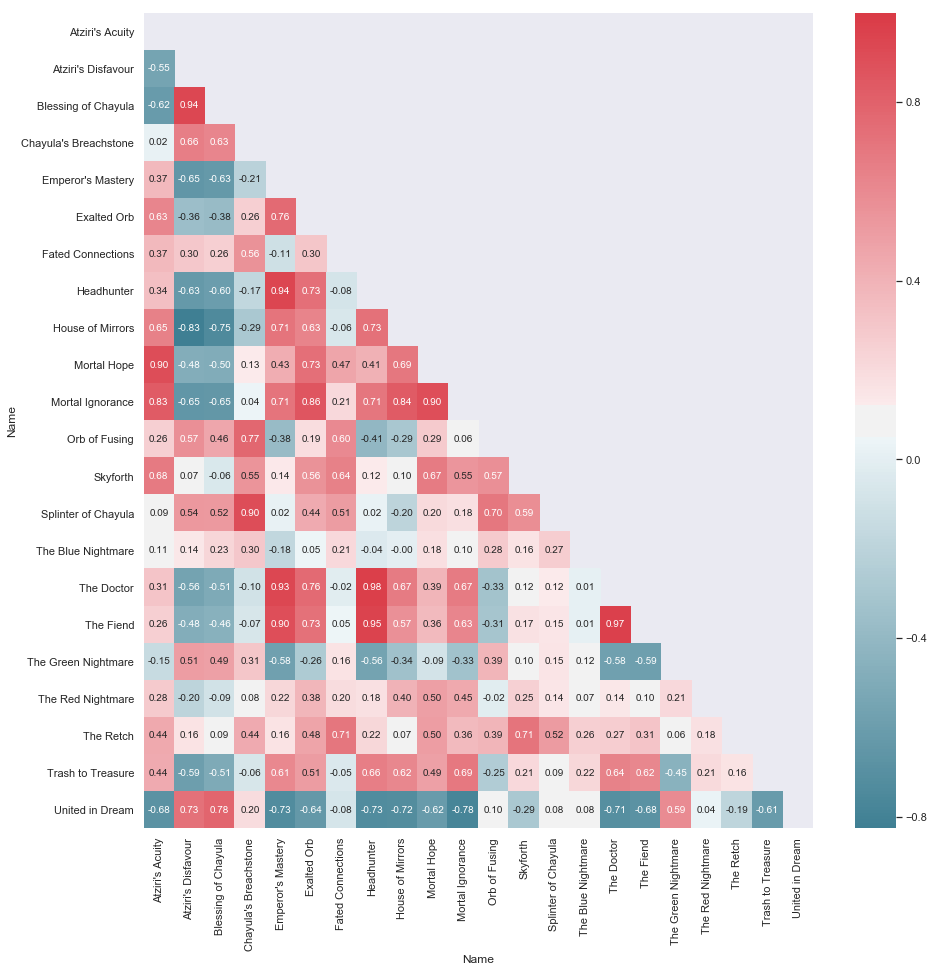

In [55]:
# Pearson Correlation heatmap
halfHeatMap(df_pivot_full, mirror = False, corrtype = "pearson")

In [56]:
# Pearson p-values
mat = df_pivot_full.values.T
K = len(df_pivot_full.columns)
p_vals = np.empty((K,K), dtype=float)

for i, ac in enumerate(mat):
    for j, bc in enumerate(mat):
        if i > j:
            continue
        else:
            corr = stats.pearsonr(ac, bc)
        p_vals[i,j] = corr[1]
        p_vals[j,i] = corr[1]

df_p = pd.DataFrame(p_vals)
df_p = df_p.set_index(df_pivot_full.columns)
df_p.columns = df_pivot_full.columns
df_p = df_p.round(6)
df_p

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
Name,,,,,,,,,,,,,,,,,,,,,
Atziri's Acuity,0.000000,0.000000,0.000000,0.857255,0.000354,0.000000,0.000402,0.001123,0.000000,0.000000,...,0.000000,0.383283,0.321996,0.003180,0.012457,0.171237,0.006880,0.000013,0.000017,0.000000
Atziri's Disfavour,0.000000,0.000000,0.000000,0.000000,0.000000,0.000554,0.004580,0.000000,0.000000,0.000002,...,0.497212,0.000000,0.179699,0.000000,0.000002,0.000000,0.066674,0.127913,0.000000,0.000000
Blessing of Chayula,0.000000,0.000000,0.000000,0.000000,0.000000,0.000249,0.014176,0.000000,0.000000,0.000001,...,0.604721,0.000000,0.031579,0.000000,0.000006,0.000001,0.383553,0.400426,0.000000,0.000000
Chayula's Breachstone,0.857255,0.000000,0.000000,0.000000,0.046818,0.012963,0.000000,0.110783,0.005864,0.229846,...,0.000000,0.000000,0.004917,0.361593,0.516029,0.003489,0.467873,0.000017,0.551856,0.064617
Emperor's Mastery,0.000354,0.000000,0.000000,0.046818,0.000000,0.000000,0.316275,0.000000,0.000000,0.000032,...,0.203578,0.842002,0.099790,0.000000,0.000000,0.000000,0.038849,0.130151,0.000000,0.000000
Exalted Orb,0.000000,0.000554,0.000249,0.012963,0.000000,0.000000,0.003766,0.000000,0.000000,0.000000,...,0.000000,0.000015,0.673303,0.000000,0.000000,0.012707,0.000205,0.000002,0.000000,0.000000
Fated Connections,0.000402,0.004580,0.014176,0.000000,0.316275,0.003766,0.000000,0.446814,0.576216,0.000003,...,0.000000,0.000000,0.045877,0.870582,0.642690,0.125960,0.066213,0.000000,0.667221,0.471357
Headhunter,0.001123,0.000000,0.000000,0.110783,0.000000,0.000000,0.446814,0.000000,0.000000,0.000053,...,0.248798,0.825510,0.722494,0.000000,0.000000,0.000000,0.095198,0.037790,0.000000,0.000000
House of Mirrors,0.000000,0.000000,0.000000,0.005864,0.000000,0.000000,0.576216,0.000000,0.000000,0.000000,...,0.338331,0.063001,0.990950,0.000000,0.000000,0.001138,0.000089,0.509344,0.000000,0.000000


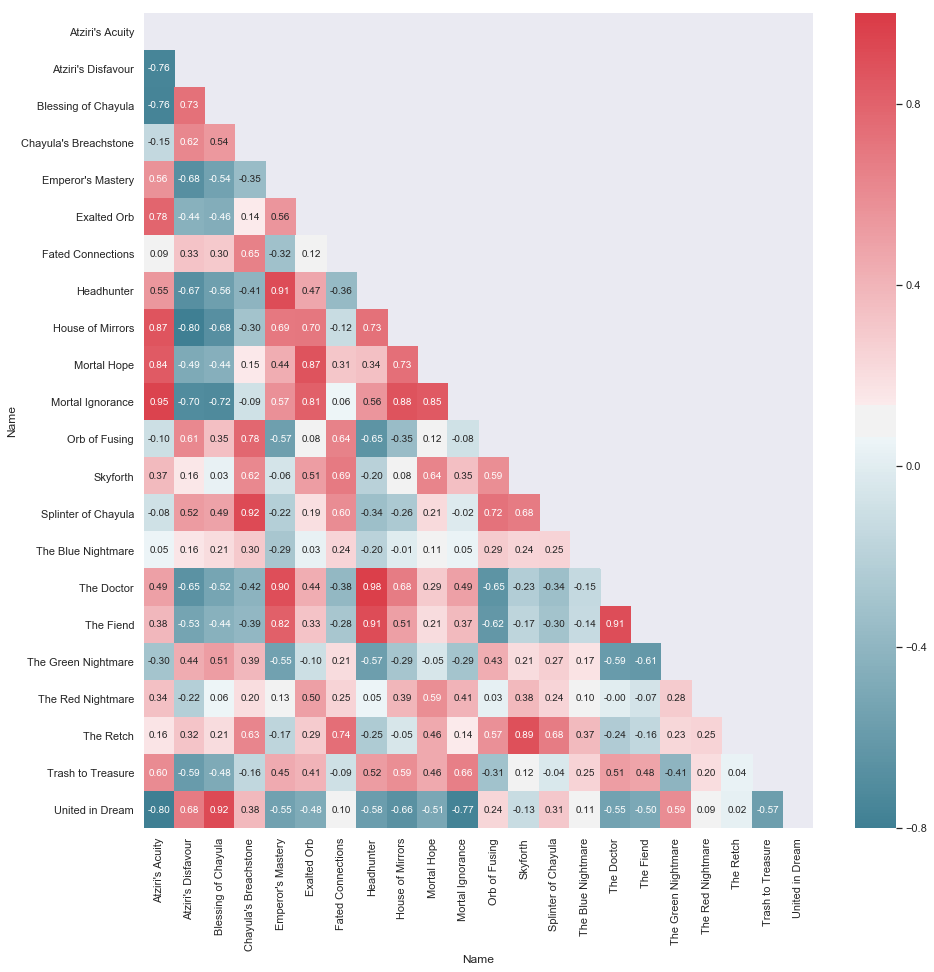

In [57]:
# Spearman Correlation heatmap
halfHeatMap(df_pivot_full, mirror = False, corrtype = "spearman")

In [58]:
mat = df_pivot_full.values.T
K = len(df_pivot_full.columns)
p_vals = np.empty((K,K), dtype=float)

for i, ac in enumerate(mat):
    for j, bc in enumerate(mat):
        if i > j:
            continue
        else:
            corr = stats.spearmanr(ac, bc)
        p_vals[i,j] = corr[1]
        p_vals[j,i] = corr[1]

df_s = pd.DataFrame(p_vals)
df_s = df_s.set_index(df_pivot_full.columns)
df_s.columns = df_pivot_full.columns
df_s = df_s.round(6)
df_s

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
Name,,,,,,,,,,,,,,,,,,,,,
Atziri's Acuity,0.000000,0.000000,0.000000,0.167978,0.000000,0.000000,0.399426,0.000000,0.000000,0.000000,...,0.000398,0.432174,0.621676,0.000001,0.000196,0.004286,0.001056,0.123870,0.000000,0.000000
Atziri's Disfavour,0.000000,0.000000,0.000000,0.000000,0.000000,0.000018,0.001704,0.000000,0.000000,0.000001,...,0.146088,0.000000,0.142965,0.000000,0.000000,0.000016,0.036672,0.002299,0.000000,0.000000
Blessing of Chayula,0.000000,0.000000,0.000000,0.000000,0.000000,0.000007,0.004023,0.000000,0.000000,0.000014,...,0.774741,0.000001,0.049751,0.000000,0.000017,0.000000,0.585733,0.052167,0.000001,0.000000
Chayula's Breachstone,0.167978,0.000000,0.000000,0.000000,0.000646,0.191869,0.000000,0.000066,0.003988,0.171654,...,0.000000,0.000000,0.004696,0.000041,0.000170,0.000184,0.055209,0.000000,0.144593,0.000253
Emperor's Mastery,0.000000,0.000000,0.000000,0.000646,0.000000,0.000000,0.002427,0.000000,0.000000,0.000020,...,0.563796,0.037645,0.006485,0.000000,0.000000,0.000000,0.233881,0.103272,0.000009,0.000000
Exalted Orb,0.000000,0.000018,0.000007,0.191869,0.000000,0.000000,0.277587,0.000003,0.000000,0.000000,...,0.000000,0.071860,0.774162,0.000019,0.001610,0.355682,0.000001,0.006624,0.000072,0.000002
Fated Connections,0.399426,0.001704,0.004023,0.000000,0.002427,0.277587,0.000000,0.000445,0.265315,0.002846,...,0.000000,0.000000,0.022347,0.000245,0.007693,0.048432,0.018397,0.000000,0.390482,0.330186
Headhunter,0.000000,0.000000,0.000000,0.000066,0.000000,0.000003,0.000445,0.000000,0.000000,0.001026,...,0.060089,0.001317,0.066751,0.000000,0.000000,0.000000,0.612646,0.017473,0.000000,0.000000
House of Mirrors,0.000000,0.000000,0.000000,0.003988,0.000000,0.000000,0.265315,0.000000,0.000000,0.000000,...,0.470987,0.013839,0.929963,0.000000,0.000000,0.005945,0.000162,0.638750,0.000000,0.000000


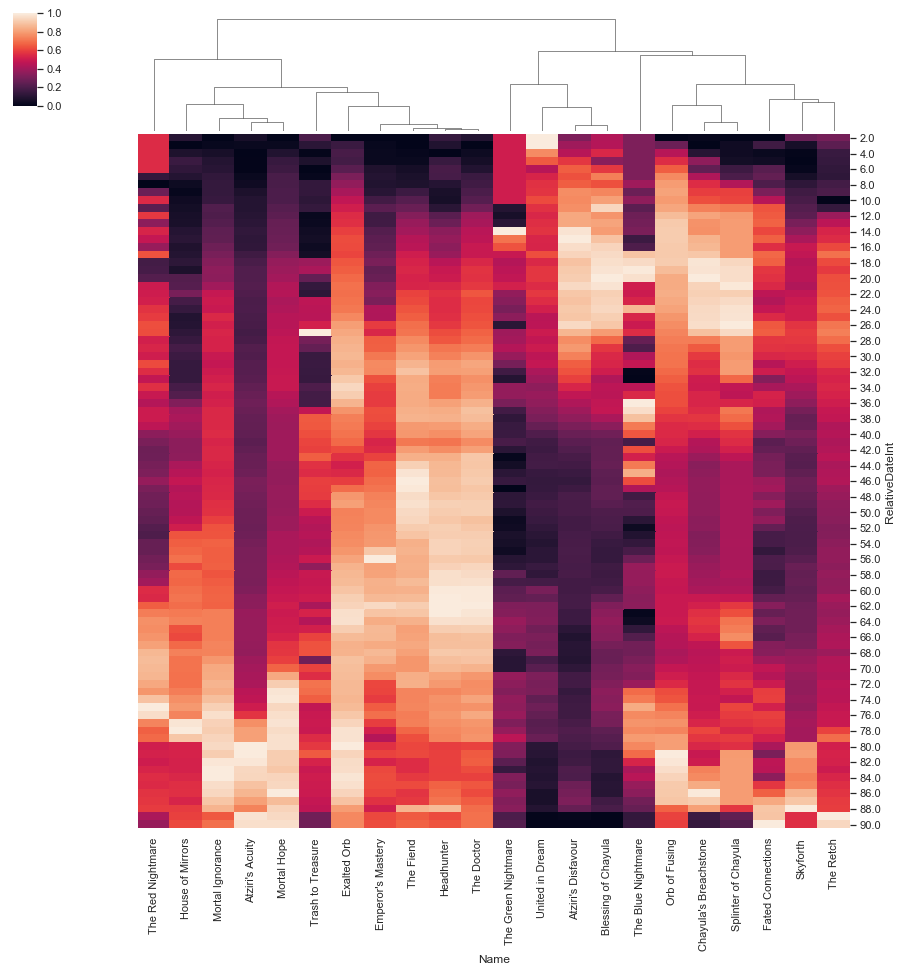

In [59]:
# Standardized clustermap of full dataframe:
df_clustermap = sns.clustermap(df_pivot_full, figsize = (15, 15), metric = "correlation", row_cluster = False, standard_scale = 1)

# Machine Learning

## Testing/Training within the same data

### Random Forest Regression

#### Data Preparation

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, roc_auc_score

In [61]:
# We choose to predict the value of exalted orbs
y = np.array(df_pivot_full["Exalted Orb"])
X = df_pivot_full.drop("Exalted Orb", axis = 1)
feature_list = list(X.columns)
X = np.array(X)

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [63]:
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (71, 21)
Training Labels Shape: (71,)
Testing Features Shape: (18, 21)
Testing Labels Shape: (18,)


#### RF Parameter Tuning

In [64]:
# n_estimators tuning
estimator_options = [10, 20, 50, 100, 200, 500, 1000]
estimator_oobs = []
for estimator in estimator_options:
    model = RandomForestRegressor(n_estimators = estimator, random_state = 42, oob_score = True)
    model.fit(X_train, y_train)
    score = model.oob_score_
    estimator_oobs.append(score)
print("OOB scores: ", estimator_oobs)

OOB scores:  [0.9034726461812549, 0.921349849208897, 0.9237025582224923, 0.9287384003470491, 0.926732474044596, 0.9235969228683735, 0.9243496079841799]


In [65]:
# max_depth tuning
depth_options = [1, 2, 4, 8, 16, 32]
depth_oobs = []
for depth in depth_options:
    model = RandomForestRegressor(n_estimators = 100, max_depth = depth, random_state = 42, oob_score = True)
    model.fit(X_train, y_train)
    score = model.oob_score_
    depth_oobs.append(score)
print("OOB scores: ", depth_oobs)

OOB scores:  [0.6841182080880727, 0.8822486351098966, 0.9258389006280311, 0.930373171185593, 0.9287384003470491, 0.9287384003470491]


In [66]:
# max_features tuning
feature_options = ["auto", "sqrt", "log2", .25, .5, .75]
feature_oobs = []
for feature in feature_options:
    model = RandomForestRegressor(n_estimators = 100, max_depth = 16, max_features = 
                                  feature, random_state = 42, oob_score = True)
    model.fit(X_train, y_train)
    score = model.oob_score_
    feature_oobs.append(score)
print("OOB scores: ", feature_oobs)

OOB scores:  [0.9287384003470491, 0.9228794054866428, 0.9228794054866428, 0.9266910840298724, 0.9304366821361567, 0.9286226785475691]


#### Model Testing On Test Data

In [67]:
rf = RandomForestRegressor(n_estimators= 100, max_depth = 16, max_features = "sqrt", random_state = 42)
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=16,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [68]:
y_predict = rf.predict(X_test)

In [69]:
print("R^2: {}".format(rf.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_predict))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.8974145401601274
Root Mean Squared Error: 4.253131843762119


In [70]:
# Quantifying variable importance
importances = list(rf.feature_importances_)
feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(feature_list, importances)]
feature_importances_sorted = sorted(feature_importances, key = lambda x: x[1], reverse = True)

In [71]:
for pair in feature_importances_sorted:
    print("Variable: {:25} Importance: {}".format(pair[0], pair[1]))

Variable: Mortal Hope               Importance: 0.1623
Variable: Emperor's Mastery         Importance: 0.1089
Variable: Atziri's Acuity           Importance: 0.0993
Variable: Headhunter                Importance: 0.0935
Variable: The Fiend                 Importance: 0.0912
Variable: The Doctor                Importance: 0.0801
Variable: Mortal Ignorance          Importance: 0.075
Variable: The Retch                 Importance: 0.0421
Variable: Skyforth                  Importance: 0.0354
Variable: Trash to Treasure         Importance: 0.0349
Variable: The Red Nightmare         Importance: 0.0316
Variable: United in Dream           Importance: 0.0247
Variable: House of Mirrors          Importance: 0.0215
Variable: The Green Nightmare       Importance: 0.0178
Variable: Chayula's Breachstone     Importance: 0.017
Variable: Blessing of Chayula       Importance: 0.0145
Variable: Orb of Fusing             Importance: 0.0133
Variable: Splinter of Chayula       Importance: 0.013
Variable: Fat

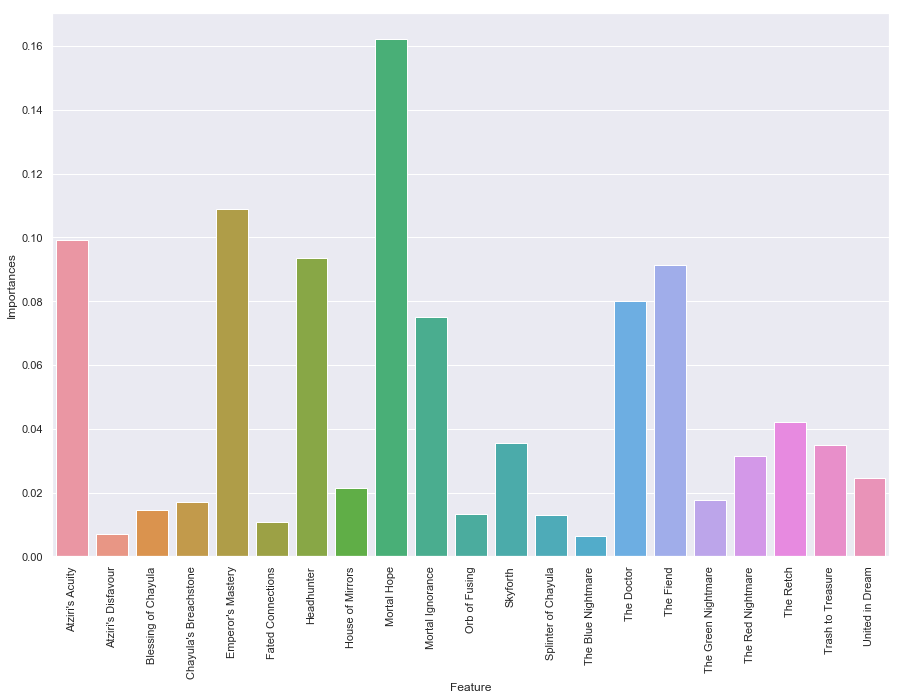

In [72]:
x_vals = list(range(len(importances)))
plt.figure(figsize = (15, 10))
sns.barplot(x_vals, importances, orientation = "vertical")
plt.xticks(x_vals, feature_list, rotation = "vertical")
plt.ylabel("Importances")
plt.xlabel("Feature")
plt.show()

In [73]:
# Construct new regressor using most important features
rf_pared = RandomForestRegressor(n_estimators= 100, max_depth = 16, max_features = "sqrt", random_state = 42)

In [74]:
feature_importances_sorted

[('Mortal Hope', 0.1623),
 ("Emperor's Mastery", 0.1089),
 ("Atziri's Acuity", 0.0993),
 ('Headhunter', 0.0935),
 ('The Fiend', 0.0912),
 ('The Doctor', 0.0801),
 ('Mortal Ignorance', 0.075),
 ('The Retch', 0.0421),
 ('Skyforth', 0.0354),
 ('Trash to Treasure', 0.0349),
 ('The Red Nightmare', 0.0316),
 ('United in Dream', 0.0247),
 ('House of Mirrors', 0.0215),
 ('The Green Nightmare', 0.0178),
 ("Chayula's Breachstone", 0.017),
 ('Blessing of Chayula', 0.0145),
 ('Orb of Fusing', 0.0133),
 ('Splinter of Chayula', 0.013),
 ('Fated Connections', 0.0106),
 ("Atziri's Disfavour", 0.0069),
 ('The Blue Nightmare', 0.0064)]

In [75]:
important_features = ["Atziri's Acuity", "Mortal Hope", "The Fiend", 
                      "Headhunter", "Emperor's Mastery", "The Doctor", 
                      "The Retch", "House of Mirrors", "Mortal Ignorance"]
important_indices = []
for feature in important_features:
    important_indices.append(feature_list.index(feature))

In [76]:
train_important = X_train[:, important_indices]
test_important = X_test[:, important_indices]
rf_pared.fit(train_important, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=16,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [77]:
predict_important = rf_pared.predict(test_important)

In [78]:
print("R^2: {}".format(rf_pared.score(test_important, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, predict_important))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.9004046062103168
Root Mean Squared Error: 4.190690306497721


### Linear Regression

In [79]:
from sklearn.linear_model import LinearRegression

In [80]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)
y_pred = linreg.predict(X_test)

In [81]:
print("R^2: {}".format(linreg.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.9361749182157731
Root Mean Squared Error: 3.3547613503428404


### K-Means Clustering

In [82]:
X_t = np.array(df_pivot_full).T
features = list(df_pivot_full.columns)

In [83]:
from sklearn.cluster import KMeans

In [84]:
# Finding number of clusters
inertias = []
for k in range(2, 15):
    k_means = KMeans(n_clusters = k)
    k_means.fit(X_t)
    inertias.append(k_means.inertia_)

Text(0.5,1,'Elbow Curve')

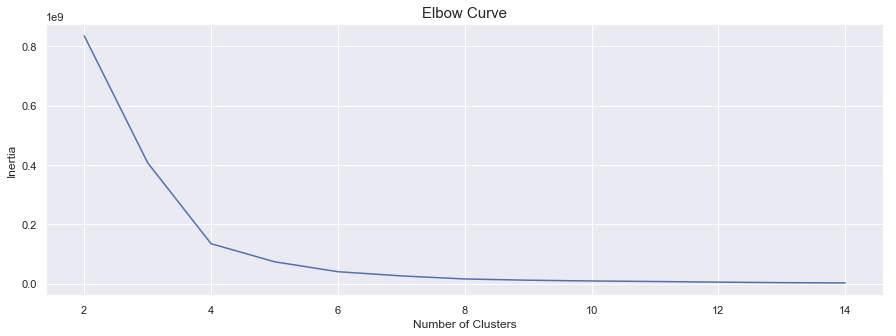

In [85]:
plt.figure(figsize = (15, 5))
ax = sns.lineplot(x = range(2, 15), y = inertias)
ax.set_xlabel("Number of Clusters", fontsize = 12)
ax.set_ylabel("Inertia", fontsize = 12)
ax.set_title("Elbow Curve", fontsize = 15)

In [86]:
# Setting n_clusters = 6
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer, normalize

In [87]:
normalizer = Normalizer()
kmeans = KMeans(n_clusters = 6)
pipeline = make_pipeline(normalizer, kmeans)

In [88]:
pipeline.fit(X_t)
labels = pipeline.predict(X_t)

In [89]:
df = pd.DataFrame({'Labels': labels, 'Name': features})
df = df.sort_values("Labels").reset_index(drop = True)
df

,Labels,Name
0,0,Trash to Treasure
1,1,Emperor's Mastery
2,1,Exalted Orb
3,1,Headhunter
4,1,The Fiend
5,1,The Doctor
6,2,The Retch
7,2,The Red Nightmare
8,2,Chayula's Breachstone
9,2,Fated Connections


### Hierarchical clustering

In [90]:
from scipy.cluster.hierarchy import linkage, dendrogram

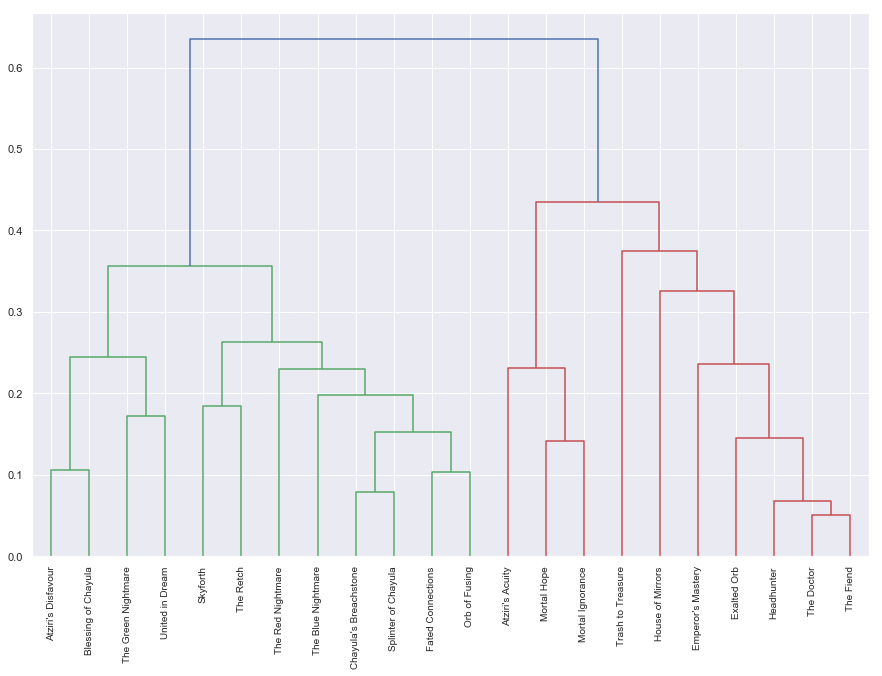

In [91]:
X_norm = normalize(X_t)
mergings = linkage(X_norm, method = "complete")
plt.figure(figsize = (15, 10))
dendrogram(mergings, labels = features, leaf_rotation = 90)
plt.show()

### t-SNE Map

In [92]:
from sklearn.manifold import TSNE

In [93]:
model = TSNE(learning_rate= 50)
tsne_features = model.fit_transform(X_norm)

In [94]:
xs = tsne_features[:, 0]
ys = tsne_features[:, 1]

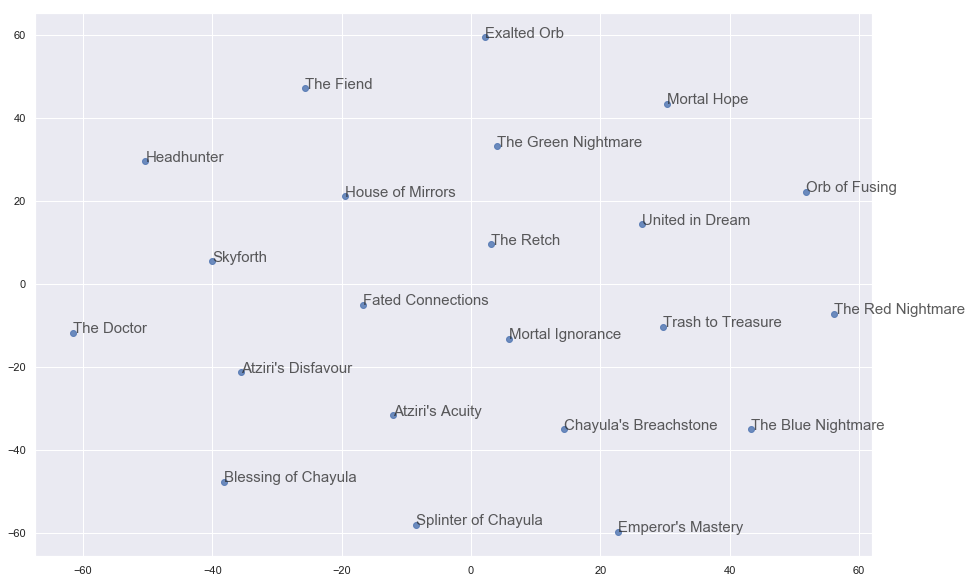

In [95]:
plt.figure(figsize = (15, 10))
sns.regplot(x = xs, y = ys, fit_reg = False)
for x, y, feature in zip(xs, ys, features):
    plt.annotate(feature, (x, y), fontsize=15, alpha=0.75)
plt.show()

## Forecasting with ARMIA

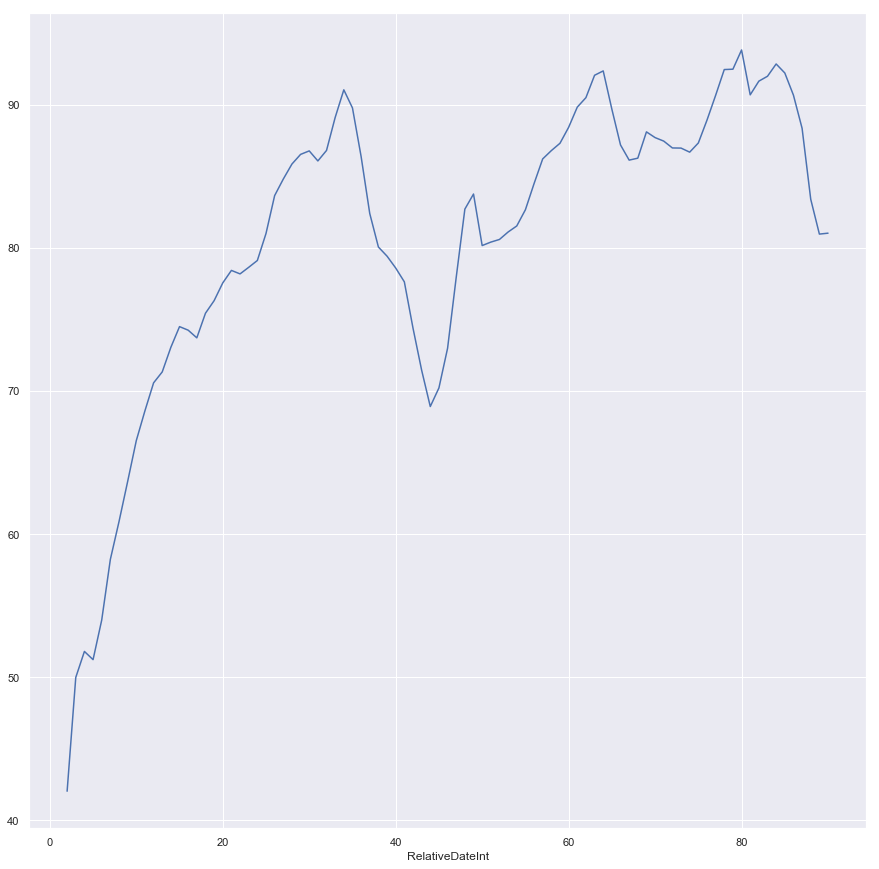

In [96]:
exalt_data = df_pivot_full["Exalted Orb"]
exalt_data.plot(figsize = (15, 15))
plt.show()

In [97]:
p = d = range(0, 2)
q = range(2, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in pdq]

In [98]:
# Print all AIC values
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(exalt_data,
                                           order = param,
                                           seasonal_order = param_seasonal,
                                           enforce_stationary = False,
                                           enforce_invertibility = False)
            results = mod.fit()
            print('ARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 2)x(0, 0, 2, 7) - AIC:642.9418054774859
ARIMA(0, 0, 2)x(0, 0, 3, 7) - AIC:590.9810737544587
ARIMA(0, 0, 2)x(0, 1, 2, 7) - AIC:421.5112065287573
ARIMA(0, 0, 2)x(0, 1, 3, 7) - AIC:3455.7684077071262
ARIMA(0, 0, 2)x(1, 0, 3, 7) - AIC:482.3923102222093
ARIMA(0, 0, 2)x(1, 1, 2, 7) - AIC:422.93726138518184
ARIMA(0, 0, 2)x(1, 1, 3, 7) - AIC:3383.952814075535
ARIMA(0, 0, 3)x(0, 0, 2, 7) - AIC:659.6637300804591
ARIMA(0, 0, 3)x(0, 0, 3, 7) - AIC:609.6046252327103
ARIMA(0, 0, 3)x(0, 1, 2, 7) - AIC:401.8292592132572
ARIMA(0, 0, 3)x(0, 1, 3, 7) - AIC:3649.6854950710663
ARIMA(0, 0, 3)x(1, 0, 3, 7) - AIC:478.691903372037
ARIMA(0, 0, 3)x(1, 1, 2, 7) - AIC:403.72182718635906
ARIMA(0, 0, 3)x(1, 1, 3, 7) - AIC:3122.63380445471
ARIMA(0, 1, 2)x(0, 0, 2, 7) - AIC:341.12478330404423
ARIMA(0, 1, 2)x(0, 0, 3, 7) - AIC:342.7516216558155
ARIMA(0, 1, 2)x(0, 1, 2, 7) - AIC:328.6866096026646
ARIMA(0, 1, 2)x(0, 1, 3, 7) - AIC:2189.777673955112
ARIMA(0, 1, 2)x(1, 0, 2, 7) - AIC:343.0225171903063
ARIMA(0, 

In [99]:
aic_value = 5000
params = [0, 0]
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(exalt_data,
                                           order = param,
                                           seasonal_order = param_seasonal,
                                           enforce_stationary = False,
                                           enforce_invertibility = False)
            results = mod.fit()
            if results.aic < aic_value:
                aic_value = results.aic
                params[0] = param
                params[1] = param_seasonal
            #print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

In [100]:
aic_value

328.6866096026646

In [101]:
params

[(0, 1, 2), (0, 1, 2, 7)]

In [102]:
mod = sm.tsa.statespace.SARIMAX(exalt_data,
                               order = (0, 1, 2),
                               seasonal_order = (0, 1, 2, 7),
                               enforce_stationarity = False,
                               enforce_invertibility = False)
results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.6623      0.116      5.730      0.000       0.436       0.889
ma.L2          0.4008      0.132      3.046      0.002       0.143       0.659
ma.S.L7       -0.7274      0.130     -5.581      0.000      -0.983      -0.472
ma.S.L14       0.0010      0.164      0.006      0.995      -0.320       0.322
sigma2         2.2840      0.402      5.680      0.000       1.496       3.072


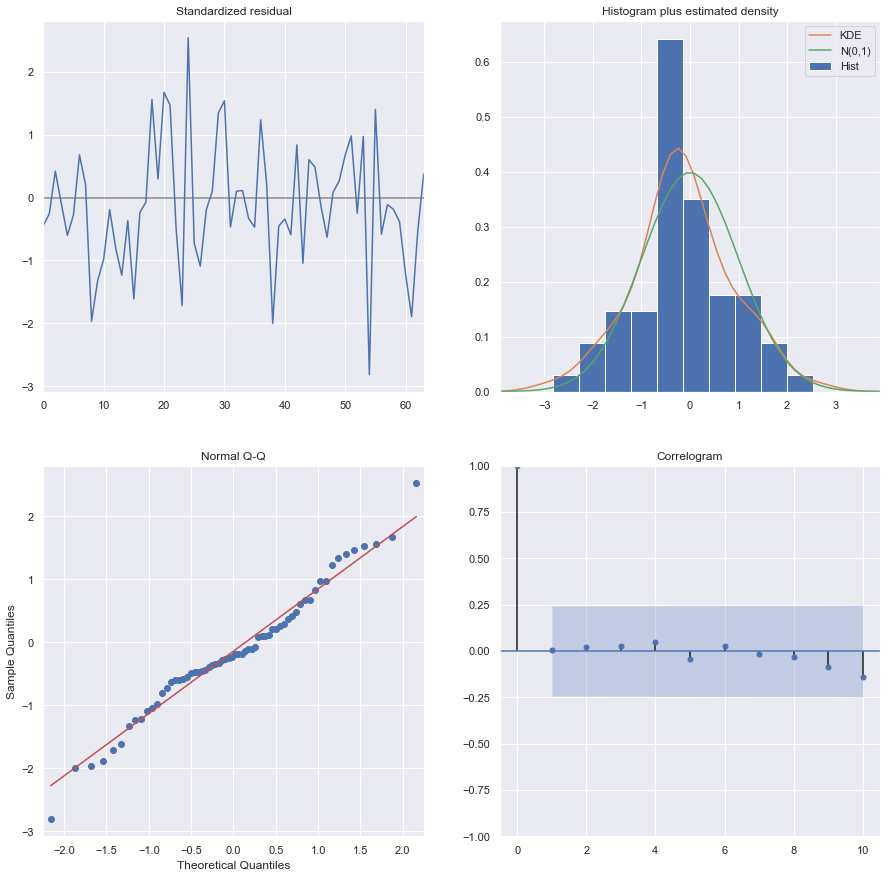

In [103]:
results.plot_diagnostics(figsize = (15, 15))
plt.show()

In [104]:
pred = results.get_prediction(start = 50, dynamic = False)
pred_ci = pred.conf_int()

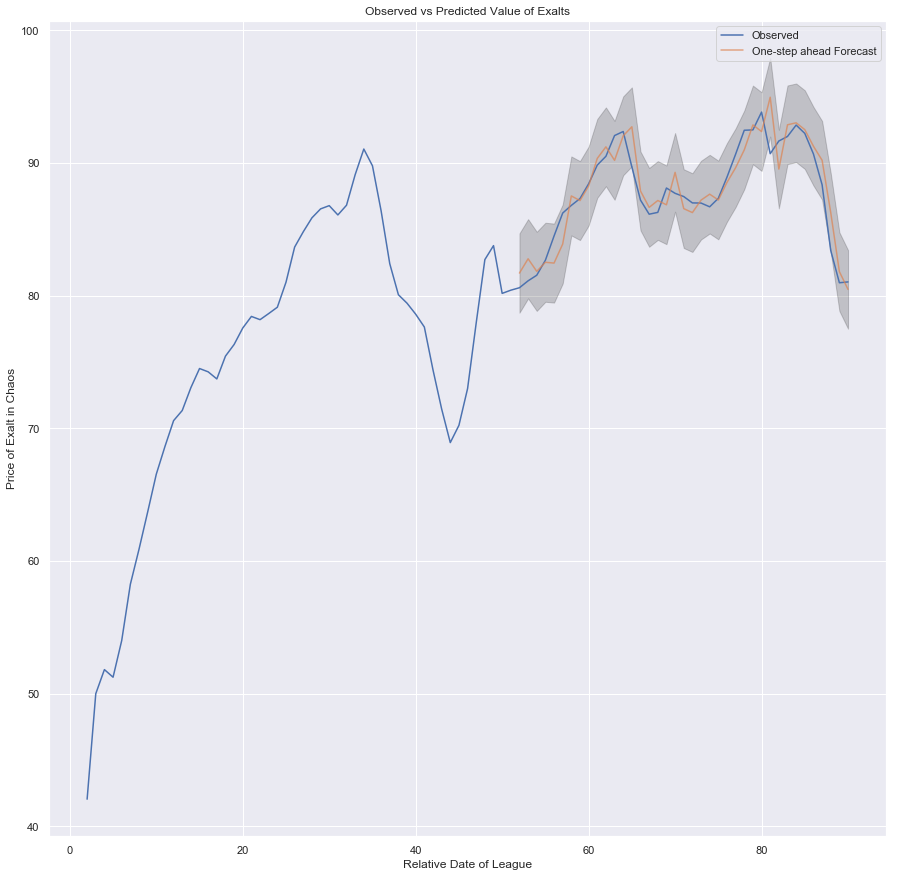

In [105]:
plt.figure(figsize = (15, 15))
ax = exalt_data[2:].plot(label = "Observed")
pred.predicted_mean.plot(ax = ax, label = "One-step ahead Forecast", alpha = .7)

ax.fill_between(pred_ci.index,
               pred_ci.iloc[:, 0],
               pred_ci.iloc[:, 1], color = "k", alpha = .2)
ax.set_xlabel("Relative Date of League")
ax.set_ylabel("Price of Exalt in Chaos")
ax.set_title("Observed vs Predicted Value of Exalts")

plt.legend()
plt.show()

## Testing On New Data

### Importing Test Data

In [106]:
t1_currency = pd.read_csv("test_1_currency.csv", delimiter = ";", low_memory= False)
t1_currency_edited = currency_file_clean(t1_currency)
t1_item = pd.read_csv("test_1_items.csv", delimiter = ";", low_memory = False)
t1_item_pared = add_relative_date(t1_item)
t1_item_df = t1_item_pared[["League", "Name", "Value", "RelativeDateInt"]].reset_index(drop = True)

t1_chaos_norm = t1_currency_edited[t1_currency_edited.Pay == "Chaos Orb"].reset_index(drop = True)
t1_chaos_norm_mapped = t1_chaos_norm.rename(columns = {"Get" : "Name"})
t1_chaos_edited = t1_chaos_norm_mapped[["League", "Name", "Value", "RelativeDateInt"]]
t1_chaos_edited.reset_index(drop = True)

t1_edited_df = pd.concat([t1_item_df, t1_chaos_edited], axis = 0)
t1_edited_df = t1_edited_df[(t1_edited_df["RelativeDateInt"] <= 90) & (t1_edited_df["RelativeDateInt"] > 1)]
t1_pared_df = t1_edited_df.loc[t1_edited_df["Name"].isin(correlated_items_list)]
t1_pared_df.reset_index(drop = True, inplace = True)

t1_pared_grouped = t1_pared_df.groupby(["Name", "RelativeDateInt"])["Value"].agg("median")
df = t1_pared_grouped.to_frame().reset_index()
t1_pivot = df.pivot(index = "RelativeDateInt", columns = "Name", values = "Value")

t1_pivot = t1_pivot.bfill(axis = 0).ffill(axis = 0)

In [107]:
t2_currency = pd.read_csv("test_2_currency.csv", delimiter = ";", low_memory= False)
t2_currency_edited = currency_file_clean(t2_currency)
t2_item = pd.read_csv("test_2_items.csv", delimiter = ";", low_memory = False)
t2_item_pared = add_relative_date(t2_item)
t2_item_df = t2_item_pared[["League", "Name", "Value", "RelativeDateInt"]].reset_index(drop = True)

t2_chaos_norm = t2_currency_edited[t2_currency_edited.Pay == "Chaos Orb"].reset_index(drop = True)
t2_chaos_norm_mapped = t2_chaos_norm.rename(columns = {"Get" : "Name"})
t2_chaos_edited = t2_chaos_norm_mapped[["League", "Name", "Value", "RelativeDateInt"]]
t2_chaos_edited.reset_index(drop = True)

t2_edited_df = pd.concat([t2_item_df, t2_chaos_edited], axis = 0)
t2_edited_df = t2_edited_df[(t2_edited_df["RelativeDateInt"] <= 90) & (t2_edited_df["RelativeDateInt"] > 1)]
t2_pared_df = t2_edited_df.loc[t2_edited_df["Name"].isin(correlated_items_list)]
t2_pared_df.reset_index(drop = True, inplace = True)

t2_pared_grouped = t2_pared_df.groupby(["Name", "RelativeDateInt"])["Value"].agg("median")
df = t2_pared_grouped.to_frame().reset_index()
t2_pivot = df.pivot(index = "RelativeDateInt", columns = "Name", values = "Value")

t2_pivot = t2_pivot.bfill(axis = 0).ffill(axis = 0)

### Training On Whole Dataset

In [108]:
y = np.array(df_pivot_full["Exalted Orb"])
X = df_pivot_full.drop("Exalted Orb", axis = 1)
feature_list = list(X.columns)
X = np.array(X)

print(X.shape, y.shape)

(89, 21) (89,)


In [109]:
# n_estimators tuning
estimator_options = [10, 20, 50, 100, 200, 500, 1000]
estimator_oobs = []
for estimator in estimator_options:
    model = RandomForestRegressor(n_estimators = estimator, random_state = 42, oob_score = True)
    model.fit(X, y)
    score = model.oob_score_
    estimator_oobs.append(score)
print("OOB scores: ", estimator_oobs)

OOB scores:  [0.8846989529886341, 0.9099905426973158, 0.9073717660848277, 0.9100351514895189, 0.9220296422583606, 0.9238052129077432, 0.9243877531591895]


In [110]:
# max_depth tuning
depth_options = [1, 2, 4, 8, 16, 32]
depth_oobs = []
for depth in depth_options:
    model = RandomForestRegressor(n_estimators = 200, max_depth = depth, random_state = 42, oob_score = True)
    model.fit(X, y)
    score = model.oob_score_
    depth_oobs.append(score)
print("OOB scores: ", depth_oobs)

OOB scores:  [0.6869754815445893, 0.8672172443422379, 0.9122278128094304, 0.9216965363893581, 0.9220296422583606, 0.9220296422583606]


In [111]:
# max_features tuning
feature_options = ["auto", "sqrt", "log2", .25, .5, .75]
feature_oobs = []
for feature in feature_options:
    model = RandomForestRegressor(n_estimators = 200, max_depth = 16, max_features = 
                                  feature, random_state = 42, oob_score = True)
    model.fit(X, y)
    score = model.oob_score_
    feature_oobs.append(score)
print("OOB scores: ", feature_oobs)

OOB scores:  [0.9220296422583606, 0.9374622037888145, 0.9374622037888145, 0.9393020770133935, 0.935998137623986, 0.9286211882706767]


In [112]:
rf_whole = RandomForestRegressor(n_estimators = 200, max_depth = 16, max_features = .25, random_state = 42)
rf_whole.fit(X, y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=16,
           max_features=0.25, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [113]:
# Feature Selection
importances = list(rf_whole.feature_importances_)
feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(feature_list, importances)]
feature_importances_sorted = sorted(feature_importances, key = lambda x: x[1], reverse = True)

for pair in feature_importances_sorted:
    print("Variable: {:25} Importance: {}".format(pair[0], pair[1]))

Variable: Mortal Hope               Importance: 0.2061
Variable: Atziri's Acuity           Importance: 0.1303
Variable: Headhunter                Importance: 0.1053
Variable: Mortal Ignorance          Importance: 0.1031
Variable: The Doctor                Importance: 0.0812
Variable: The Fiend                 Importance: 0.0739
Variable: Emperor's Mastery         Importance: 0.0714
Variable: The Retch                 Importance: 0.0403
Variable: The Red Nightmare         Importance: 0.0217
Variable: Trash to Treasure         Importance: 0.0215
Variable: House of Mirrors          Importance: 0.0202
Variable: Splinter of Chayula       Importance: 0.0185
Variable: Skyforth                  Importance: 0.0168
Variable: United in Dream           Importance: 0.0165
Variable: Orb of Fusing             Importance: 0.0147
Variable: Fated Connections         Importance: 0.0125
Variable: Chayula's Breachstone     Importance: 0.0123
Variable: Blessing of Chayula       Importance: 0.0108
Variable: 

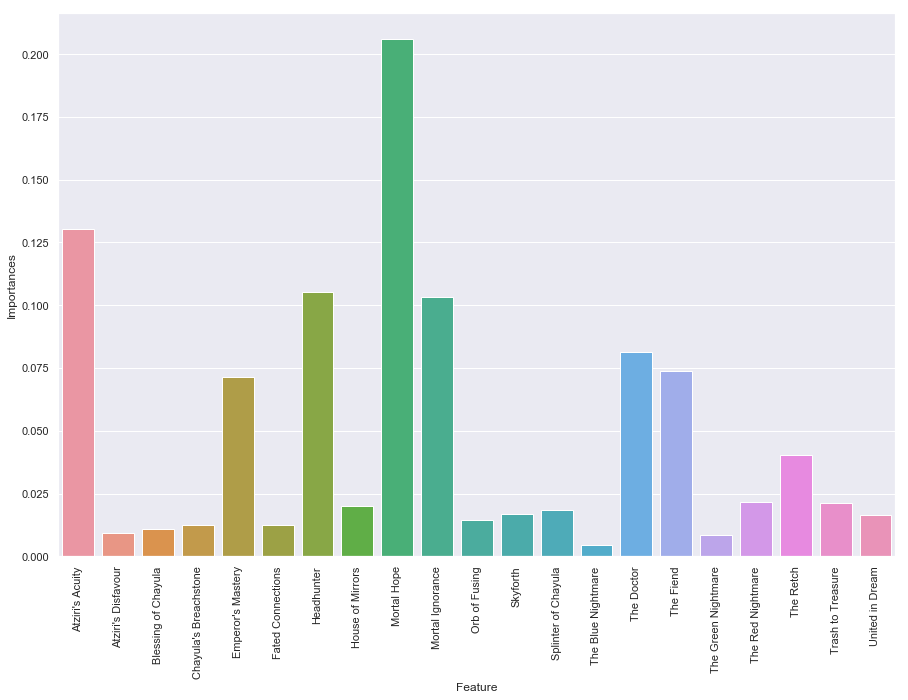

In [114]:
x_vals = list(range(len(importances)))
plt.figure(figsize = (15, 10))
sns.barplot(x_vals, importances, orientation = "vertical")
plt.xticks(x_vals, feature_list, rotation = "vertical")
plt.ylabel("Importances")
plt.xlabel("Feature")
plt.show()

In [115]:
rf_whole_important = RandomForestRegressor(n_estimators = 200, max_depth = 16, max_features = .25, random_state = 42)
feature_importances_sorted

[('Mortal Hope', 0.2061),
 ("Atziri's Acuity", 0.1303),
 ('Headhunter', 0.1053),
 ('Mortal Ignorance', 0.1031),
 ('The Doctor', 0.0812),
 ('The Fiend', 0.0739),
 ("Emperor's Mastery", 0.0714),
 ('The Retch', 0.0403),
 ('The Red Nightmare', 0.0217),
 ('Trash to Treasure', 0.0215),
 ('House of Mirrors', 0.0202),
 ('Splinter of Chayula', 0.0185),
 ('Skyforth', 0.0168),
 ('United in Dream', 0.0165),
 ('Orb of Fusing', 0.0147),
 ('Fated Connections', 0.0125),
 ("Chayula's Breachstone", 0.0123),
 ('Blessing of Chayula', 0.0108),
 ("Atziri's Disfavour", 0.0094),
 ('The Green Nightmare', 0.0086),
 ('The Blue Nightmare', 0.0047)]

In [116]:
important_features = ["Mortal Hope", "Atziri's Acuity", "Mortal Ignorance", 
                      "Headhunter", "The Doctor", "The Fiend", "Emperor's Mastery"]
important_indices = []
for feature in important_features:
    important_indices.append(feature_list.index(feature))

In [117]:
X_train_important = X[:, important_indices]
rf_whole_important.fit(X_train_important, y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=16,
           max_features=0.25, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

### Testing Data

#### Test Data Set - Beastiary

In [118]:
y_test1 = np.array(t1_pivot["Exalted Orb"])
X_test1 = t1_pivot.drop("Exalted Orb", axis = 1)
feature_list = list(X_test1.columns)
X_test1 = np.array(X_test1)

print(X_test1.shape, y_test1.shape)

(86, 21) (86,)


In [119]:
# Testing without selection
y_predict = rf_whole.predict(X_test1)
print("R^2: {}".format(rf_whole.score(X_test1, y_test1)))
rmse = np.sqrt(mean_squared_error(y_test1, y_predict))
print("Root Mean Squared Error: {}".format(rmse))

R^2: -0.6924417055767746
Root Mean Squared Error: 37.48382511409308


In [120]:
#Testing with selection
X_test1_important = t1_pivot[important_features]
X_test1_important = np.array(X_test1_important)
y_predict = rf_whole_important.predict(X_test1_important)
print("R^2: {}".format(rf_whole_important.score(X_test1_important, y_test1)))
rmse = np.sqrt(mean_squared_error(y_test1, y_predict))
print("Root Mean Squared Error: {}".format(rmse))

R^2: -0.476346727637078
Root Mean Squared Error: 35.009122587442704


#### Test Data Set - Incursion

In [121]:
y_test2 = np.array(t2_pivot["Exalted Orb"])
X_test2 = t2_pivot.drop("Exalted Orb", axis = 1)
feature_list = list(X_test2.columns)
X_test2 = np.array(X_test2)

print(X_test2.shape, y_test2.shape)

(87, 21) (87,)


In [122]:
# Testing without selection
y_predict = rf_whole.predict(X_test2)
print("R^2: {}".format(rf_whole.score(X_test2, y_test2)))
rmse = np.sqrt(mean_squared_error(y_test2, y_predict))
print("Root Mean Squared Error: {}".format(rmse))

R^2: -0.5778708491414011
Root Mean Squared Error: 33.447913714812636


In [123]:
#Testing with selection
X_test2_important = t2_pivot[important_features]
X_test2_important = np.array(X_test2_important)
y_predict = rf_whole_important.predict(X_test2_important)
print("R^2: {}".format(rf_whole_important.score(X_test2_important, y_test2)))
rmse = np.sqrt(mean_squared_error(y_test2, y_predict))
print("Root Mean Squared Error: {}".format(rmse))

R^2: -0.445839055056128
Root Mean Squared Error: 32.01793242588922
